
# Diplomatura en Ciencia de Datos, Aprendizaje Automático y sus Aplicaciones
---

<p style="text-align: center;">
<img src=http://www2.famaf.unc.edu.ar/~efernandez/egeo/img/logos/famaf.jpg width=40%>
</p>

 Universidad Nacional de Córdoba

---

## Practico: Aprendizaje No Supervisado

### Importación de librerías 

In [1]:
import pandas as pd 
import numpy as np
import warnings
import seaborn as sns
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans,MeanShift,DBSCAN 
from sklearn import decomposition
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from sklearn import metrics
from tslearn.clustering import TimeSeriesKMeans
import statsmodels.api as sm

warnings.filterwarnings('ignore')

C:\Users\anto_\.conda\envs\diplodatos-ayvd\lib\site-packages\tslearn\bases\bases.py:15: UserWarning: h5py not installed, hdf5 features will not be supported.
Install h5py to use hdf5 features: http://docs.h5py.org/
  warn(h5py_msg)


### Lectura de los datasets

In [2]:
df_orig_mensual = pd.read_parquet("preprocesado_no_supervisado_agrupado.parquet")

In [3]:
df = df_orig_mensual.drop(columns = ['anio_mes_cupon', 'client_edad', 'client_domicilio_codigo_postal'])

In [4]:
df_dni = df_orig_mensual.copy()

In [5]:
# Funciones de agregacion para cada columna
aggr = {} 
aggr.update(dict.fromkeys([x for x in df_dni.columns.values if 'client_' in x], 'max'))
aggr.update(dict.fromkeys([x for x in df_dni.columns.values if 'mean_' in x], 'max'))
aggr.update(dict.fromkeys([x for x in df_dni.columns.values if 'geodist_cp' in x], 'max'))
aggr.update(dict.fromkeys([x for x in df_dni.columns.values if 'trans_' in x], 'sum'))
aggr.update({'monto_ajustado':'sum'})

# Agrupamiento
group = ['dni_titular_movimiento']

df_dni = df_dni.groupby(group).agg(aggr).reset_index() # edad y antiguedad

In [6]:
df_dni.shape

(844, 44)

### Escalado

In [7]:
# Preprocessing
features = df.columns
dni = 'dni_titular_movimiento'
target = 'fg_aumentado'

features = features[(features != dni) & (features != target)]

In [8]:
len(features)

42

Usamos StandardScaler para mantener la distribución de las variables

In [9]:
scaler = StandardScaler()
df_escalado = pd.DataFrame(scaler.fit_transform(df[features]), columns=features)
df_escalado = pd.merge(df[[dni, target]], df_escalado, left_index=True, right_index=True)

In [10]:
df.shape

(10128, 44)

In [11]:
df_dni_escalado = pd.DataFrame(scaler.fit_transform(df_dni.drop(columns=[dni])), columns=df_dni.columns.values[1:])
df_dni_escalado = pd.merge(df_dni[[dni]], df_dni_escalado, left_index=True, right_index=True)
df_dni_escalado

,dni_titular_movimiento,client_edad,client_antig,client_domicilio_codigo_postal,mean_cargo,mean_sexo,mean_est_civil,mean_reg,mean_nivel_estud,mean_est_viv,...,trans__x3_1,trans__x3_2,trans__x3_3,trans__x3_4,trans__x3_5,trans__x3_6,trans__x3_7,trans__x3_8,trans__x3_9,monto_ajustado
0,000000b5aea2c9ea7cc155f6ebcef97f826,-0.144445,1.605373,-0.699434,-0.682480,0.772625,-0.477080,-0.590647,1.522703,0.235952,...,-0.653960,-0.324858,-0.186073,-0.118192,-0.603529,-0.186635,-0.110934,-0.124464,-0.431250,-0.903275
1,00000b8415f19846d12e852ebd0d52ec432,-0.907085,0.097553,0.578618,-0.682480,-0.766934,-0.477080,0.199692,-0.053315,-2.087392,...,0.085720,-0.324858,-0.186073,-0.118192,1.204574,-0.186635,-0.110934,-0.124464,-0.388794,0.641530
2,00000d109ca5a0c6b3e76295f0292c38189,0.046214,-0.383936,-1.326138,-0.682480,0.772625,-0.477080,-0.590647,-0.053315,0.235952,...,-0.653960,-0.324858,-0.186073,-0.118192,-0.603529,-0.186635,-0.110934,-0.124464,-0.431250,-0.902977
3,000017309738c042c2ec144d5d3d3632673,-0.779978,-0.548656,0.155619,-0.682480,-0.766934,-0.477080,1.335803,-0.053315,0.235952,...,-0.653960,-0.324858,0.937463,-0.118192,-0.603529,-0.186635,-0.110934,-0.124464,0.248046,-0.312646
4,00001b02afa8956b08af05c339039882046,-0.207999,0.046870,0.306510,0.276532,-0.766934,1.272426,-0.590647,-0.053315,0.235952,...,1.529857,4.306995,-0.186073,-0.118192,1.349222,-0.186635,-0.110934,-0.124464,-0.431250,0.736240
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
839,000ef071e95351afc1149fa1afe4862a079,-1.161298,-0.510644,0.130470,-0.682480,-0.766934,-0.477080,1.335803,1.522703,0.235952,...,-0.336954,3.020369,-0.186073,-0.118192,1.566194,-0.186635,-0.110934,-0.124464,-0.091602,1.646223
840,000ef0bc6859b57ec9cc7db583dd73ca697,-0.398658,-0.814742,2.519589,-0.682480,0.772625,-0.477080,0.792445,0.381448,0.235952,...,-0.653960,-0.324858,-0.186073,-0.118192,-0.241909,-0.186635,-0.110934,-0.124464,0.969797,-0.360729
841,000ef64a5f2323a3979805450f2e890c495,-1.161298,0.401651,0.317073,0.983173,0.772625,-0.477080,-0.590647,-0.053315,0.235952,...,1.001514,-0.324858,-0.186073,-0.118192,-0.169585,-0.186635,-0.110934,-0.124464,-0.388794,0.565488
842,000eff02871f717d5c860eae9e0347a5523,0.300427,-0.738717,0.792885,-0.682480,0.772625,1.272426,-0.590647,0.381448,0.235952,...,-0.653960,0.189793,-0.061235,-0.118192,0.481332,-0.186635,-0.110934,-0.124464,0.078222,-0.435141


## Analisis con Embeddings

#### PCA

Aplicamos PCA sobre sobre el conjunto de datos para trabajar solo con aquellas variables que mejor explican la varianza de nuestros datos.

In [12]:
# Fit
pca = PCA (n_components=None)
pca_result = pca.fit_transform(df_escalado[features])

In [13]:
pca.explained_variance_ratio_.round(2)

array([0.17, 0.07, 0.05, 0.05, 0.04, 0.04, 0.04, 0.03, 0.03, 0.03, 0.03,
       0.03, 0.02, 0.02, 0.02, 0.02, 0.02, 0.02, 0.02, 0.02, 0.02, 0.02,
       0.02, 0.02, 0.02, 0.02, 0.02, 0.02, 0.01, 0.01, 0.01, 0.01, 0.01,
       0.01, 0.01, 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ])

In [14]:
pca_result.shape

(10128, 42)

<AxesSubplot:title={'center':'Porcentaje de la varianza total de los datos, \n explicada por cada componente principal \n'}>

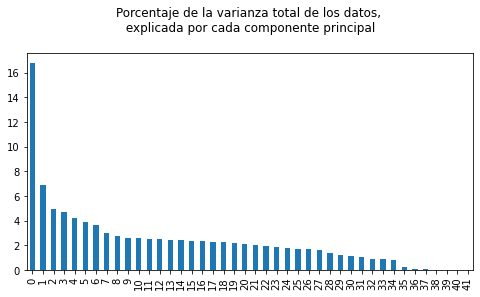

In [15]:
plt.figure(figsize=(8,4))
plt.title("Porcentaje de la varianza total de los datos, \n explicada por cada componente principal \n")
pd.Series(pca.explained_variance_ratio_.round(6)*100).plot(kind='bar')

In [16]:
acc_variance_percent = np.cumsum(np.round(pca.explained_variance_ratio_.round(2), decimals=4) * 100)
acc_variance_percent

array([ 17.,  24.,  29.,  34.,  38.,  42.,  46.,  49.,  52.,  55.,  58.,
        61.,  63.,  65.,  67.,  69.,  71.,  73.,  75.,  77.,  79.,  81.,
        83.,  85.,  87.,  89.,  91.,  93.,  94.,  95.,  96.,  97.,  98.,
        99., 100., 100., 100., 100., 100., 100., 100., 100.])

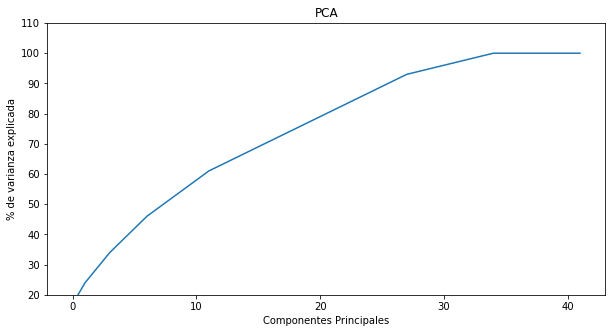

In [17]:
#plt.xticks(range(model['pca'].n_components))

plt.figure(figsize=(10, 5))
plt.ylabel('% de varianza explicada')
plt.xlabel('Componentes Principales')
plt.title('PCA')
plt.ylim(20, 110)
plt.xticks(pca.n_components)
plt.plot(acc_variance_percent)
plt.show()

Observamos que existen 19 componentes principales que nos explican el 75% de la varianza de nuestros datos, por lo cual procedemos a incorporar los mismos al dataset de trabajo.

In [18]:
pca_cols = [f'pca_{x}' for x in range(1,20)]
df_pca_final = pd.DataFrame(pca_result[:,:19], columns = pca_cols)
df_pca = pd.merge(df[[dni, target]], df_pca_final, left_index=True, right_index=True)
df_pca

,dni_titular_movimiento,fg_aumentado,pca_1,pca_2,pca_3,pca_4,pca_5,pca_6,pca_7,pca_8,...,pca_10,pca_11,pca_12,pca_13,pca_14,pca_15,pca_16,pca_17,pca_18,pca_19
0,000000b5aea2c9ea7cc155f6ebcef97f826,0,-2.172938,-0.308233,1.506251,0.197290,-0.118870,-0.085409,-0.336156,-0.002476,...,-0.415513,-0.133621,0.151824,-0.575645,-0.501062,0.711840,-0.745799,-0.553676,-1.153545,0.399279
1,000000b5aea2c9ea7cc155f6ebcef97f826,0,-1.861384,-0.370582,1.394892,0.244533,-0.404208,-0.171829,-0.363350,0.076120,...,-0.323531,-0.190155,0.070009,-0.466439,-0.463794,0.633094,-0.657858,-0.466410,-0.971133,0.308996
2,000000b5aea2c9ea7cc155f6ebcef97f826,0,-1.877017,-0.375482,1.419741,0.241148,-0.392347,-0.172319,-0.355073,0.096330,...,-0.314812,-0.237062,0.021310,-0.358320,-0.474417,0.543499,-0.566162,-0.357077,-0.804571,0.245851
3,000000b5aea2c9ea7cc155f6ebcef97f826,0,-1.892649,-0.380383,1.444591,0.237763,-0.380486,-0.172810,-0.346796,0.116540,...,-0.306094,-0.283968,-0.027390,-0.250201,-0.485039,0.453903,-0.474466,-0.247745,-0.638009,0.182707
4,000000b5aea2c9ea7cc155f6ebcef97f826,0,-1.908282,-0.385284,1.469440,0.234379,-0.368625,-0.173301,-0.338518,0.136750,...,-0.297375,-0.330874,-0.076089,-0.142081,-0.495661,0.364308,-0.382770,-0.138412,-0.471447,0.119562
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10123,000ef071e95351afc1149fa1afe4862a079,1,4.554080,-1.818086,-1.197495,-0.528243,1.180068,0.462852,1.692864,-1.280888,...,-1.563972,-0.476755,1.169929,0.301169,-0.114696,-0.492971,0.565743,1.942157,-0.638256,-0.430035
10124,000ef071e95351afc1149fa1afe4862a079,0,1.545434,-0.727974,-0.841720,0.284029,-1.907451,-0.367746,1.511578,-0.490053,...,-0.280320,0.159807,0.381928,0.300278,-0.002874,-0.201272,0.446719,0.767886,-0.143359,-0.710042
10125,000ef071e95351afc1149fa1afe4862a079,0,0.592385,-0.372209,-0.522460,0.315424,-2.210050,-0.465656,1.645155,-0.027132,...,0.463055,0.055032,0.101927,0.507197,0.224917,-0.143110,0.435463,0.257728,0.212326,-1.131044
10126,000ef071e95351afc1149fa1afe4862a079,1,-0.858118,-0.220211,-0.324326,-0.120571,-0.247112,0.031925,2.661558,1.505922,...,-0.869985,1.438139,-2.690005,6.500422,10.511854,13.241217,-0.501245,7.246561,0.994906,0.414336


#### TSNE

Aplicamos TSNE para visualizar nuestros datos en dos dimensiones y asi tener una idea de los grupos que se pueden llegar a formar en el clustering

##### Sobre el dataset agrupado mensual

In [19]:
tsne = TSNE(n_components=2, verbose=1,perplexity=30, n_iter=1000, init='random', random_state = 15) 

In [20]:
df_tsne = df_escalado.drop(columns = [dni]) 

In [21]:
X_tsne_all = tsne.fit_transform(df_tsne)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10128 samples in 0.001s...
[t-SNE] Computed neighbors for 10128 samples in 10.999s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10128
[t-SNE] Computed conditional probabilities for sample 2000 / 10128
[t-SNE] Computed conditional probabilities for sample 3000 / 10128
[t-SNE] Computed conditional probabilities for sample 4000 / 10128
[t-SNE] Computed conditional probabilities for sample 5000 / 10128
[t-SNE] Computed conditional probabilities for sample 6000 / 10128
[t-SNE] Computed conditional probabilities for sample 7000 / 10128
[t-SNE] Computed conditional probabilities for sample 8000 / 10128
[t-SNE] Computed conditional probabilities for sample 9000 / 10128
[t-SNE] Computed conditional probabilities for sample 10000 / 10128
[t-SNE] Computed conditional probabilities for sample 10128 / 10128
[t-SNE] Mean sigma: 1.149856
[t-SNE] KL divergence after 250 iterations with early exaggeration: 86.251343
[t-SNE] KL

Graficamos las variables resultantes de TSNE, coloreando con la etiqueta objetivo usada en aprendizaje supervisado, que indica si el consumo aumenta de un mes a otro para un cliente.

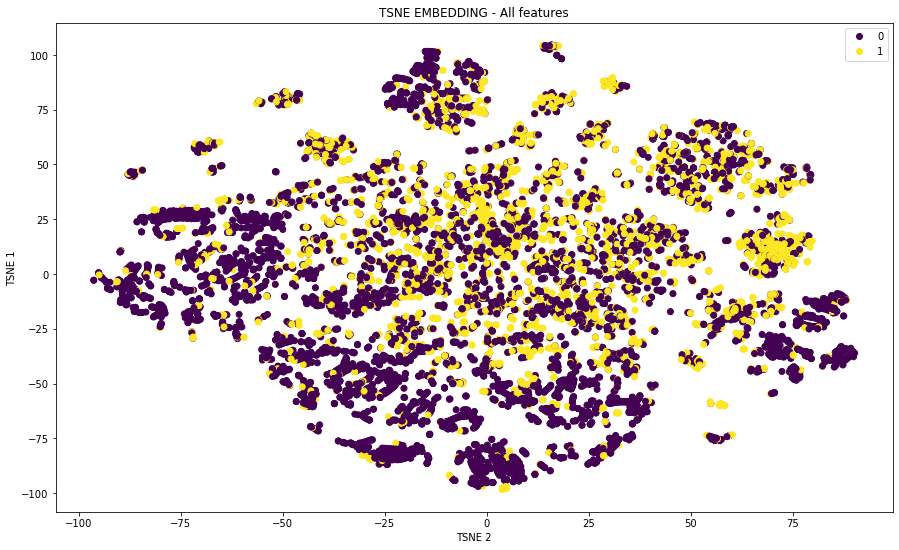

In [22]:
# Plot de resultado en 2 dimensiones
plt.figure(figsize=(15, 9))
plt.ylabel('TSNE 1')
plt.xlabel('TSNE 2')
plt.title('TSNE EMBEDDING - All features')
scatter = plt.scatter(X_tsne_all[:,0], X_tsne_all[:,1], c=df['fg_aumentado'])
handles, _ = scatter.legend_elements(prop='colors')
plt.legend(handles, df['fg_aumentado'].unique())

El grafico anterior muestra todas las transacciones del dataset reducidas a dos dimensiones para poder visualizarlas. En principio habria ciertos grupos identificables. Sin tener en cuenta la etiqueta elegida, podemos observar ciertos conglomerados de puntos de distinta densidad, con forma de blob. 
Si tenemos en cuenta la etiqueta, a pesar de que ningún grupo tiene la completitud de una de las clases, si se pueden observan algunos con mayoría de puntos violetas o mayoría de amarillos. Aquellos conglomerados más amplios, tiene en su mayoría puntos de color de violetas, mientras que los más pequeños parecen tener mayoría de puntos amarillos.  

##### Sobre el dataset agrupado por DNI

In [23]:
df_dni_tsne = df_dni_escalado.drop(columns = [dni]) 

Instanciamos TSNE con los parametros que regularmente se usan

In [24]:
X_dni_tsne_all = tsne.fit_transform(df_dni_tsne)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 844 samples in 0.001s...
[t-SNE] Computed neighbors for 844 samples in 0.048s...
[t-SNE] Computed conditional probabilities for sample 844 / 844
[t-SNE] Mean sigma: 1.765775
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.526428
[t-SNE] KL divergence after 1000 iterations: 1.306832


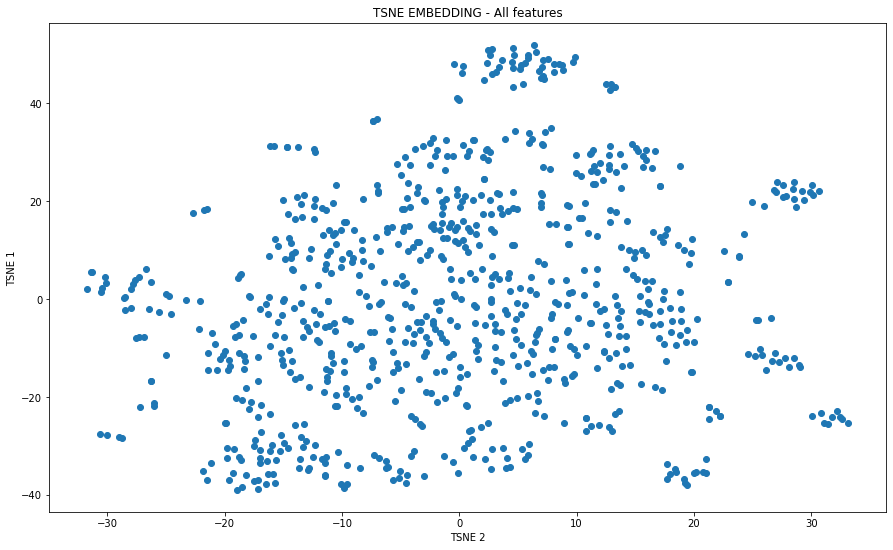

In [25]:
# Plot de resultado en 2 dimensiones
plt.figure(figsize=(15, 9))
plt.ylabel('TSNE 1')
plt.xlabel('TSNE 2')
plt.title('TSNE EMBEDDING - All features')
scatter = plt.scatter(X_dni_tsne_all[:,0], X_dni_tsne_all[:,1])
handles, _ = scatter.legend_elements(prop='colors')

En este gráfico, cada punto representa un cliente. Si bien los puntos estan separados entre si, se puede ver un grupo grande en el medio, rodeado de grupos mas pequeños alrededor. 

# Analisis de Clusters

In [26]:
df_clusters=df.copy()

In [27]:
df_clusters_dni=df_dni.copy()


### K-Means Clustering

#### K-means sobre el dataset con reducción de dimensionalidad por PCA

Para n_clusters = 4 El silhouette_score promedio es : 0.23859603279841934
Para n_clusters = 6 El silhouette_score promedio es : 0.17217999242343973
Para n_clusters = 8 El silhouette_score promedio es : 0.1684679439673823
Para n_clusters = 10 El silhouette_score promedio es : 0.17274778973714083
Para n_clusters = 12 El silhouette_score promedio es : 0.1826601942750931
Para n_clusters = 14 El silhouette_score promedio es : 0.1094269176976905
Para n_clusters = 16 El silhouette_score promedio es : 0.1170551740301988


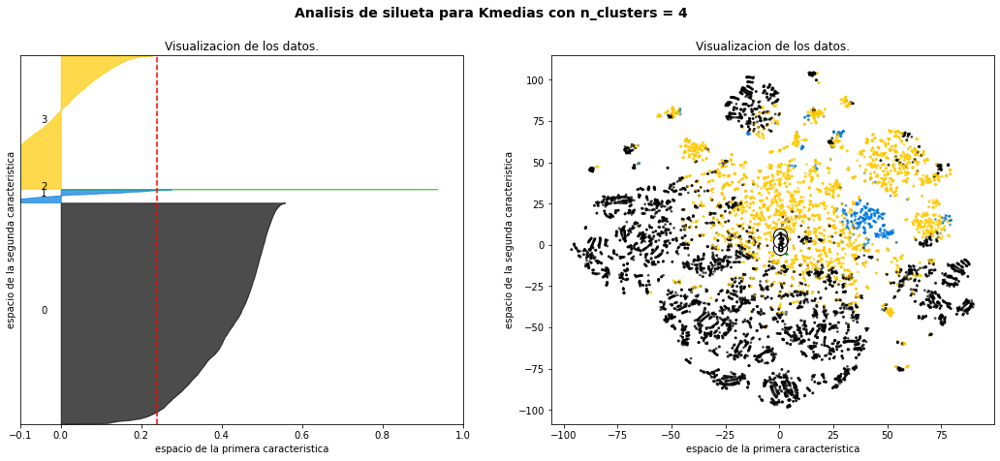

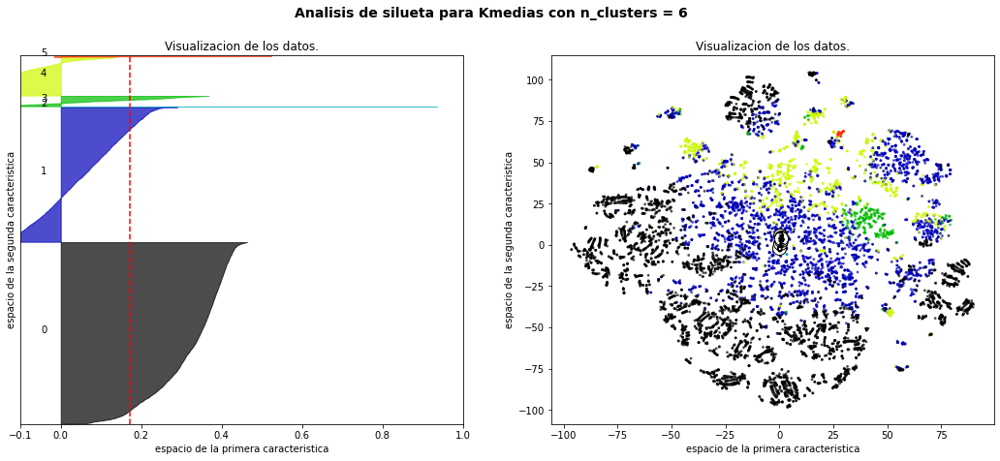

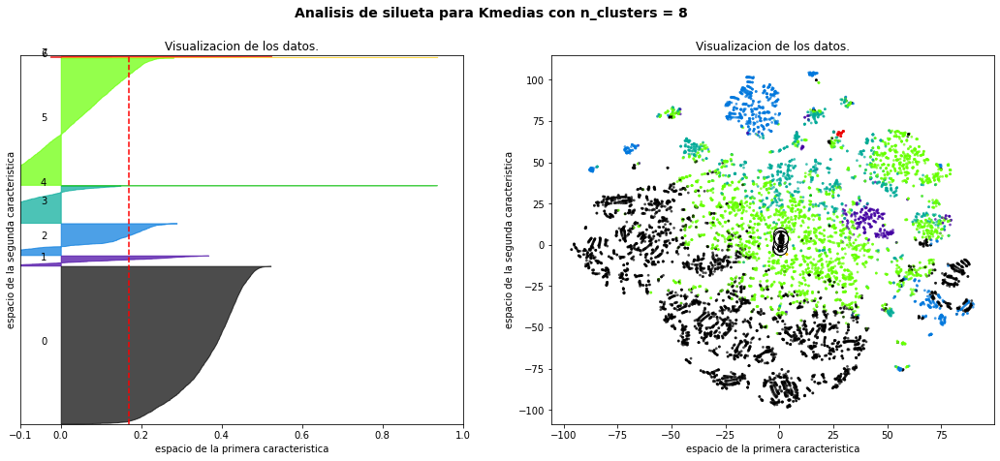

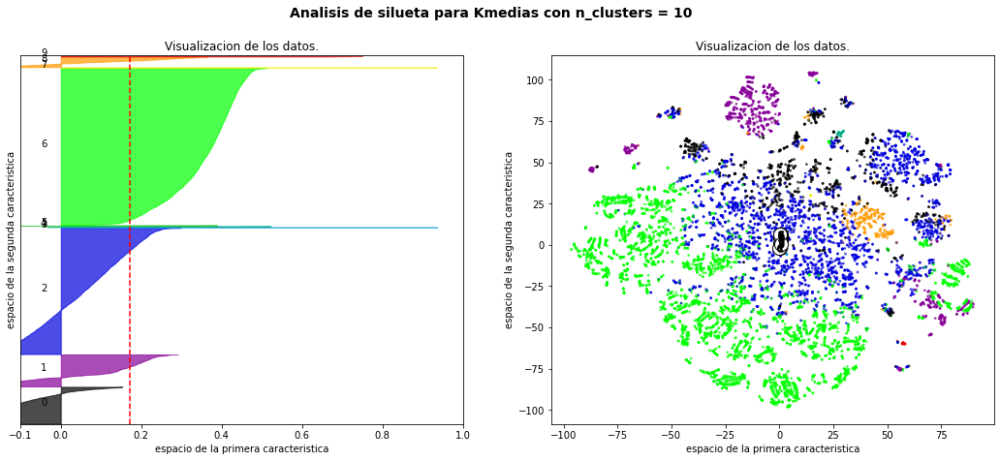

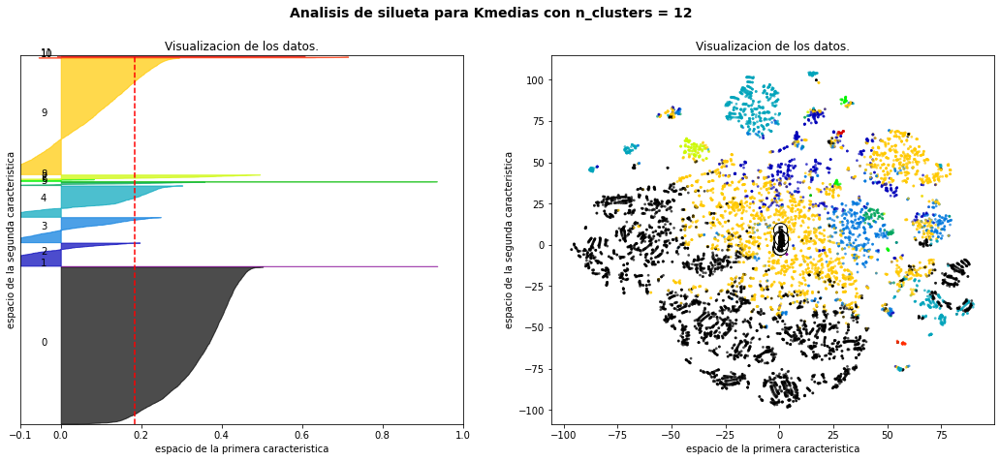

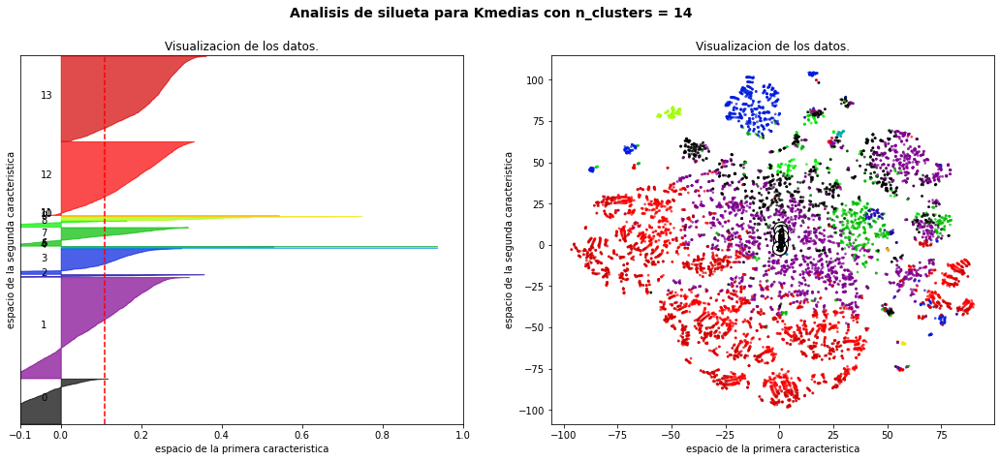

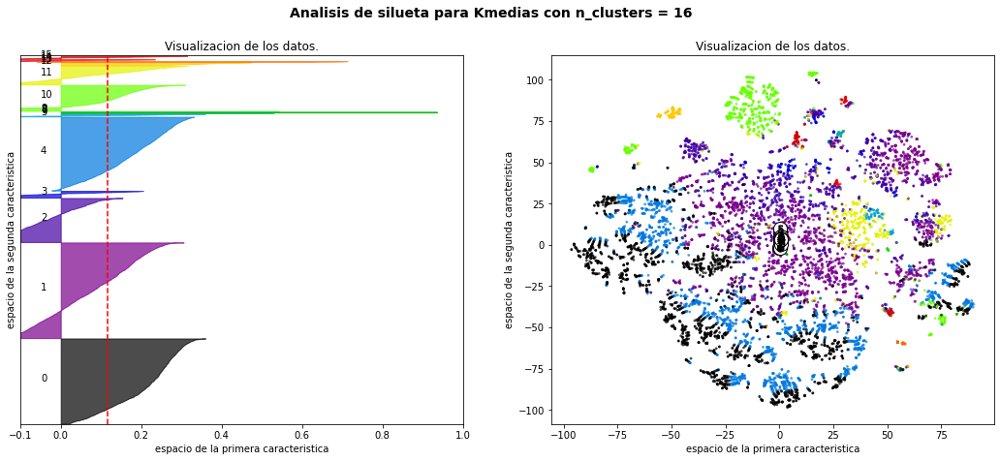

In [36]:
# con DF- PCA
X = df_pca.drop(columns = [dni])

range_n_clusters = [4,6,8,10,12,14,16]
sse ={}
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10, n_init = 100 )
    cluster_labels = clusterer.fit_predict(X)
    sse[n_clusters] = clusterer.inertia_

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("Para n_clusters =", n_clusters,
          "El silhouette_score promedio es :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Visualizacion de los datos.")
    ax1.set_xlabel("espacio de la primera caracteristica")
    ax1.set_ylabel("espacio de la segunda caracteristica")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X_tsne_all[:, 0], X_tsne_all[:, 1]
                , marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("Visualizacion de los datos.")
    ax2.set_xlabel("espacio de la primera caracteristica")
    ax2.set_ylabel("espacio de la segunda caracteristica")

    plt.suptitle(("Analisis de silueta para Kmedias "
                  "con n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    #plt.savefig("kmeans_%d" % n_clusters, dpi=300)

plt.show()

Observando los grupos encontrados por este clusterizador, vemos que en la mayoria de los casos, no hay una homogeneidad suficiente en los grupos. Existe un grupo que se destaca del resto y que ademas el clusterizador encuentra en la mayoria de los casos (para n_clusters=16, color verde). Este ultimo grupo es el que vamos a considerar para analisis posteriores. 

Text(0.5, 1.0, 'Inertia of k-Means versus number of clusters')

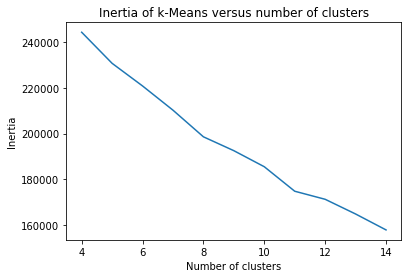

In [37]:
#Prueba: para elegir el hiperparámetro n_clusters, variando de 10 a 20 
scores = [KMeans(n_clusters=i, random_state = 28).fit(df_pca.drop(columns = [dni])).inertia_ for i in range(4,15)]

plt.plot(np.arange(4, 15), scores)
plt.xlabel('Number of clusters')
plt.ylabel("Inertia")
plt.title("Inertia of k-Means versus number of clusters")

##### Guardado de etiquetas

In [38]:
# Número de clusters buscado
n_clust = 16

km = KMeans(n_clusters=n_clust, random_state=10, n_init = 100 )
km.fit(df_pca.drop(columns = [dni])) 

# Armamos columna en df_clusters
df_clusters['cluster_pca_kmeans'] = km.labels_ #clusters


# Recuperacion de etiquetas
clusters = km.labels_
print('Suma de los cuadrados de las distancias al cluster(Inertia) ', km.inertia_)

Suma de los cuadrados de las distancias al cluster(Inertia)  146821.94573368953


In [39]:
X = df_pca.drop(columns = [dni])
print('Coeficiente de silueta =', silhouette_score(X, clusters))

Coeficiente de silueta = 0.1170551740301988


In [40]:
dff = pd.DataFrame({'0':X_tsne_all[:,0], '1':X_tsne_all[:,1], 'clusters':clusters})

<AxesSubplot:title={'center':'Clusters PCA - grupo target'}, xlabel='TSNE 2', ylabel='TSNE 1'>

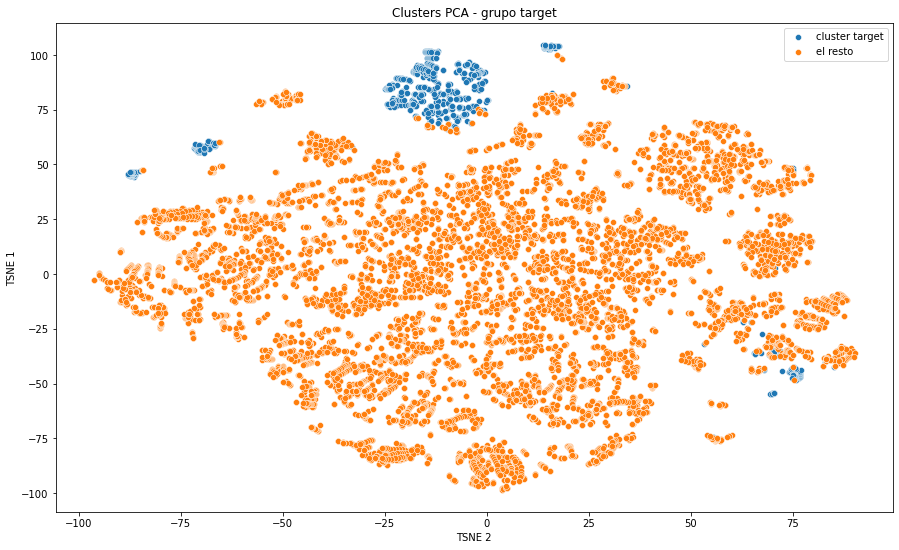

In [41]:
plt.figure(figsize=(15, 9))
plt.ylabel('TSNE 1')
plt.xlabel('TSNE 2')
plt.title('Clusters PCA - grupo target')
data = dff[dff['clusters'] == 10]
data2 = dff[dff['clusters'] != 10]
sns.scatterplot(data = data, x='0', y='1', palette='bright', label='cluster target')
sns.scatterplot(data = data2, x='0', y='1', palette='bright', label='el resto')

Si queremos aislar solo el grupo de puntos que se encuentran en la parte superior del grafico, usamos su numero de cluster correspondiente.

##### Analisis: Cluster seleccionado

In [42]:
df_clientes = pd.read_parquet('datos_clientes.parquet')

In [43]:
df_analisis = df_clientes.merge(df_clusters, on='dni_titular_movimiento', validate='1:m')

In [44]:
df_cluster_10 = df_analisis[df_analisis['cluster_pca_kmeans'] == 10]

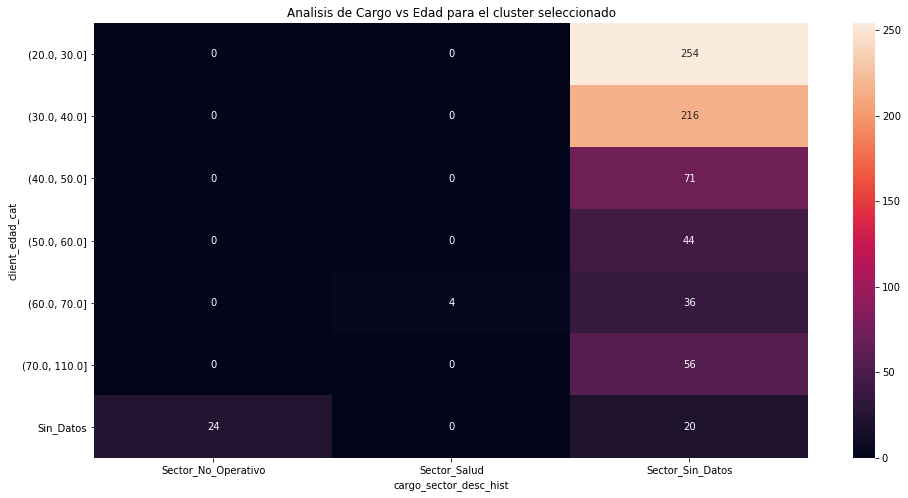

In [45]:
fig, ax = plt.subplots(figsize=(16,8))
exp = pd.crosstab(df_cluster_10.client_edad_cat, df_cluster_10.cargo_sector_desc_hist)
sns.heatmap(exp, annot=True, fmt='g')
plt.title('Analisis de Cargo vs Edad para el cluster seleccionado')
plt.show()

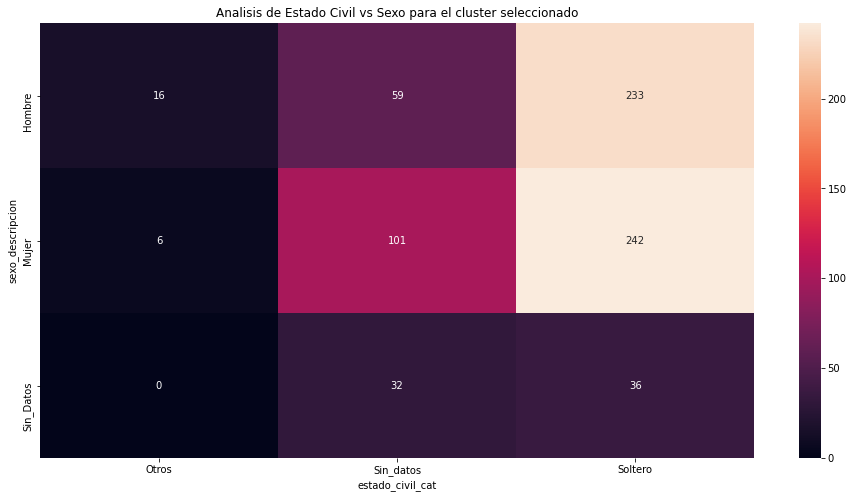

In [46]:
fig, ax = plt.subplots(figsize=(16,8))
exp = pd.crosstab(df_cluster_10.sexo_descripcion, df_cluster_10.estado_civil_cat)
sns.heatmap(exp, annot=True, fmt='g')
plt.title('Analisis de Estado Civil vs Sexo para el cluster seleccionado')
plt.show()

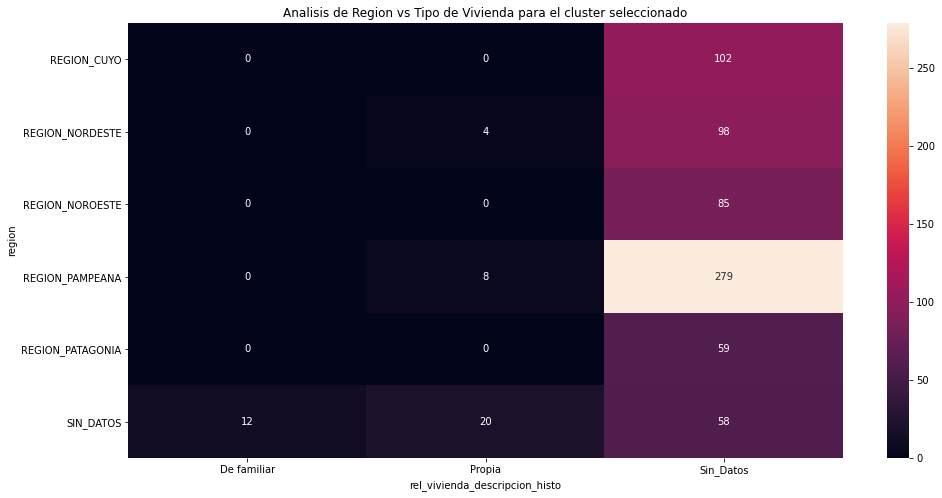

In [47]:
fig, ax = plt.subplots(figsize=(16,8))
exp = pd.crosstab(df_cluster_10.region, df_cluster_10.rel_vivienda_descripcion_histo)
sns.heatmap(exp, annot=True, fmt='g')
plt.title('Analisis de Region vs Tipo de Vivienda para el cluster seleccionado')
plt.show()

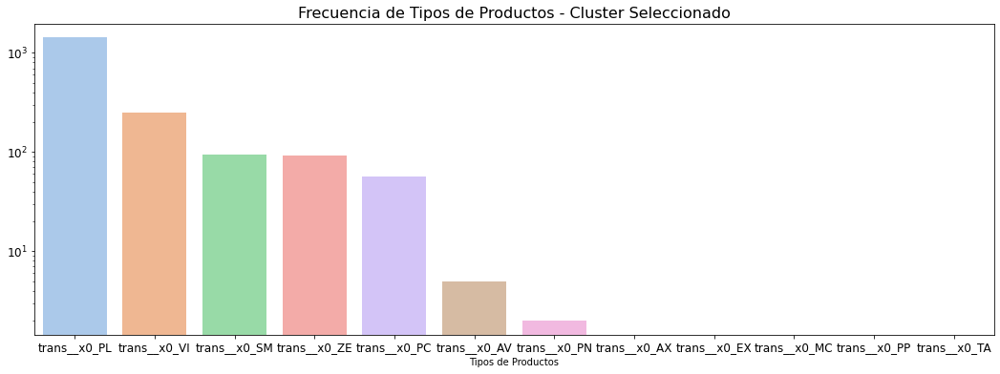

In [48]:
cols = [x for x in df_cluster_10.columns.values if 'trans__x0' in x]
df_tp_prod = df_cluster_10[cols].sum().to_frame().reset_index()
df_tp_prod.rename(columns={0: 'frecuencia', 'index': 'tipo_prod'}, inplace=True)
df_tp_prod = df_tp_prod.sort_values(by='frecuencia',ascending=False)

fig, ax = plt.subplots(figsize=(18,6))
g=sns.barplot(x=df_tp_prod.tipo_prod, 
              y=df_tp_prod.frecuencia, 
              palette="pastel")
ax.set_yscale("log")
ax.tick_params(labelsize=12)
ax.set_xlabel("Tipos de Productos")
ax.set_ylabel("")
ax.set_title('Frecuencia de Tipos de Productos - Cluster Seleccionado', fontsize=16)
plt.show()

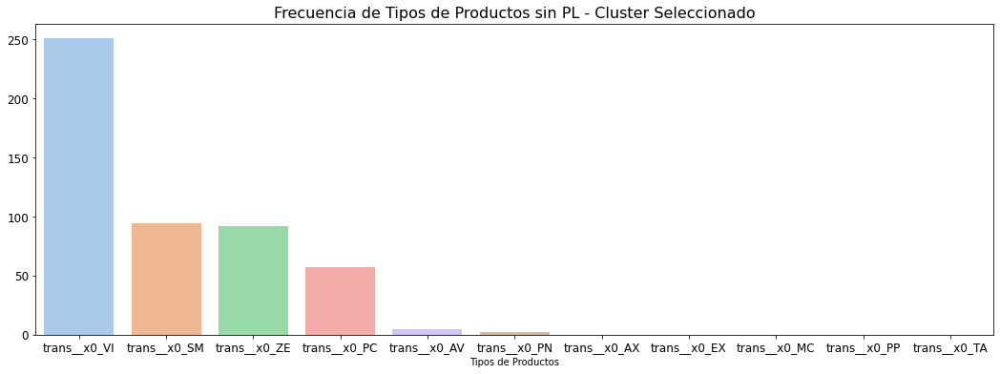

In [49]:
cols = [x for x in df_cluster_10.columns.values if ('trans__x0' in x) and ('PL' not in x)]
df_tp_prod = df_cluster_10[cols].sum().to_frame().reset_index()
df_tp_prod.rename(columns={0: 'frecuencia', 'index': 'tipo_prod'}, inplace=True)
df_tp_prod = df_tp_prod.sort_values(by='frecuencia',ascending=False)

fig, ax = plt.subplots(figsize=(18,6))
g=sns.barplot(x=df_tp_prod.tipo_prod, 
              y=df_tp_prod.frecuencia, 
              palette="pastel")
#ax.set_yscale("log")
ax.tick_params(labelsize=12)
ax.set_xlabel("Tipos de Productos")
ax.set_ylabel("")
ax.set_title('Frecuencia de Tipos de Productos sin PL - Cluster Seleccionado', fontsize=16)
plt.show()

In [50]:
df_cluster_10.groupby(['o_mes']).monto_ajustado.describe()

,count,mean,std,min,25%,50%,75%,max
o_mes,,,,,,,,
0,62.0,655.385806,1688.890543,0.00,0.0000,0.00,0.0000,9302.50
1,55.0,1641.030364,3922.754690,-208.43,0.0000,0.00,307.5450,18412.47
2,60.0,4197.435167,8576.495160,-203.39,0.0000,0.00,4342.8225,48386.92
3,59.0,4240.281864,8521.671251,-835.42,0.0000,0.00,5763.5250,47618.21
4,59.0,2330.822373,5037.942158,-813.67,0.0000,0.00,2110.0250,22227.84
5,55.0,5581.886909,7353.593334,-788.02,0.0000,1847.56,8728.0850,26639.07
6,59.0,4992.015763,7072.724796,-763.36,0.0000,857.17,7503.4950,25833.10
7,66.0,6933.688636,9913.106710,-742.94,0.0000,2240.36,11257.7675,38385.85
8,57.0,5678.158947,7602.331058,-717.36,0.0000,3040.34,8087.9800,34811.32


<AxesSubplot:xlabel='monto_ajustado', ylabel='o_mes'>

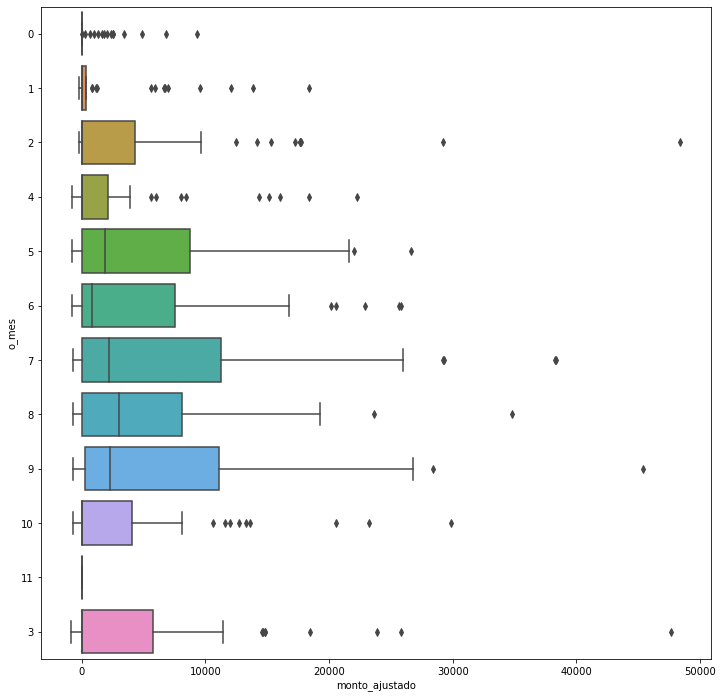

In [51]:
df_cluster_10['o_mes'] = df_cluster_10['o_mes'].astype(str)
plt.figure(figsize=(12, 12))
sns.boxplot(data=df_cluster_10, x='monto_ajustado', y='o_mes')

Con la anteriores visualizaciones sobre el cluster seleccionado, podemos decir que:
* Tenemos igual proporción de hombres y mujeres.
* En la condición "Estado Civil", en su mayoría son solteros.
* En su mayoría, son persona que rodean las edades de entre 20 y 40.
* La región que predomina es la Pampeana, seguida de Cuyo.
* En las transacciones de este grupo, y como en todo el dataframe, se destacan los movimientos de Plan Largo (PL) con mayores frecuencias en consumos.
* Sacando del análisis los productos de tipo PL, observamos que Visa (VI) es el producto más usado en el grupo, seguido de Mensajes de Texto (SM) y Plan Zeta (ZE).
* También podemos observar que los titulares de este cluster no informaron su profesión ni la condición de su vivienda.

#### K-means sobre el dataset con reducción de dimensionalidad por TSNE

Para n_clusters = 6 El silhouette_score promedio es : 0.3931054
Para n_clusters = 8 El silhouette_score promedio es : 0.39731506
Para n_clusters = 10 El silhouette_score promedio es : 0.39697647
Para n_clusters = 12 El silhouette_score promedio es : 0.40232742
Para n_clusters = 14 El silhouette_score promedio es : 0.39290506
Para n_clusters = 16 El silhouette_score promedio es : 0.39686677
Para n_clusters = 18 El silhouette_score promedio es : 0.401781


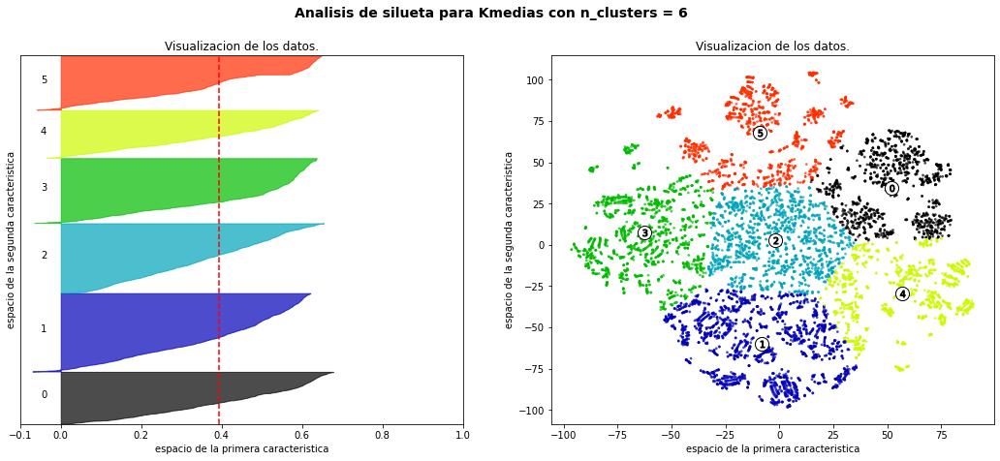

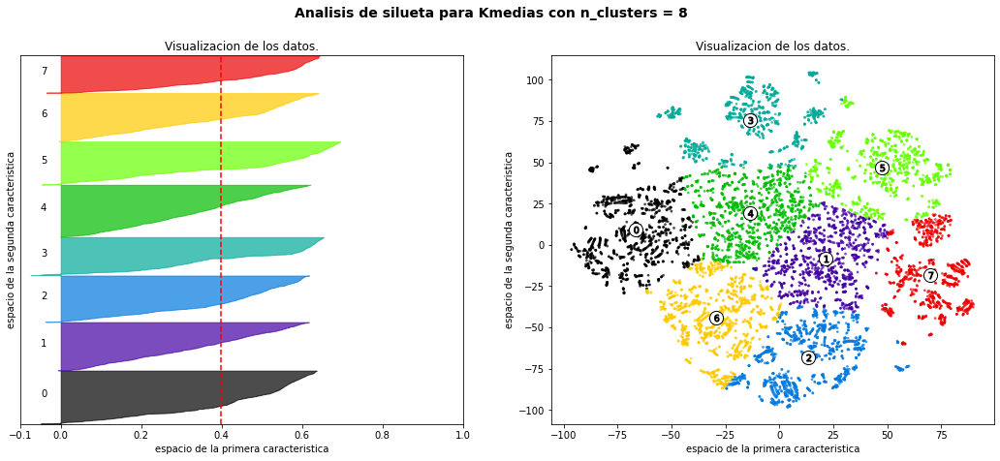

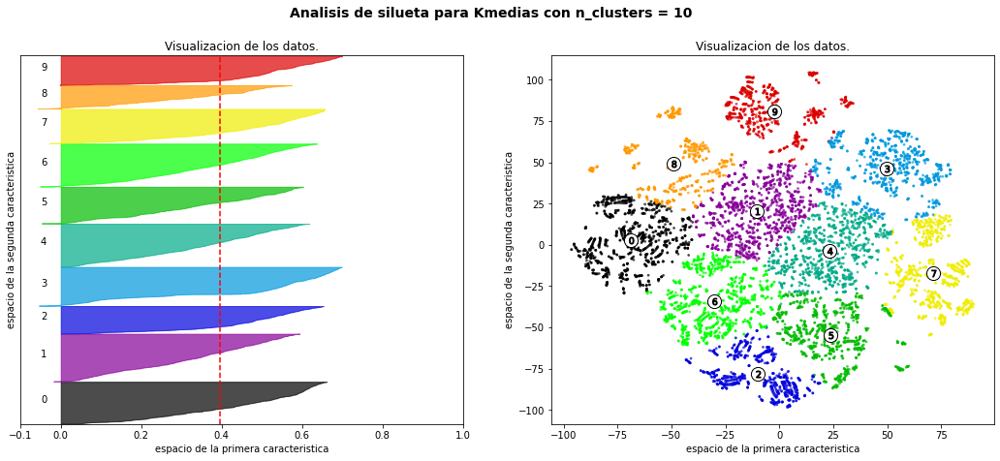

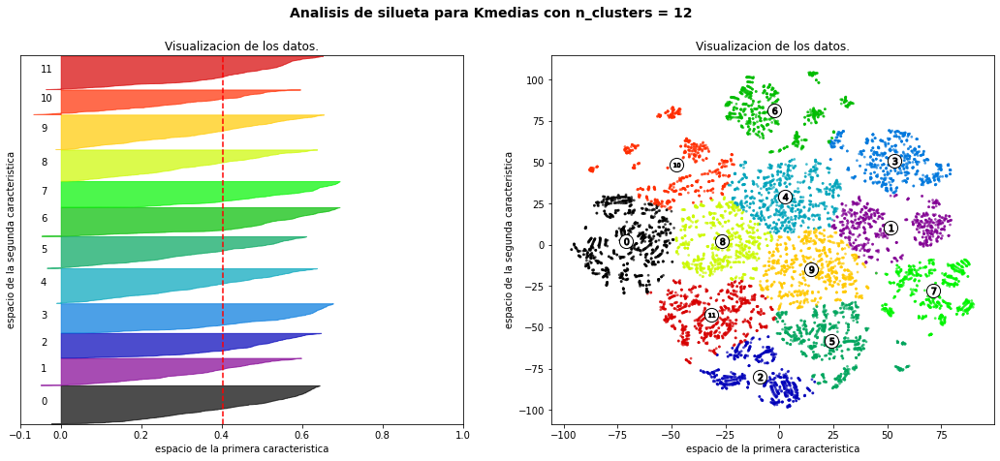

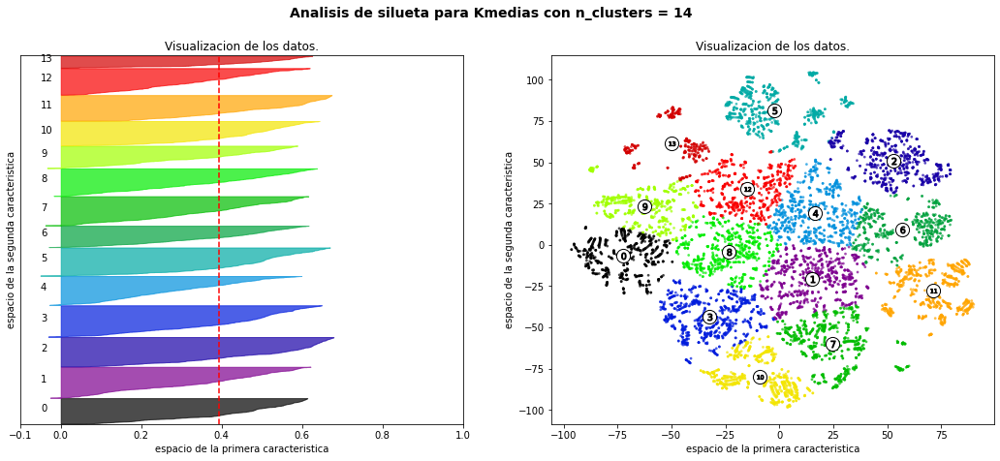

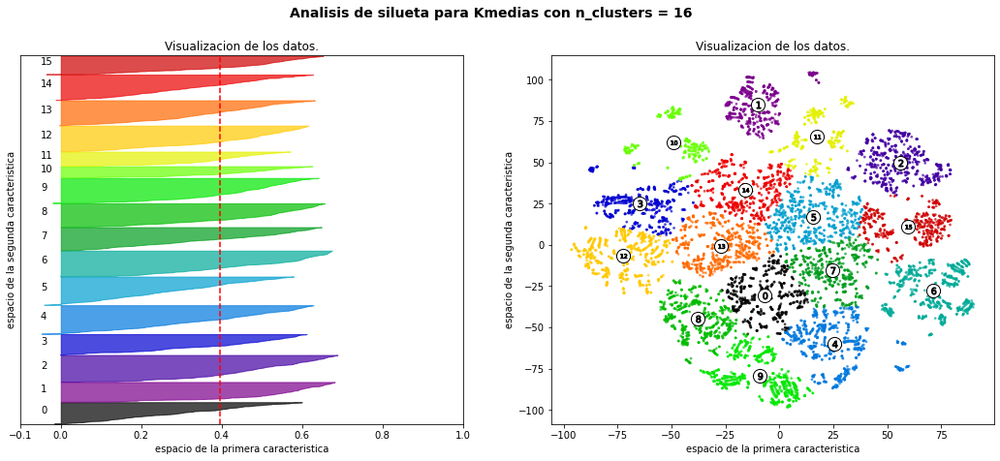

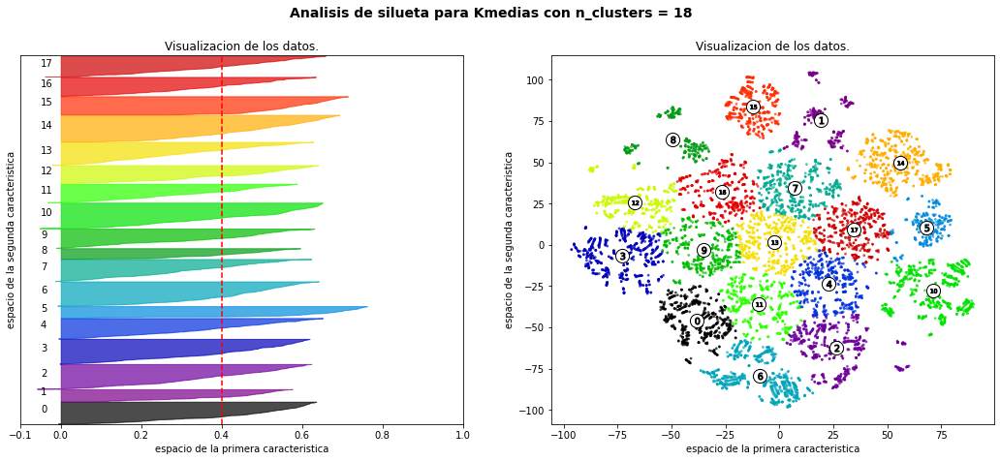

In [52]:
X = X_tsne_all

range_n_clusters =  np.arange(6,19,2)
sse ={}
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)
    sse[n_clusters] = clusterer.inertia_

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("Para n_clusters =", n_clusters,
          "El silhouette_score promedio es :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Visualizacion de los datos.")
    ax1.set_xlabel("espacio de la primera caracteristica")
    ax1.set_ylabel("espacio de la segunda caracteristica")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s
                =30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("Visualizacion de los datos.")
    ax2.set_xlabel("espacio de la primera caracteristica")
    ax2.set_ylabel("espacio de la segunda caracteristica")

    plt.suptitle(("Analisis de silueta para Kmedias "
                  "con n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    #plt.savefig("kmeans_%d" % n_clusters, dpi=300)

plt.show()

##### Guardado de etiquetas

In [53]:
# Número de clusters buscado
n_clust = 18

km = KMeans(n_clusters=n_clust, random_state=10)
kmeans_labels =  km.fit_predict(X_tsne_all) 

df_clusters['cluster_tsne_kmeans'] = kmeans_labels #clusters

# Recuperacion de etiquetas
clusters = km.labels_
print('Suma de los cuadrados de las distancias al cluster(Inertia) ', km.inertia_)

Suma de los cuadrados de las distancias al cluster(Inertia)  2135602.75


In [54]:
X = X_tsne_all
print('Coeficiente de silueta =', silhouette_score(X, clusters))

Coeficiente de silueta = 0.401781


Separamos del resto los cluster que nos interesan analizar

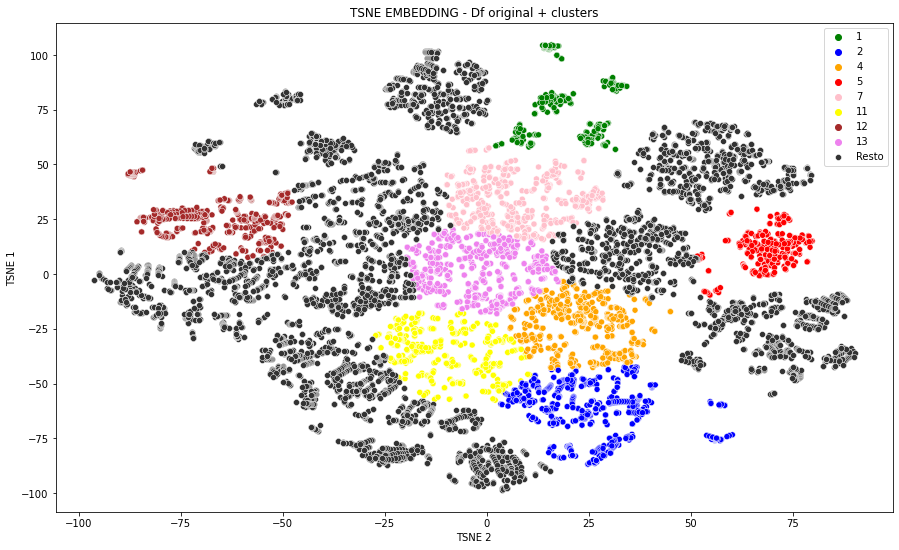

In [55]:
dff = pd.DataFrame({'0':X_tsne_all[:,0], '1':X_tsne_all[:,1], 'clusters':clusters})

plt.figure(figsize=(15, 9))
plt.ylabel('TSNE 1')
plt.xlabel('TSNE 2')
plt.title('TSNE EMBEDDING - Df original + clusters')
data = dff[dff.clusters.isin([1,13,11,12,4,2,5,7])]
data2 = dff[~dff.clusters.isin([1,13,11,12,4,2,5,7])]
colors = ['green', 'blue', 'orange', 'red','pink','yellow','brown', 'violet']

sns.scatterplot(data = data, x='0', y='1', palette=colors, hue='clusters')
sns.scatterplot(data = data2, x='0', y='1', color=".2", label='Resto')
plt.show()

#### Análisis

In [56]:
# Creacion de dataset de analisis
df_clientes = pd.read_parquet('datos_clientes.parquet')
df_analisis_tsne = df_clientes.merge(df_clusters, on='dni_titular_movimiento', validate='1:m')
df_analisis_tsne = df_analisis_tsne.rename(columns={'o_mes': 'Mes'})
df_analisis_tsne = df_analisis_tsne.sort_values('Mes')

##### Cluster 7 

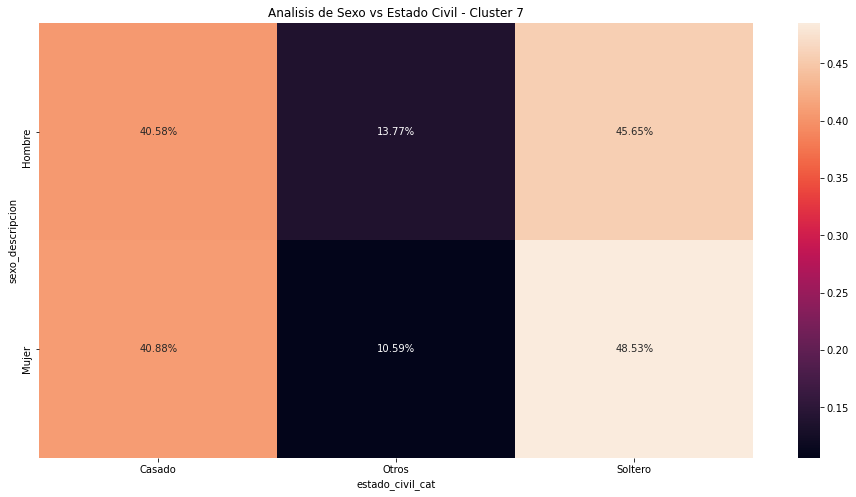

In [57]:
fig, ax = plt.subplots(figsize=(16,8))
exp = pd.crosstab(df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 7].sexo_descripcion, 
                  df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 7].estado_civil_cat,
                 normalize='index')
sns.heatmap(exp, annot=True, fmt='.2%')
plt.title('Analisis de Sexo vs Estado Civil - Cluster 7')
plt.show()

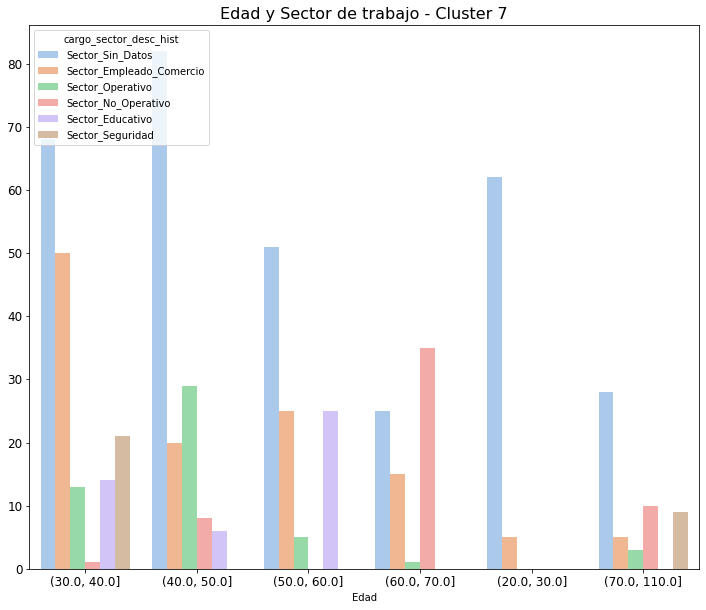

In [58]:
fig, ax = plt.subplots(figsize=(12,10))
sns.countplot(x=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 7].client_edad_cat, palette="pastel",
              hue=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 7].cargo_sector_desc_hist,
              order=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 7].client_edad_cat.value_counts().index)
ax.tick_params(labelsize=12)
plt.title('Edad y Sector de trabajo - Cluster 7',fontsize=16)
ax.set_xlabel("Edad")
ax.set_ylabel("")
plt.show()

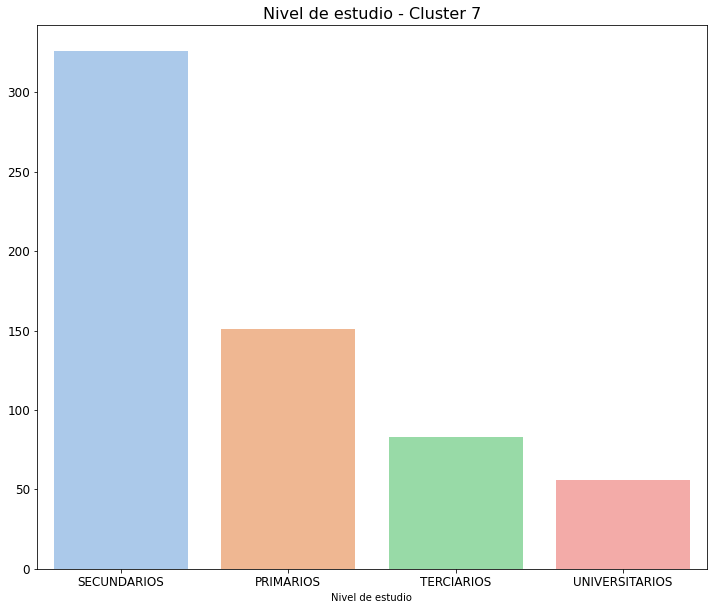

In [59]:
fig, ax = plt.subplots(figsize=(12,10))
sns.countplot(x=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 7].nivel_estudio_descripcion_histo, palette="pastel",
             order=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 7].nivel_estudio_descripcion_histo.value_counts().index)
ax.tick_params(labelsize=12)
plt.title('Nivel de estudio - Cluster 7',fontsize=16)
ax.set_xlabel("Nivel de estudio")
ax.set_ylabel("")
plt.show()

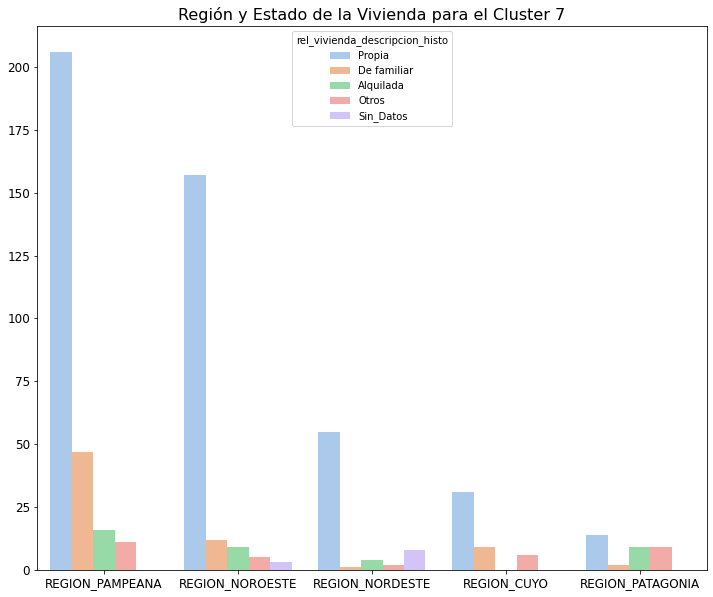

In [60]:
fig, ax = plt.subplots(figsize=(12,10))
sns.countplot(x=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 7].region, palette="pastel",
              hue=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 7].rel_vivienda_descripcion_histo,
              order=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 7].region.value_counts().index)
ax.tick_params(labelsize=12)
plt.title('Región y Estado de la Vivienda para el Cluster 7',fontsize=16)
ax.set_xlabel("")
ax.set_ylabel("")
plt.show()

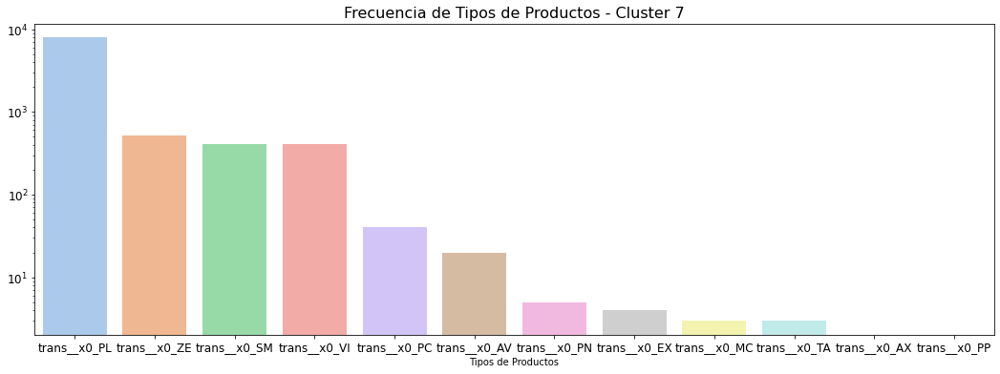

In [61]:
cols = [x for x in df_analisis_tsne.columns.values if 'trans__x0' in x]
df_tp_prod = df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 7][cols].sum().to_frame().reset_index()
df_tp_prod.rename(columns={0: 'frecuencia', 'index': 'tipo_prod'}, inplace=True)
df_tp_prod = df_tp_prod.sort_values(by='frecuencia',ascending=False)

fig, ax = plt.subplots(figsize=(18,6))
g=sns.barplot(x=df_tp_prod.tipo_prod, 
              y=df_tp_prod.frecuencia, 
              palette="pastel")
ax.set_yscale("log")
ax.tick_params(labelsize=12)
ax.set_xlabel("Tipos de Productos")
ax.set_ylabel("")
ax.set_title('Frecuencia de Tipos de Productos - Cluster 7', fontsize=16)
plt.show()

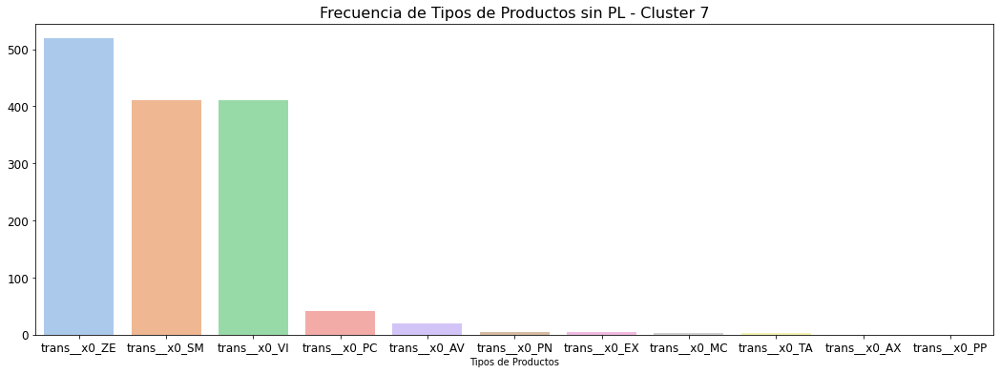

In [62]:
cols = [x for x in df_analisis_tsne.columns.values if ('trans__x0' in x) and ('PL' not in x)]
df_tp_prod = df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 7][cols].sum().to_frame().reset_index()
df_tp_prod.rename(columns={0: 'frecuencia', 'index': 'tipo_prod'}, inplace=True)
df_tp_prod = df_tp_prod.sort_values(by='frecuencia',ascending=False)

fig, ax = plt.subplots(figsize=(18,6))
g=sns.barplot(x=df_tp_prod.tipo_prod, 
              y=df_tp_prod.frecuencia, 
              palette="pastel")
#ax.set_yscale("log")
ax.tick_params(labelsize=12)
ax.set_xlabel("Tipos de Productos")
ax.set_ylabel("")
ax.set_title('Frecuencia de Tipos de Productos sin PL - Cluster 7', fontsize=16)
plt.show()

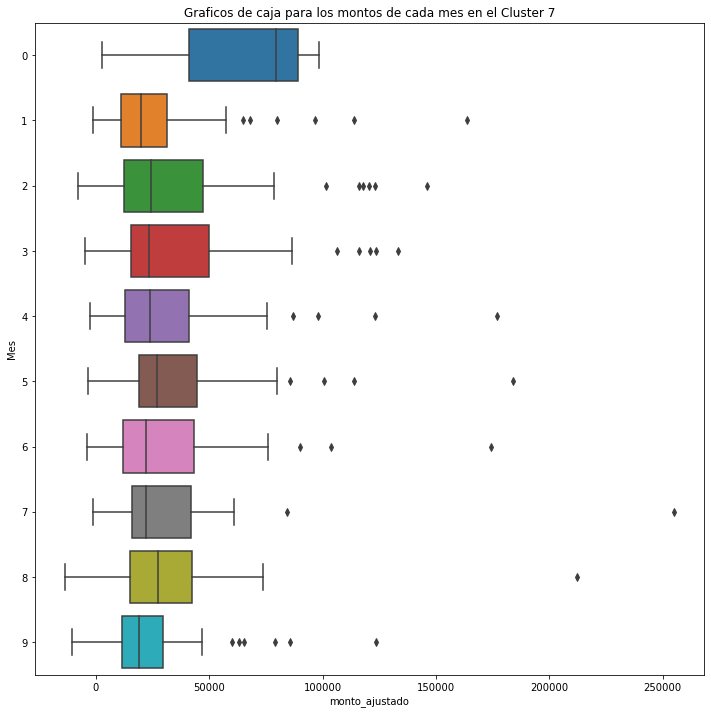

In [63]:
df_analisis_tsne = df_analisis_tsne.sort_values(by=["Mes"], ascending=True)
df_analisis_tsne['Mes'] = df_analisis_tsne['Mes'].astype(str)
plt.figure(figsize=(12, 12))
plt.title("Graficos de caja para los montos de cada mes en el Cluster 7")
sns.boxplot(data=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 7], x='monto_ajustado', y='Mes')
plt.show()

In [64]:
df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 7].client_antig.describe()

count    616.000000
mean     109.665584
std       82.431475
min        0.000000
25%       44.000000
50%       87.500000
75%      151.250000
max      308.000000
Name: client_antig, dtype: float64

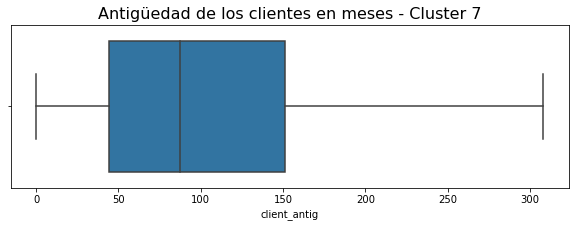

In [65]:
df_analisis_tsne = df_analisis_tsne.sort_values(by=["Mes"], ascending=True)
df_analisis_tsne['Mes'] = df_analisis_tsne['Mes'].astype(str)
plt.figure(figsize=(10, 3))
sns.boxplot(data=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 7], x='client_antig').set_title('Antigüedad de los clientes en meses - Cluster 7', fontsize=16)
plt.show()

In [66]:
df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 7].groupby(['Mes']).monto_ajustado.describe()

,count,mean,std,min,25%,50%,75%,max
Mes,,,,,,,,
0,3.0,60137.453333,50737.468197,2543.46,41088.9650,79634.470,88934.4500,98234.43
1,65.0,27806.918923,27987.061828,-1259.38,11254.0300,20028.780,31433.8900,163572.40
2,64.0,35499.557031,34392.333725,-7806.26,12197.5350,24382.475,47359.2800,145857.21
3,65.0,36536.856000,32652.286215,-4815.38,15311.5100,23485.850,49720.2600,133125.14
4,76.0,31612.209079,28464.360092,-2798.35,12698.0675,24063.235,41256.2925,176932.54
5,72.0,35514.959306,28424.596037,-3493.08,19080.7800,26790.075,44392.6200,183984.59
6,61.0,31118.692131,28536.826227,-3794.07,12043.0000,22161.360,43187.7200,174202.60
7,67.0,30468.801940,32351.763356,-1394.36,15852.0900,22087.320,41778.3950,254927.14
8,75.0,31150.755733,27430.116874,-13650.55,14808.5650,27168.500,42338.2150,212246.02


El Cluster 7 corresponde a personas de edad entre 40 y 30 años de edad, las mujeres en su mayoría están casadas, y los hombres en su mayoría están solteros, principalmente se encuentran en la region Pampeana, poseen vivienda propia, consumen PL, VI, Mensaje a celulares y Zeta en su mayoría poseen nivel de estudio Secundario y Primario, y la antiguedad promedio es de entre 50 y 175 meses, lo que seria entre 4 y 15 años, entre otros. Su consumo medio mensual es de 30 mil.

##### Cluster 1

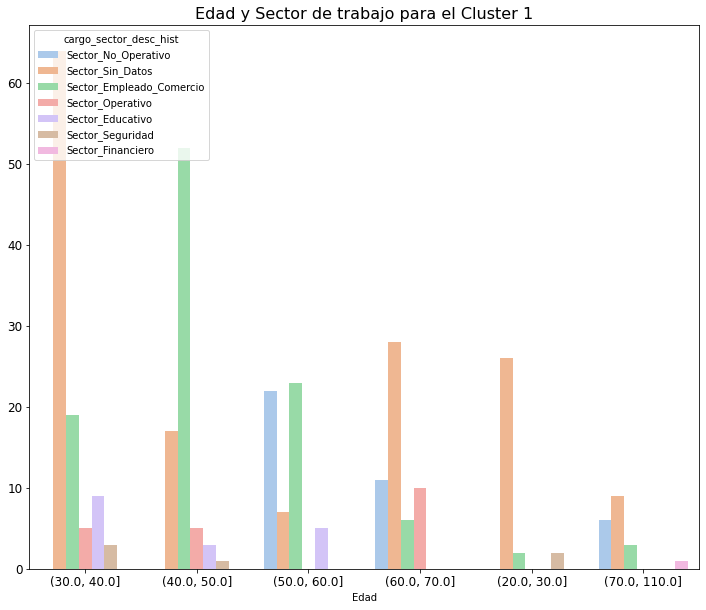

In [67]:
fig, ax = plt.subplots(figsize=(12,10))
sns.countplot(x=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 1].client_edad_cat, palette="pastel",
              hue=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 1].cargo_sector_desc_hist,
              order=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 1].client_edad_cat.value_counts().index)
ax.tick_params(labelsize=12)
plt.title('Edad y Sector de trabajo para el Cluster 1',fontsize=16)
ax.set_xlabel("Edad")
ax.set_ylabel("")
plt.show()

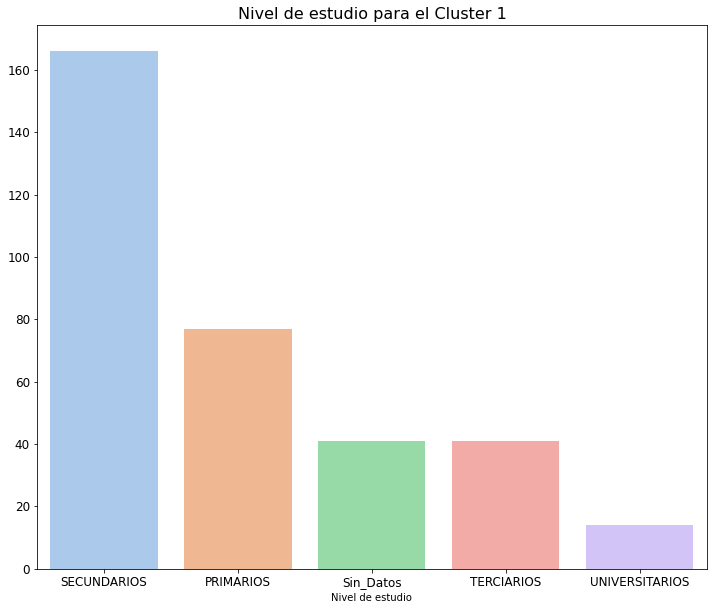

In [68]:
fig, ax = plt.subplots(figsize=(12,10))
sns.countplot(x=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 1].nivel_estudio_descripcion_histo, palette="pastel",
             order=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 1].nivel_estudio_descripcion_histo.value_counts().index)
ax.tick_params(labelsize=12)
plt.title('Nivel de estudio para el Cluster 1',fontsize=16)
ax.set_xlabel("Nivel de estudio")
ax.set_ylabel("")
plt.show()

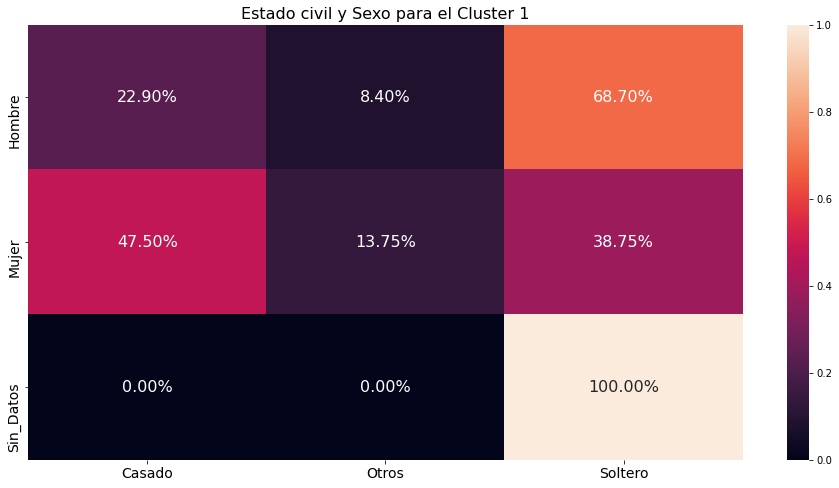

In [69]:
fig, ax = plt.subplots(figsize=(16,8))
exp = pd.crosstab(df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 1].sexo_descripcion, 
                  df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 1].estado_civil_cat,
                 normalize='index')
sns.heatmap(exp, annot=True, fmt='.2%', annot_kws={"fontsize":16})
ax.tick_params(labelsize=14)
ax.set_xlabel("")
ax.set_ylabel("")
plt.title('Estado civil y Sexo para el Cluster 1', fontsize=16)
plt.show()

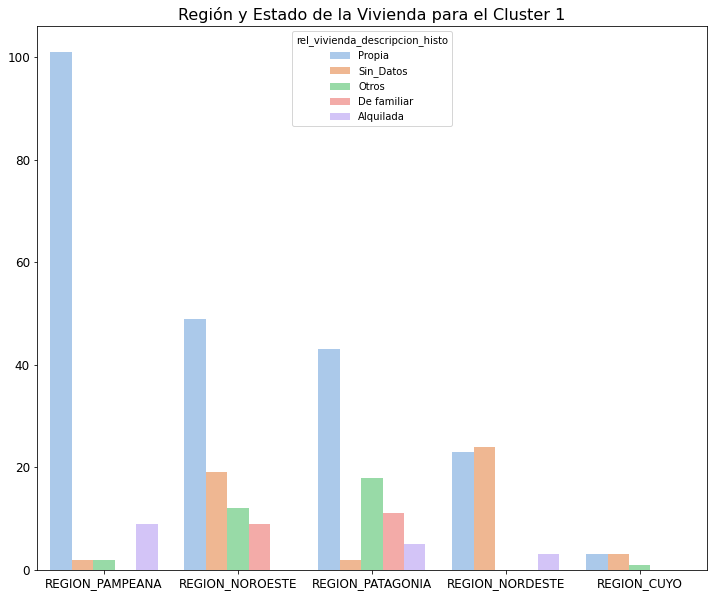

In [70]:
fig, ax = plt.subplots(figsize=(12,10))
sns.countplot(x=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 1].region, palette="pastel",
              hue=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 1].rel_vivienda_descripcion_histo,
              order=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 1].region.value_counts().index)
ax.tick_params(labelsize=12)
plt.title('Región y Estado de la Vivienda para el Cluster 1',fontsize=16)
ax.set_xlabel("")
ax.set_ylabel("")
plt.show()

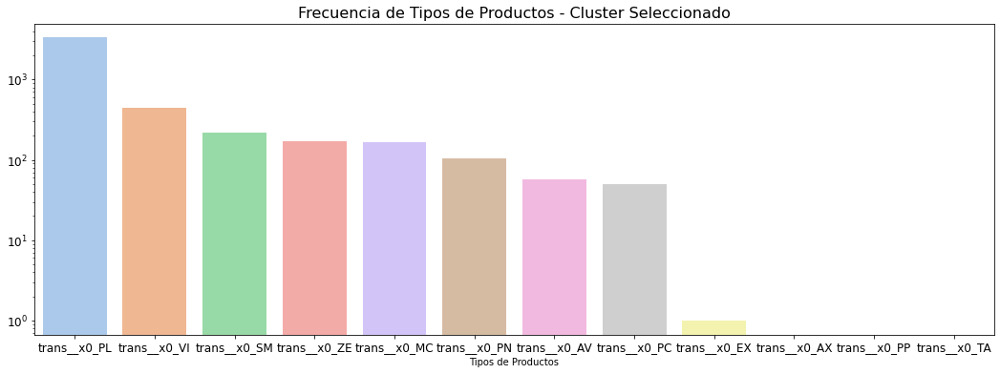

In [71]:
cols = [x for x in df_analisis_tsne.columns.values if 'trans__x0' in x]
df_tp_prod = df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 1][cols].sum().to_frame().reset_index()
df_tp_prod.rename(columns={0: 'frecuencia', 'index': 'tipo_prod'}, inplace=True)
df_tp_prod = df_tp_prod.sort_values(by='frecuencia',ascending=False)

fig, ax = plt.subplots(figsize=(18,6))
g=sns.barplot(x=df_tp_prod.tipo_prod, 
              y=df_tp_prod.frecuencia, 
              palette="pastel")
ax.set_yscale("log")
ax.tick_params(labelsize=12)
ax.set_xlabel("Tipos de Productos")
ax.set_ylabel("")
ax.set_title('Frecuencia de Tipos de Productos - Cluster Seleccionado', fontsize=16)
plt.show()

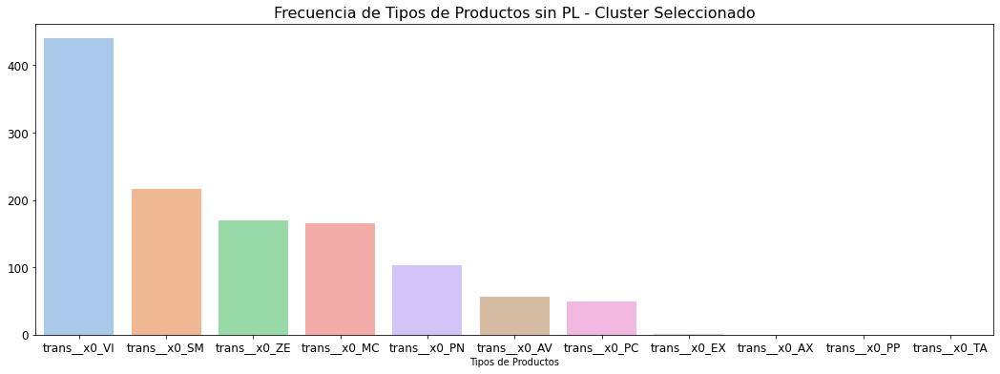

In [72]:
cols = [x for x in df_analisis_tsne.columns.values if ('trans__x0' in x) and ('PL' not in x)]
df_tp_prod = df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 1][cols].sum().to_frame().reset_index()
df_tp_prod.rename(columns={0: 'frecuencia', 'index': 'tipo_prod'}, inplace=True)
df_tp_prod = df_tp_prod.sort_values(by='frecuencia',ascending=False)

fig, ax = plt.subplots(figsize=(18,6))
g=sns.barplot(x=df_tp_prod.tipo_prod, 
              y=df_tp_prod.frecuencia, 
              palette="pastel")
#ax.set_yscale("log")
ax.tick_params(labelsize=12)
ax.set_xlabel("Tipos de Productos")
ax.set_ylabel("")
ax.set_title('Frecuencia de Tipos de Productos sin PL - Cluster Seleccionado', fontsize=16)
plt.show()

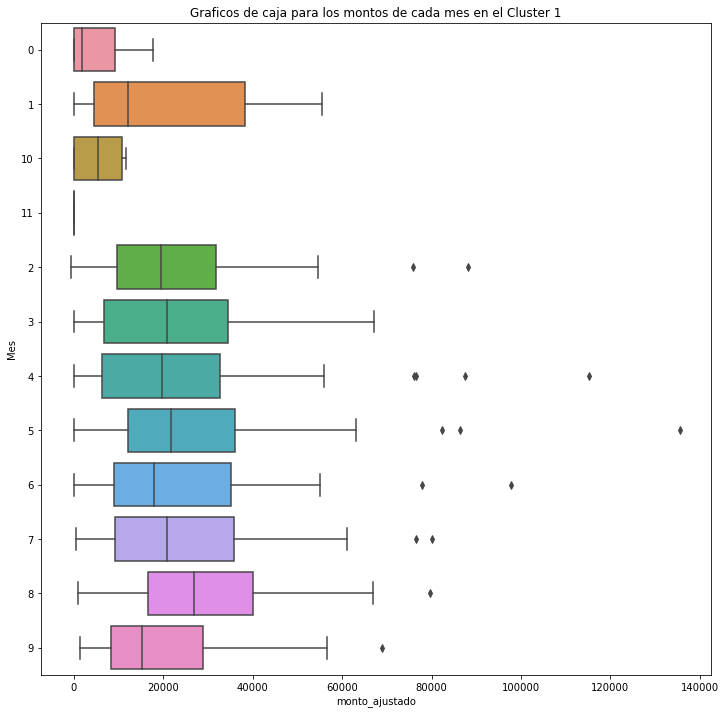

In [73]:
df_analisis_tsne = df_analisis_tsne.sort_values(by=['Mes'], ascending=True)
df_analisis_tsne['o_mes'] = df_analisis_tsne['Mes'].astype(str)
plt.figure(figsize=(12, 12))
plt.title("Graficos de caja para los montos de cada mes en el Cluster 1")
sns.boxplot(data=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 1], x='monto_ajustado', y='Mes')
plt.show()

In [74]:
df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 1].groupby(['Mes']).monto_ajustado.describe()

,count,mean,std,min,25%,50%,75%,max
Mes,,,,,,,,
0,11.0,5134.501818,6687.142348,0.00,0.0000,1927.080,9252.2650,17796.52
1,30.0,20420.898000,18374.990126,0.00,4422.8550,12220.045,38206.4375,55402.41
10,4.0,5552.397500,6422.549493,0.00,0.0000,5320.300,10872.6975,11568.99
11,4.0,0.000000,0.000000,0.00,0.0000,0.000,0.0000,0.00
2,35.0,23092.234286,21453.718703,-538.38,9611.1850,19436.070,31798.0950,88130.84
3,31.0,23894.555161,20293.962905,0.00,6666.7300,20838.560,34442.6700,67136.66
4,40.0,25638.684500,26679.657762,0.00,6198.2350,19643.715,32784.1850,115309.97
5,38.0,28975.561316,27295.875910,0.00,12016.3750,21846.830,36017.4275,135584.24
6,40.0,24137.251250,21579.426891,0.00,8988.0825,17910.580,35092.4375,97773.28


In [75]:
df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 1].client_antig.describe()

count    339.000000
mean     103.982301
std       71.813159
min        0.000000
25%       51.000000
50%       99.000000
75%      132.500000
max      290.000000
Name: client_antig, dtype: float64

<function matplotlib.pyplot.show(close=None, block=None)>

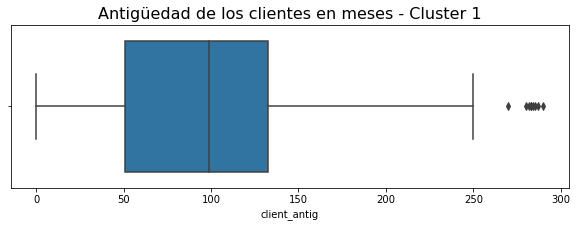

In [76]:
df_analisis_tsne = df_analisis_tsne.sort_values(by=["Mes"], ascending=True)
df_analisis_tsne['Mes'] = df_analisis_tsne['Mes'].astype(str)
plt.figure(figsize=(10, 3))
sns.boxplot(data=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 1], x='client_antig').set_title('Antigüedad de los clientes en meses - Cluster 1', fontsize=16)
plt.show

En el Cluster 1 encontramos personas de entre 30 y 50 años, casados y/o solteros, perteneciente en su mayoría a la región de cuyo, con casa propia, consumen principalmente los productos Plan Largo, revista convivimos y mensaje de texto a celulares, en su mayoría poseen nivel de estudio Secundario, y la antiguedad promedio es de entre 60 y 179 meses, lo que seria entre 5 y 15 años tienen un consumo medio mensual de 13 mil. 


##### Cluster 11

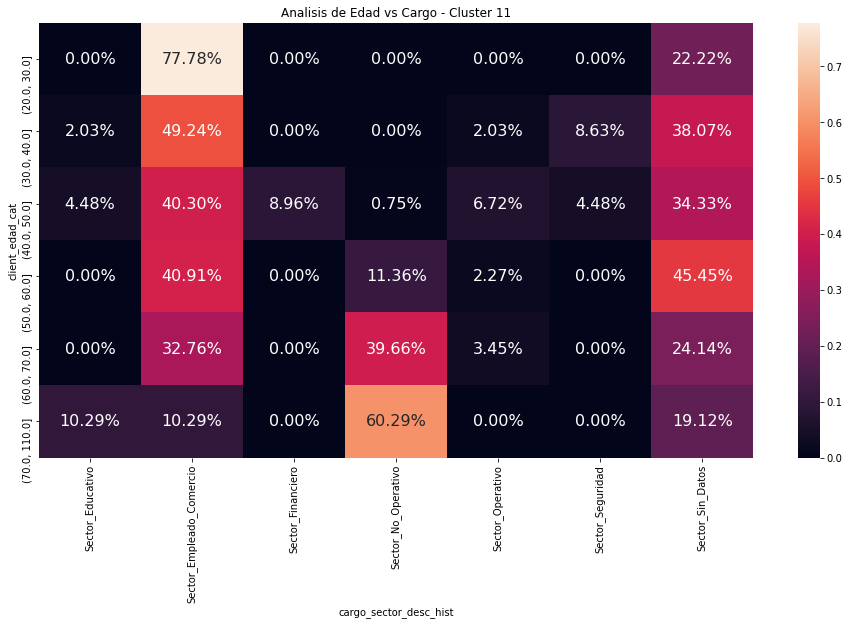

In [77]:
#cluster 11
fig, ax = plt.subplots(figsize=(16,8))
exp = pd.crosstab(df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 11].client_edad_cat, 
                  df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 11].cargo_sector_desc_hist,
                 normalize="index")
sns.heatmap(exp, annot=True, fmt='.2%', annot_kws={"fontsize":16})
plt.title('Analisis de Edad vs Cargo - Cluster 11')
plt.show()

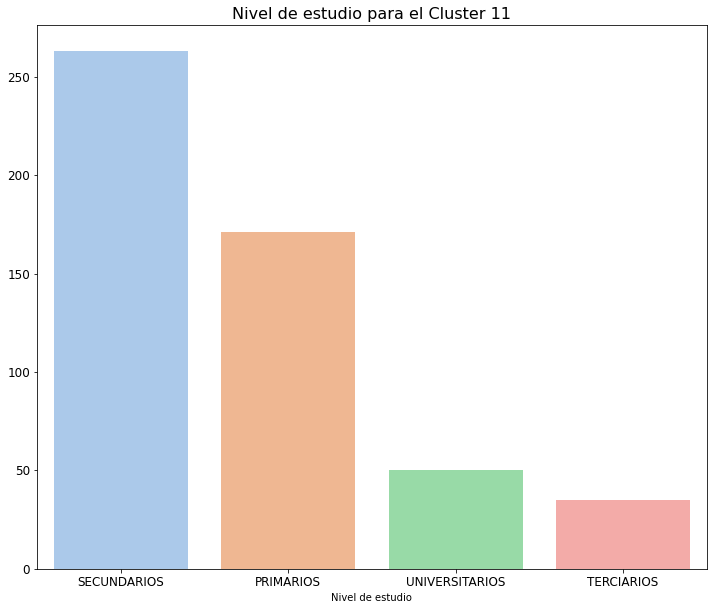

In [78]:
fig, ax = plt.subplots(figsize=(12,10))
sns.countplot(x=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 11].nivel_estudio_descripcion_histo, palette="pastel",
             order=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 11].nivel_estudio_descripcion_histo.value_counts().index)
ax.tick_params(labelsize=12)
plt.title('Nivel de estudio para el Cluster 11',fontsize=16)
ax.set_xlabel("Nivel de estudio")
ax.set_ylabel("")
plt.show()

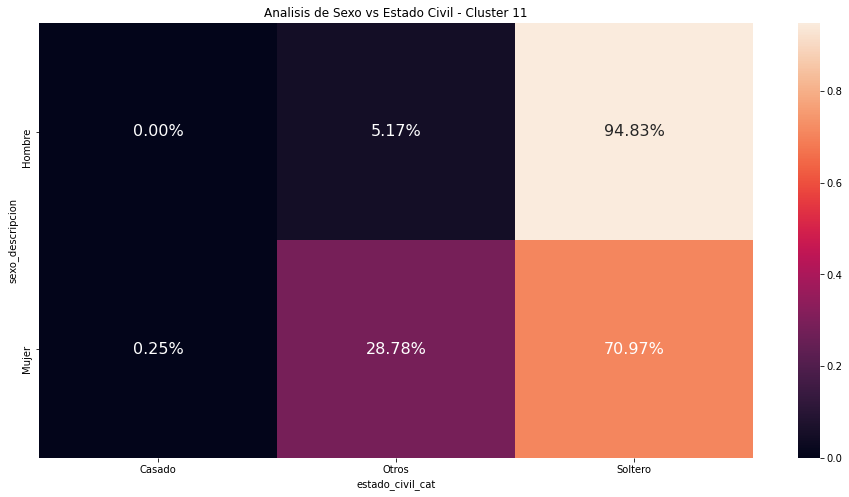

In [79]:
fig, ax = plt.subplots(figsize=(16,8))
exp = pd.crosstab(df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 11].sexo_descripcion, 
                  df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 11].estado_civil_cat,
                 normalize="index")
sns.heatmap(exp, annot=True, fmt='.2%', annot_kws={"fontsize":16})
plt.title('Analisis de Sexo vs Estado Civil - Cluster 11')
plt.show()

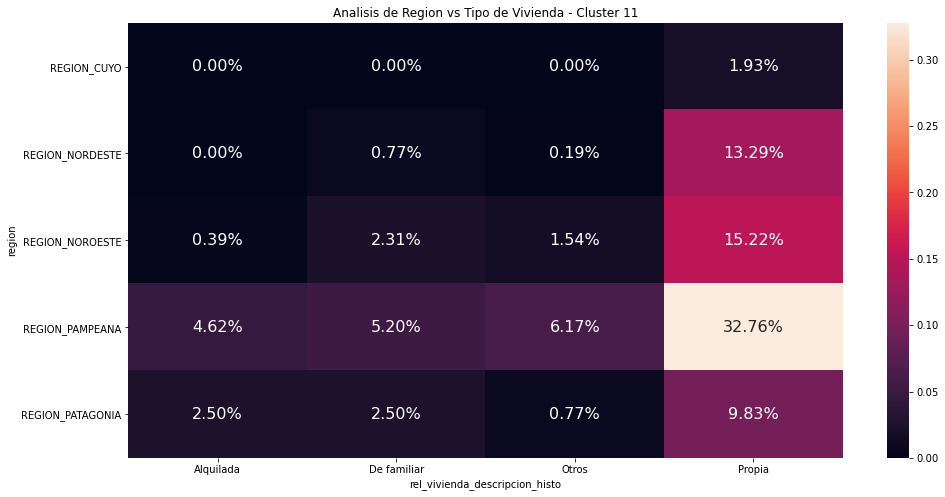

In [80]:
fig, ax = plt.subplots(figsize=(16,8))
exp = pd.crosstab(df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 11].region, 
                  df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 11].rel_vivienda_descripcion_histo,
                 normalize=True)
sns.heatmap(exp, annot=True, fmt='.2%', annot_kws={"fontsize":16})
plt.title('Analisis de Region vs Tipo de Vivienda - Cluster 11')
plt.show()

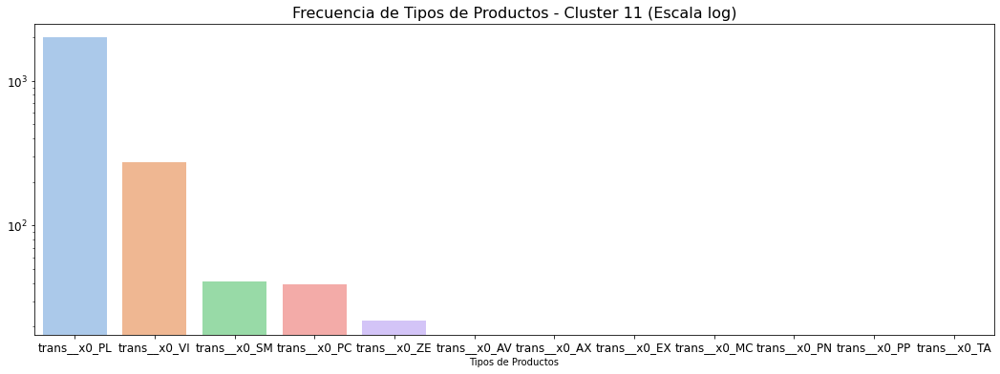

In [81]:
cols = [x for x in df_analisis_tsne.columns.values if 'trans__x0' in x]
df_tp_prod = df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 11][cols].sum().to_frame().reset_index()
df_tp_prod.rename(columns={0: 'frecuencia', 'index': 'tipo_prod'}, inplace=True)
df_tp_prod = df_tp_prod.sort_values(by='frecuencia',ascending=False)

fig, ax = plt.subplots(figsize=(18,6))
g=sns.barplot(x=df_tp_prod.tipo_prod, 
              y=df_tp_prod.frecuencia, 
              palette="pastel")
ax.set_yscale("log")
ax.tick_params(labelsize=12)
ax.set_xlabel("Tipos de Productos")
ax.set_ylabel("")
ax.set_title('Frecuencia de Tipos de Productos - Cluster 11 (Escala log)', fontsize=16)
plt.show()

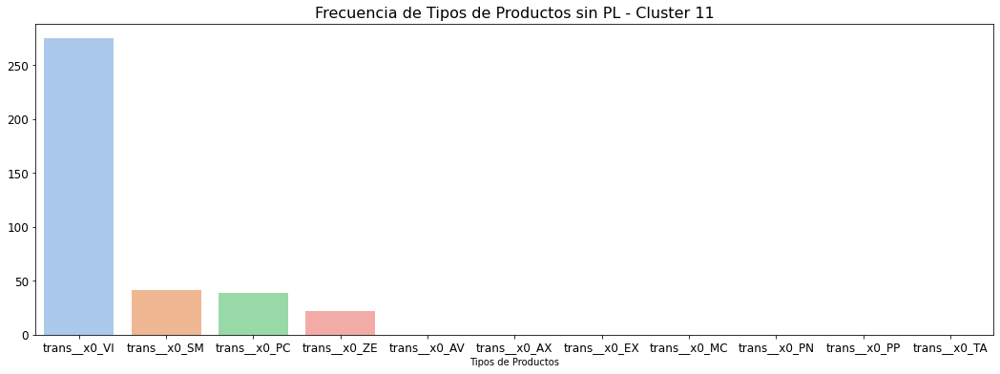

In [82]:
cols = [x for x in df_analisis_tsne.columns.values if ('trans__x0' in x) and ('PL' not in x)]
df_tp_prod = df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 11][cols].sum().to_frame().reset_index()
df_tp_prod.rename(columns={0: 'frecuencia', 'index': 'tipo_prod'}, inplace=True)
df_tp_prod = df_tp_prod.sort_values(by='frecuencia',ascending=False)

fig, ax = plt.subplots(figsize=(18,6))
g=sns.barplot(x=df_tp_prod.tipo_prod, 
              y=df_tp_prod.frecuencia, 
              palette="pastel")
#ax.set_yscale("log")
ax.tick_params(labelsize=12)
ax.set_xlabel("Tipos de Productos")
ax.set_ylabel("")
ax.set_title('Frecuencia de Tipos de Productos sin PL - Cluster 11', fontsize=16)
plt.show()

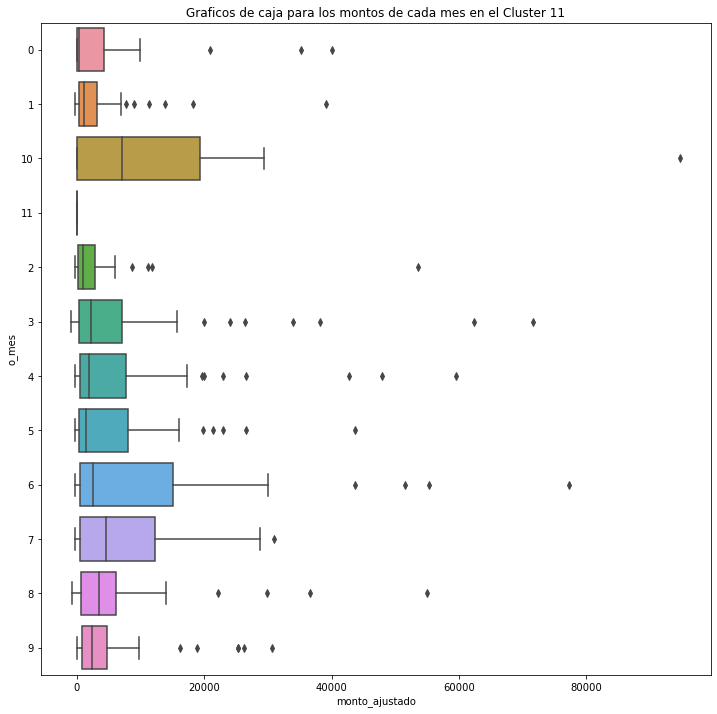

In [83]:
plt.figure(figsize=(12, 12))
sns.boxplot(data=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 11], x='monto_ajustado', y='o_mes')
plt.title("Graficos de caja para los montos de cada mes en el Cluster 11")
plt.show()

In [84]:
df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 11].groupby(['Mes']).monto_ajustado.describe()

,count,mean,std,min,25%,50%,75%,max
Mes,,,,,,,,
0,73.0,3010.843836,6774.618832,0.00,0.0000,372.740,4212.9700,40046.37
1,49.0,3328.405714,6506.988276,-269.91,292.1400,1139.070,3173.7000,39162.24
10,23.0,13243.056957,20386.573726,0.00,0.0000,7057.660,19380.7550,94726.58
11,12.0,0.000000,0.000000,0.00,0.0000,0.000,0.0000,0.00
2,50.0,3111.237200,7804.919284,-263.39,267.3800,1055.405,2867.7650,53645.66
3,55.0,7551.008364,14421.632435,-833.66,325.7400,2192.320,7159.1550,71606.66
4,45.0,8072.985556,13314.135805,-248.39,528.5500,1996.240,7667.0700,59548.41
5,48.0,5950.658542,8931.119418,-240.56,408.4900,1497.385,8129.3800,43613.69
6,39.0,11360.367436,17779.175408,-253.72,556.8050,2540.500,15119.4200,77320.17


In [85]:
df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 11].client_antig.describe()

count    519.000000
mean     117.273603
std       62.615810
min        0.000000
25%       79.000000
50%      116.000000
75%      155.000000
max      309.000000
Name: client_antig, dtype: float64

<function matplotlib.pyplot.show(close=None, block=None)>

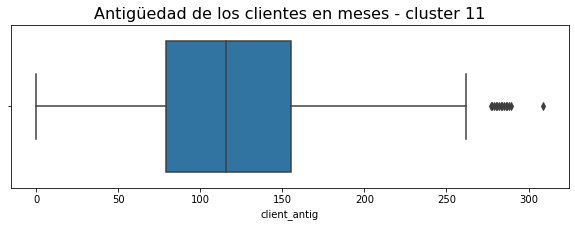

In [86]:
df_analisis_tsne = df_analisis_tsne.sort_values(by=["Mes"], ascending=True)
df_analisis_tsne['Mes'] = df_analisis_tsne['Mes'].astype(str)
plt.figure(figsize=(10, 3))
sns.boxplot(data=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 11], x='client_antig').set_title('Antigüedad de los clientes en meses - cluster 11', fontsize=16)
plt.show

- En este grupo encontramos principalmente personas de entre 30 y 50 años de edad sin datos respecto a su profesión. - En su mayoría poseen secundario completo y primario. 
- Encontramos igual proporción de hombres y mujeres, más solteros que casados.
- La mayoría se encuentran en la región pampeana y poseen vivienda propia.
- Consumen Plan Largo, Visa y Plan de Cuotas. Con media de consumo mensual entre 16 mil y 27 mil. 
- Antigüedad promedio entre 50 y 125 meses. 

##### Cluster 12

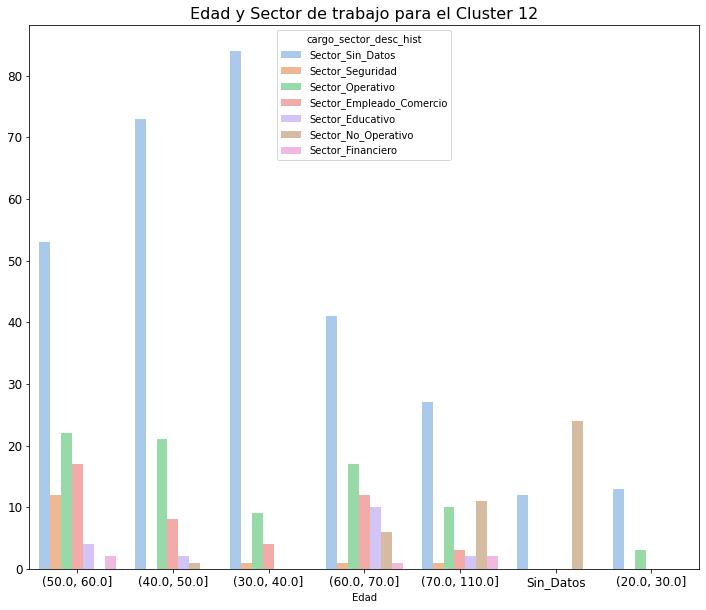

In [87]:
fig, ax = plt.subplots(figsize=(12,10))
sns.countplot(x=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 12].client_edad_cat, palette="pastel",
              hue=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 12].cargo_sector_desc_hist,
              order=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 12].client_edad_cat.value_counts().index)
ax.tick_params(labelsize=12)
plt.title('Edad y Sector de trabajo para el Cluster 12',fontsize=16)
ax.set_xlabel("Edad")
ax.set_ylabel("")
plt.show()

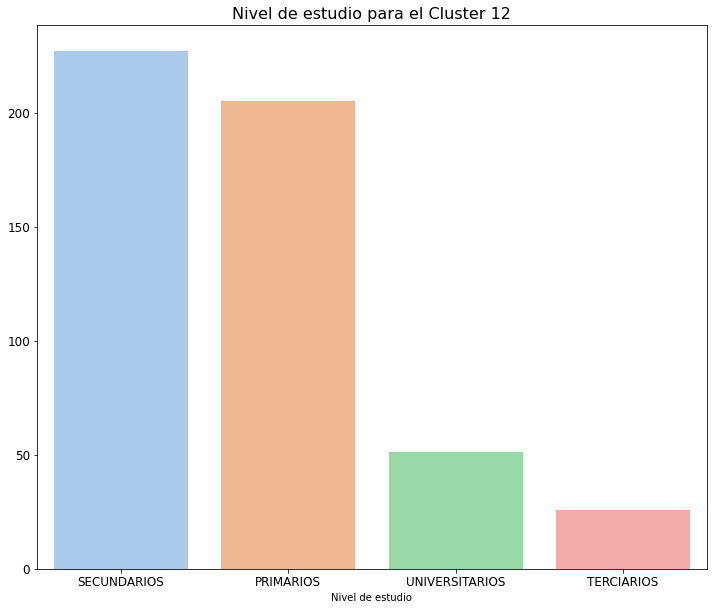

In [88]:
fig, ax = plt.subplots(figsize=(12,10))
sns.countplot(x=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 12].nivel_estudio_descripcion_histo, palette="pastel",
             order=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 12].nivel_estudio_descripcion_histo.value_counts().index)
ax.tick_params(labelsize=12)
plt.title('Nivel de estudio para el Cluster 12',fontsize=16)
ax.set_xlabel("Nivel de estudio")
ax.set_ylabel("")
plt.show()

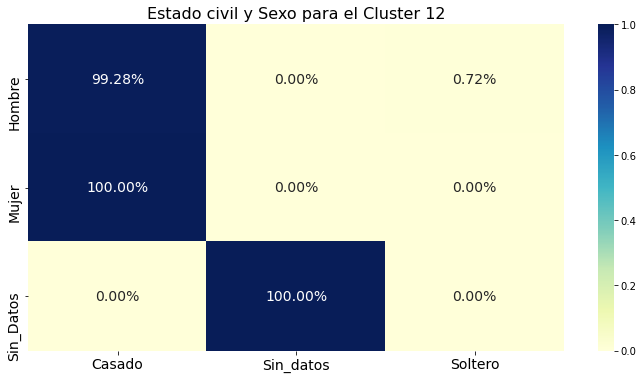

In [89]:
fig, ax = plt.subplots(figsize=(12,6))
exp = pd.crosstab(df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 12].sexo_descripcion, 
                  df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 12].estado_civil_cat,
                 normalize='index')
sns.heatmap(exp, annot=True, fmt='.2%', cmap="YlGnBu", annot_kws={"fontsize":14})
ax.tick_params(labelsize=14)
ax.set_xlabel("")
ax.set_ylabel("")
plt.title('Estado civil y Sexo para el Cluster 12', fontsize=16)
plt.show()

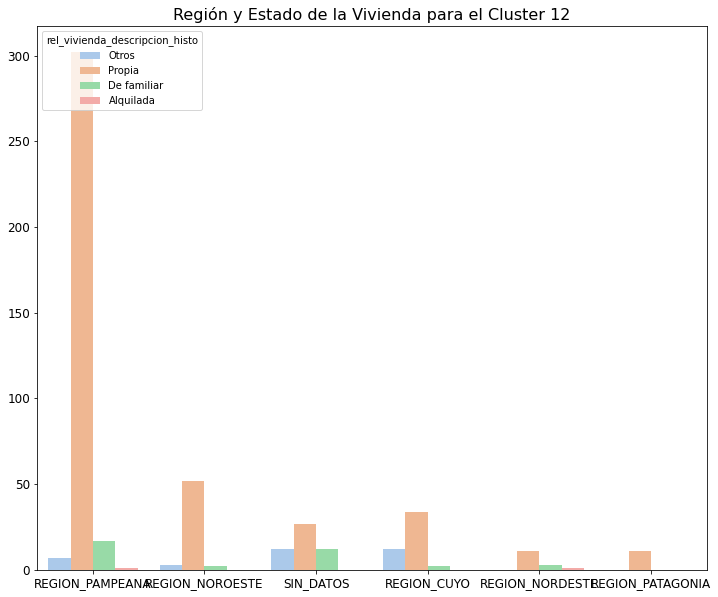

In [90]:
fig, ax = plt.subplots(figsize=(12,10))
sns.countplot(x=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 12].region, palette="pastel",
              hue=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 12].rel_vivienda_descripcion_histo,
              order=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 12].region.value_counts().index)
ax.tick_params(labelsize=12)
plt.title('Región y Estado de la Vivienda para el Cluster 12',fontsize=16)
ax.set_xlabel("")
ax.set_ylabel("")
plt.show()

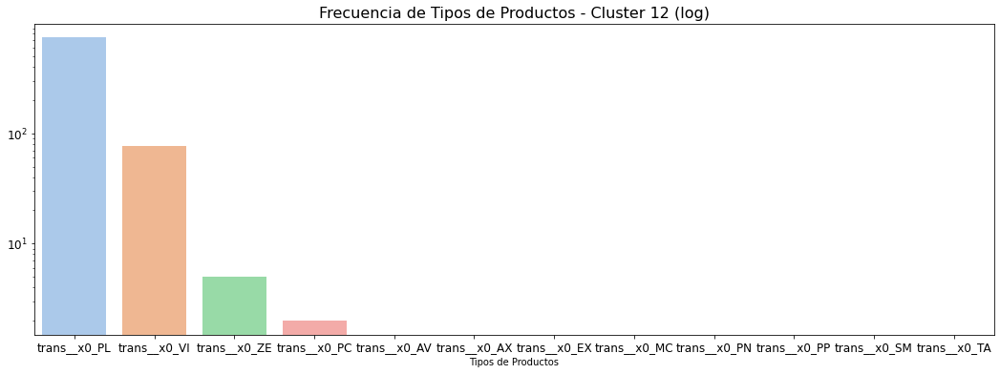

In [91]:
cols = [x for x in df_analisis_tsne.columns.values if 'trans__x0' in x]
df_tp_prod = df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 12][cols].sum().to_frame().reset_index()
df_tp_prod.rename(columns={0: 'frecuencia', 'index': 'tipo_prod'}, inplace=True)
df_tp_prod = df_tp_prod.sort_values(by='frecuencia',ascending=False)

fig, ax = plt.subplots(figsize=(18,6))
g=sns.barplot(x=df_tp_prod.tipo_prod, 
              y=df_tp_prod.frecuencia, 
              palette="pastel")
ax.set_yscale("log")
ax.tick_params(labelsize=12)
ax.set_xlabel("Tipos de Productos")
ax.set_ylabel("")
ax.set_title('Frecuencia de Tipos de Productos - Cluster 12 (log)', fontsize=16)
plt.show()

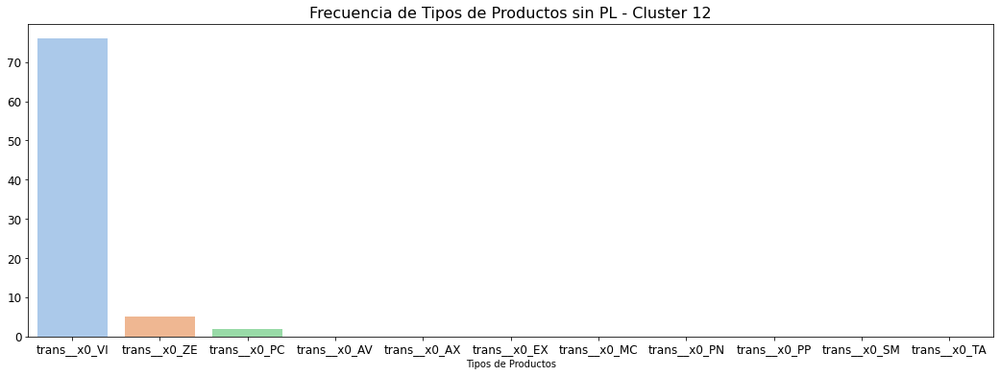

In [92]:
cols = [x for x in df_analisis_tsne.columns.values if ('trans__x0' in x) and ('PL' not in x)]
df_tp_prod = df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 12][cols].sum().to_frame().reset_index()
df_tp_prod.rename(columns={0: 'frecuencia', 'index': 'tipo_prod'}, inplace=True)
df_tp_prod = df_tp_prod.sort_values(by='frecuencia',ascending=False)

fig, ax = plt.subplots(figsize=(18,6))
g=sns.barplot(x=df_tp_prod.tipo_prod, 
              y=df_tp_prod.frecuencia, 
              palette="pastel")
#ax.set_yscale("log")
ax.tick_params(labelsize=12)
ax.set_xlabel("Tipos de Productos")
ax.set_ylabel("")
ax.set_title('Frecuencia de Tipos de Productos sin PL - Cluster 12', fontsize=16)
plt.show()

In [93]:
df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 12].groupby(['Mes']).monto_ajustado.describe()

,count,mean,std,min,25%,50%,75%,max
Mes,,,,,,,,
0,160.0,2534.616750,5149.680237,-308.70,0.00,0.000,3207.2600,29032.98
1,32.0,2036.491875,6419.473237,-452.64,-4.72,1.390,505.9650,34452.76
10,29.0,-11.412414,34.905840,-160.58,0.00,0.000,0.0000,0.00
11,40.0,0.000000,0.000000,0.00,0.00,0.000,0.0000,0.00
2,33.0,2335.456364,8594.512727,-441.71,0.00,0.000,307.8200,48386.92
3,36.0,1620.345556,6780.439652,-427.69,0.00,0.000,376.7500,39886.14
4,37.0,1734.692973,7841.516527,-416.55,0.00,0.000,334.1800,47509.04
5,34.0,1648.406471,5237.878467,-403.42,0.00,0.000,278.1800,22136.10
6,26.0,1878.577692,5617.195102,-3506.67,-4.08,0.000,509.1500,26525.91


In [94]:
df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 12].client_antig.describe()

count    509.000000
mean     107.534381
std       81.939274
min        0.000000
25%       41.000000
50%       71.000000
75%      179.000000
max      315.000000
Name: client_antig, dtype: float64

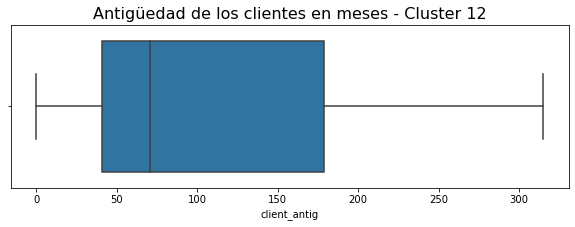

In [95]:
df_analisis_tsne = df_analisis_tsne.sort_values(by=["Mes"], ascending=True)
df_analisis_tsne['Mes'] = df_analisis_tsne['Mes'].astype(str)
plt.figure(figsize=(10, 3))
sns.boxplot(data=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 12], x='client_antig').set_title('Antigüedad de los clientes en meses - Cluster 12', fontsize=16)
plt.show()

El Cluster 12 esta compuesto por personas en su mayoría de entre 50 y 60 años, muchos de ellos declaran estar en el sector no operativo. La mayoria son casados y habitan en la región pampeana, aunque también estan presentes en la región de cuyo. Mayoritariamente tienen casa propia, consumen PL y plan de cuotas, tienen nivel de estudio secundario y primario, seguido de terciario y su antiguedad va desde los 5 hasta los 18 años. La media de este grupo de cliente es de 2 mil pesos mensuales.


##### Cluster 13

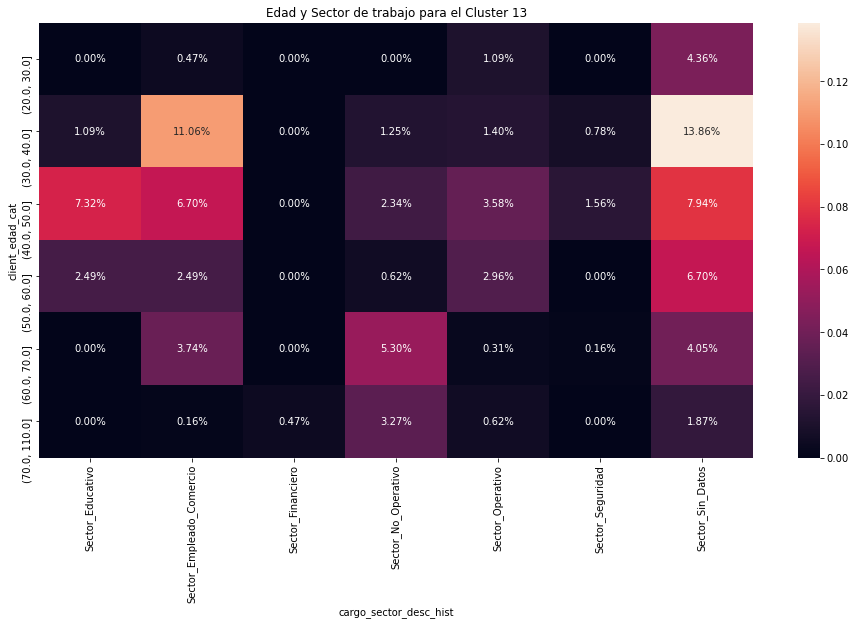

In [96]:
#cluster 13
fig, ax = plt.subplots(figsize=(16,8))
exp = pd.crosstab(df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 13].client_edad_cat, 
                  df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 13].cargo_sector_desc_hist,
                 normalize=True)
sns.heatmap(exp, annot=True, fmt='.2%')
plt.title('Edad y Sector de trabajo para el Cluster 13')
plt.show()

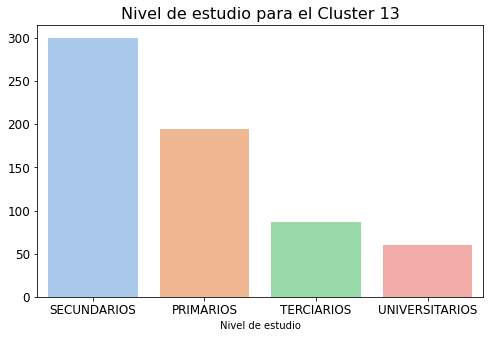

In [97]:
fig, ax = plt.subplots(figsize=(8,5))
sns.countplot(x=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 13].nivel_estudio_descripcion_histo, palette="pastel",
             order=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 13].nivel_estudio_descripcion_histo.value_counts().index)
ax.tick_params(labelsize=12)
plt.title('Nivel de estudio para el Cluster 13',fontsize=16)
ax.set_xlabel("Nivel de estudio")
ax.set_ylabel("")
plt.show()

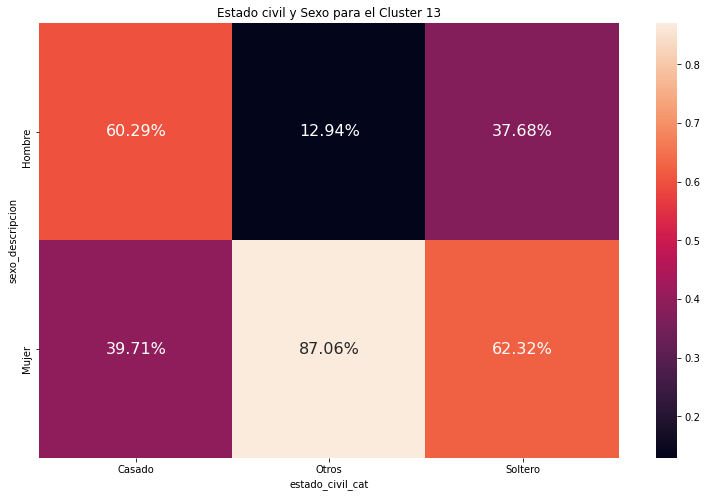

In [98]:
fig, ax = plt.subplots(figsize=(13,8))
exp = pd.crosstab(df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 13].sexo_descripcion, 
                  df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 13].estado_civil_cat,
                 normalize='columns')
sns.heatmap(exp, annot=True, fmt='.2%', annot_kws={"fontsize":16})
plt.title('Estado civil y Sexo para el Cluster 13')
plt.show()

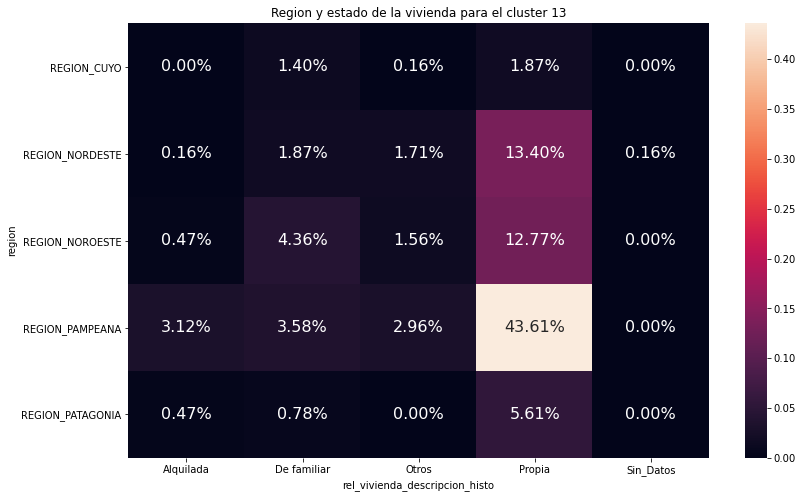

In [99]:
fig, ax = plt.subplots(figsize=(13,8))
exp = pd.crosstab(df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 13].region, 
                  df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 13].rel_vivienda_descripcion_histo,
                 normalize=True)
sns.heatmap(exp, annot=True, fmt='.2%', annot_kws={"fontsize":16})
plt.title('Region y estado de la vivienda para el cluster 13')
plt.show()

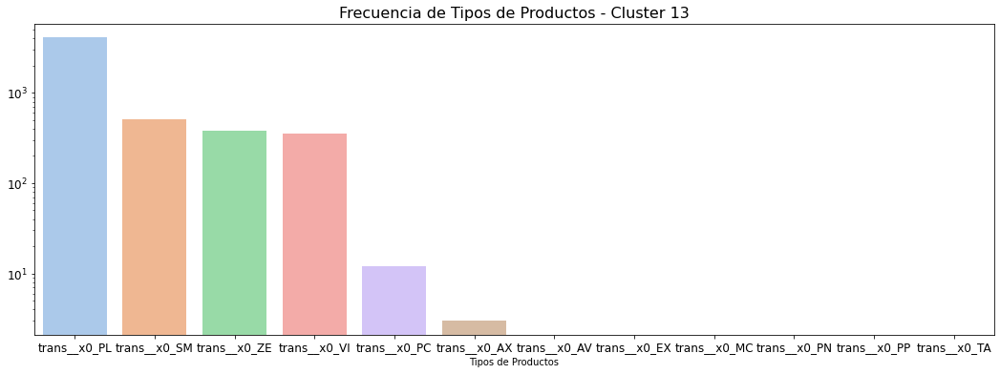

In [100]:
cols = [x for x in df_analisis_tsne.columns.values if 'trans__x0' in x]
df_tp_prod = df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 13][cols].sum().to_frame().reset_index()
df_tp_prod.rename(columns={0: 'frecuencia', 'index': 'tipo_prod'}, inplace=True)
df_tp_prod = df_tp_prod.sort_values(by='frecuencia',ascending=False)

fig, ax = plt.subplots(figsize=(18,6))
g=sns.barplot(x=df_tp_prod.tipo_prod, 
              y=df_tp_prod.frecuencia, 
              palette="pastel")
ax.set_yscale("log")
ax.tick_params(labelsize=12)
ax.set_xlabel("Tipos de Productos")
ax.set_ylabel("")
ax.set_title('Frecuencia de Tipos de Productos - Cluster 13', fontsize=16)
plt.show()

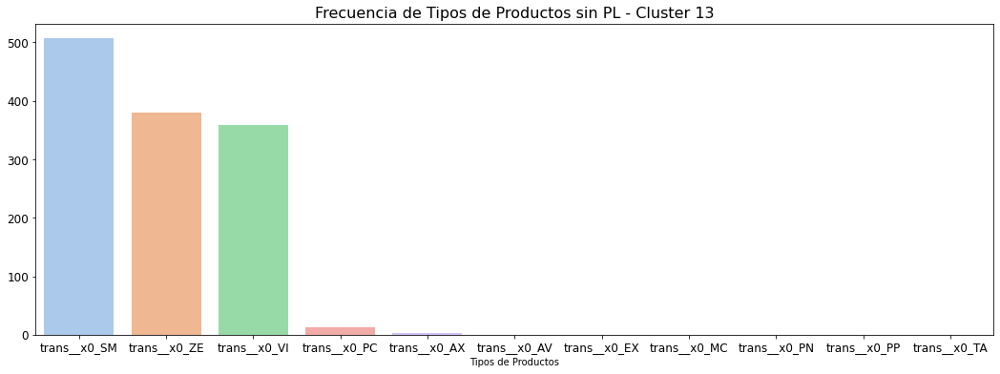

In [101]:
cols = [x for x in df_analisis_tsne.columns.values if ('trans__x0' in x) and ('PL' not in x)]
df_tp_prod = df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 13][cols].sum().to_frame().reset_index()
df_tp_prod.rename(columns={0: 'frecuencia', 'index': 'tipo_prod'}, inplace=True)
df_tp_prod = df_tp_prod.sort_values(by='frecuencia',ascending=False)

fig, ax = plt.subplots(figsize=(18,6))
g=sns.barplot(x=df_tp_prod.tipo_prod, 
              y=df_tp_prod.frecuencia, 
              palette="pastel")
#ax.set_yscale("log")
ax.tick_params(labelsize=12)
ax.set_xlabel("Tipos de Productos")
ax.set_ylabel("")
ax.set_title('Frecuencia de Tipos de Productos sin PL - Cluster 13', fontsize=16)
plt.show()

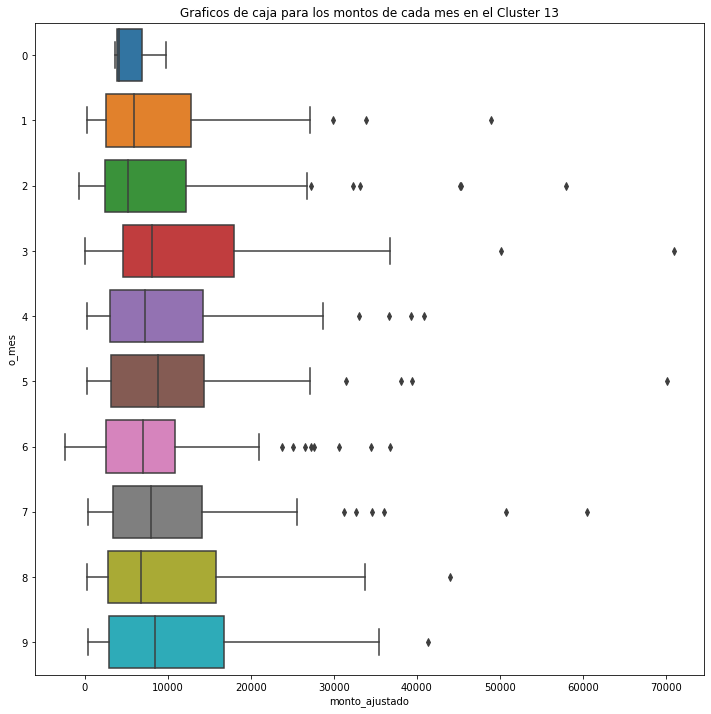

In [102]:
plt.figure(figsize=(12, 12))
sns.boxplot(data=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 13], x='monto_ajustado', y='o_mes')
plt.title("Graficos de caja para los montos de cada mes en el Cluster 13")
plt.show()

In [103]:
df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 1].groupby(['o_mes']).monto_ajustado.describe()

,count,mean,std,min,25%,50%,75%,max
o_mes,,,,,,,,
0,11.0,5134.501818,6687.142348,0.00,0.0000,1927.080,9252.2650,17796.52
1,30.0,20420.898000,18374.990126,0.00,4422.8550,12220.045,38206.4375,55402.41
10,4.0,5552.397500,6422.549493,0.00,0.0000,5320.300,10872.6975,11568.99
11,4.0,0.000000,0.000000,0.00,0.0000,0.000,0.0000,0.00
2,35.0,23092.234286,21453.718703,-538.38,9611.1850,19436.070,31798.0950,88130.84
3,31.0,23894.555161,20293.962905,0.00,6666.7300,20838.560,34442.6700,67136.66
4,40.0,25638.684500,26679.657762,0.00,6198.2350,19643.715,32784.1850,115309.97
5,38.0,28975.561316,27295.875910,0.00,12016.3750,21846.830,36017.4275,135584.24
6,40.0,24137.251250,21579.426891,0.00,8988.0825,17910.580,35092.4375,97773.28


In [104]:
df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 13].client_antig.describe()

count    642.000000
mean     101.384735
std       59.334951
min        1.000000
25%       55.000000
50%       93.000000
75%      147.000000
max      256.000000
Name: client_antig, dtype: float64

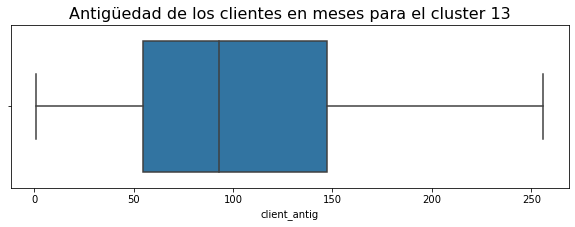

In [105]:
df_analisis_tsne = df_analisis_tsne.sort_values(by=["Mes"], ascending=True)
df_analisis_tsne['Mes'] = df_analisis_tsne['Mes'].astype(str)
plt.figure(figsize=(10, 3))
sns.boxplot(data=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'] == 13], x='client_antig').set_title('Antigüedad de los clientes en meses para el cluster 13', fontsize=16)
plt.show()

Este cluster también fue encontrado en la búsqueda realizada sobre el dataset con reducción de dimensionalidad PCA.

- Cluster 13 son personas jóvenes de entre 20 y 40 años de edad.
- No poseemos el dato de su profesión para ninguno de ellos. 
- Son solteros.
- Habitan en la región pampeana.
- No poseen datos de su situación respecto a la vivienda.
- Consumen Plan Largo y VISA principalmente.
- No poseemos datos de su nivel de estudio.
- Su antiguedad es menor a 12 meses en su mayoría.
- Su consumo medio mensual es entre 5 mil y 7mil pesos. 

##### Comportamiento del consumo medio de todos los cluster seleccionados

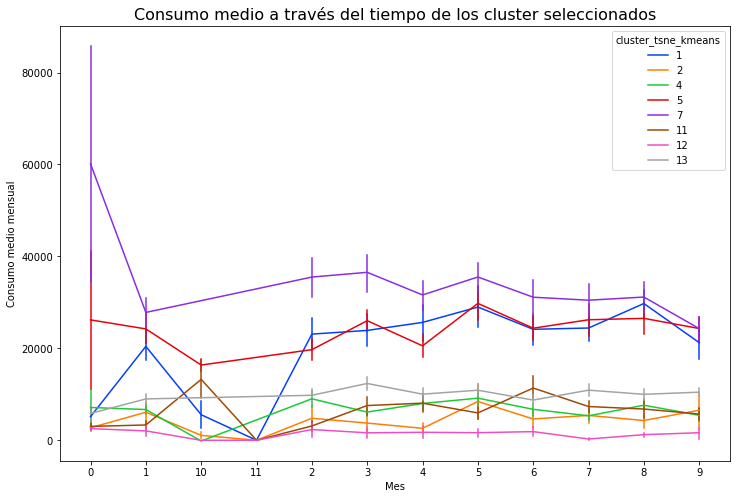

In [106]:
fig, ax = plt.subplots(figsize = (12,8)) 
sns.lineplot(data=df_analisis_tsne[df_analisis_tsne['cluster_tsne_kmeans'].isin([1,13,11,12,4,2,5,7])], x="Mes", y="monto_ajustado",
             hue="cluster_tsne_kmeans", err_style="bars", ci=68, estimator="mean", palette="bright")
plt.title('Consumo medio a través del tiempo de los cluster seleccionados',fontsize=16)
ax.set_xlabel("Mes")
ax.set_ylabel("Consumo medio mensual")
plt.show()

Podemos observar como el cluster 7 es el de consumo medio más alto en todo el período analizado, siendo el cluster 12 el de menor consumo. 

#### K-means sobre el dataset agrupado por DNI 

##### Con reducción de dimensionalidad (TSNE)

Para n_clusters = 8 El silhouette_score promedio es : 0.38509098
Para n_clusters = 10 El silhouette_score promedio es : 0.3812853
Para n_clusters = 12 El silhouette_score promedio es : 0.37429267
Para n_clusters = 14 El silhouette_score promedio es : 0.39099887
Para n_clusters = 16 El silhouette_score promedio es : 0.40733358
Para n_clusters = 18 El silhouette_score promedio es : 0.41828558
Para n_clusters = 20 El silhouette_score promedio es : 0.42306873
Para n_clusters = 22 El silhouette_score promedio es : 0.42173934
Para n_clusters = 24 El silhouette_score promedio es : 0.4262143


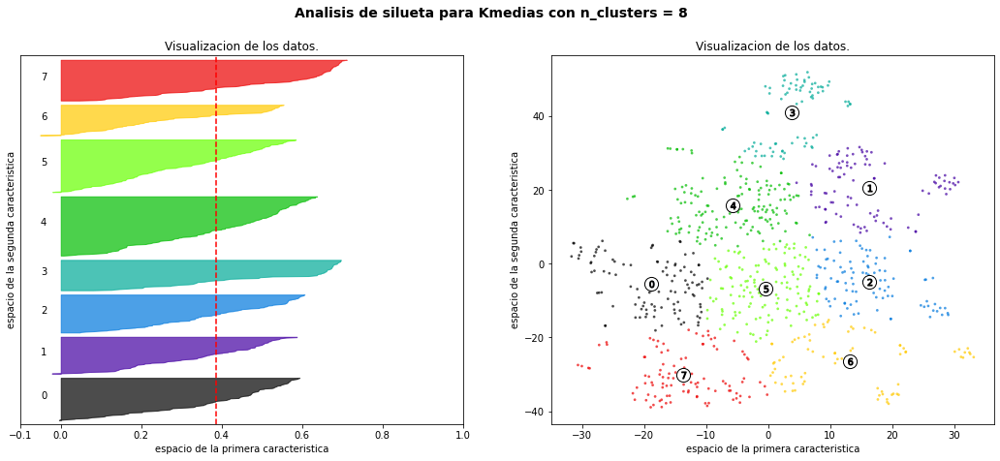

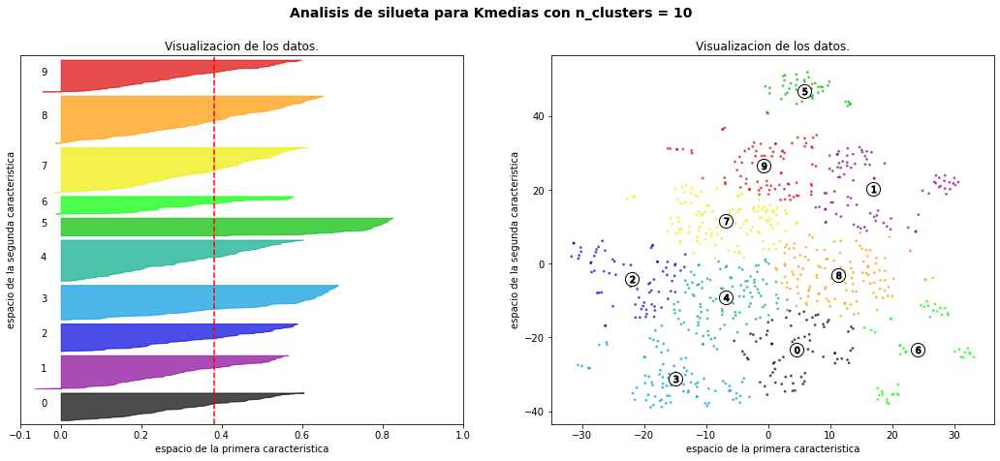

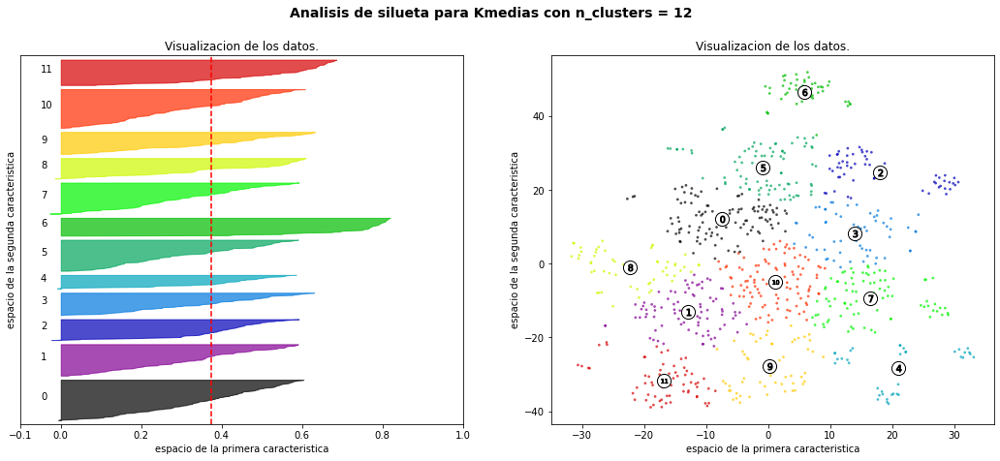

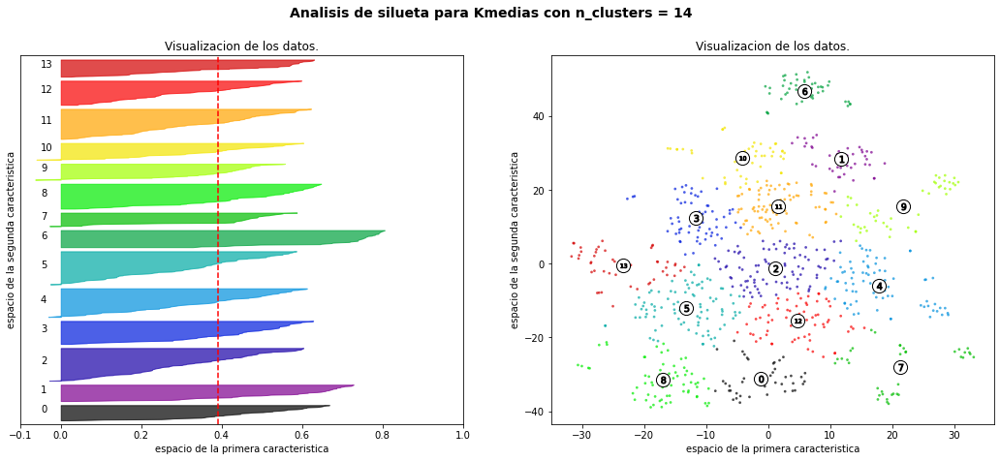

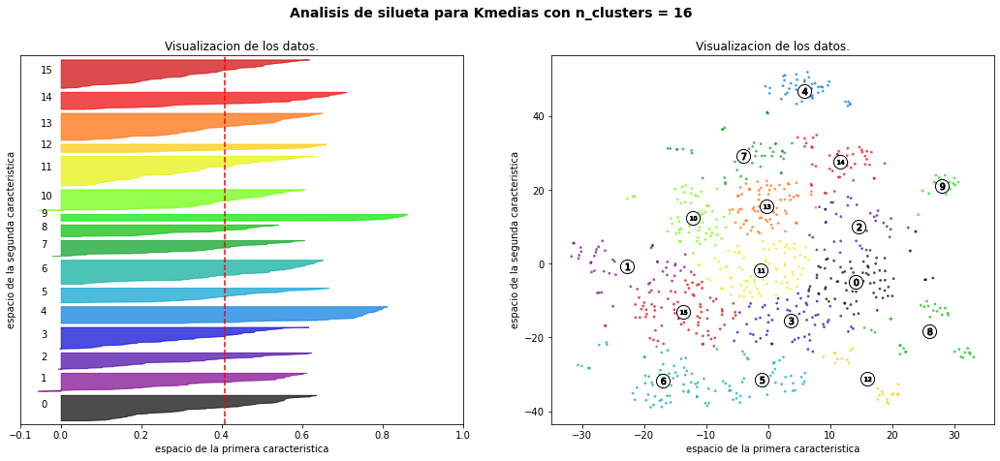

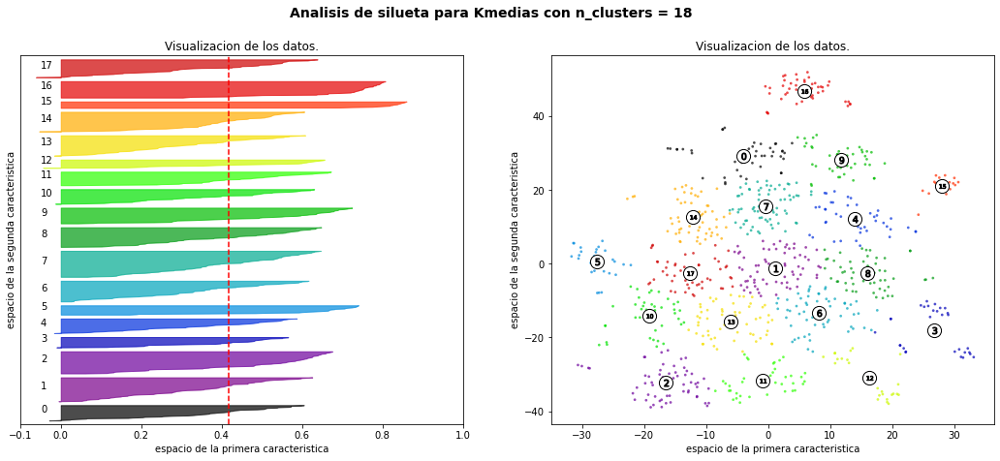

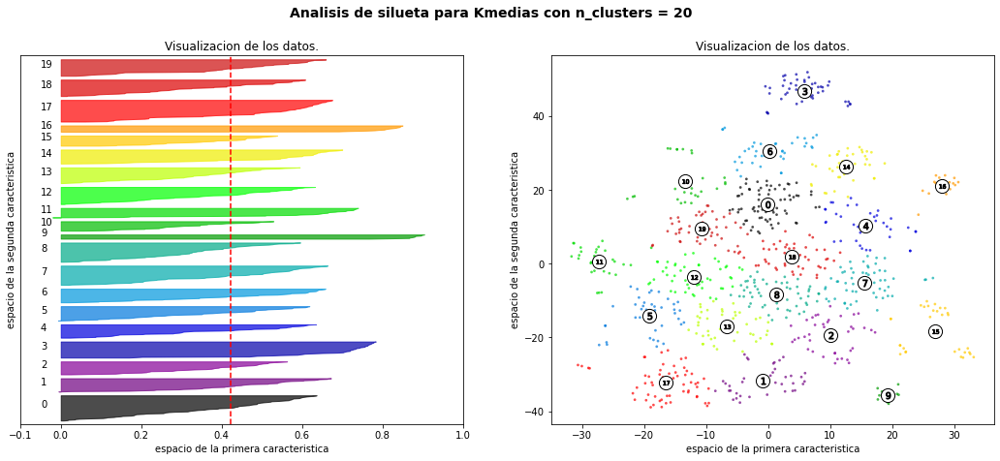

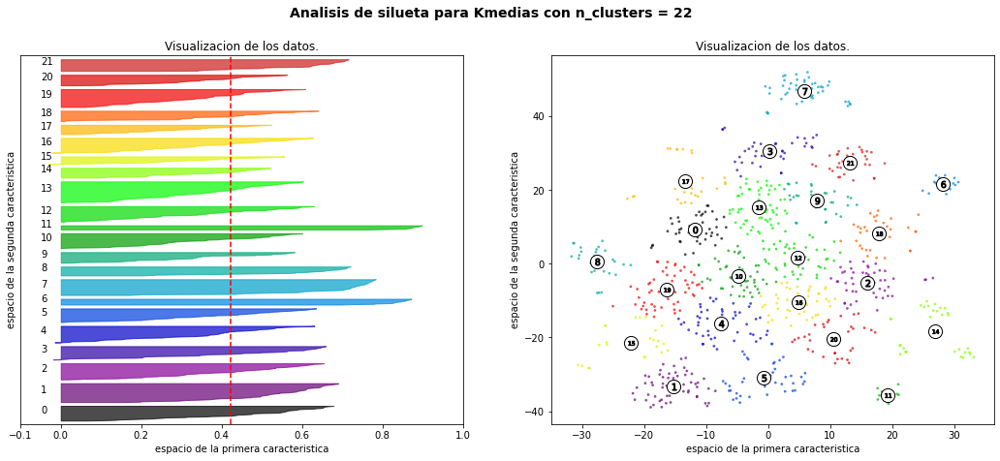

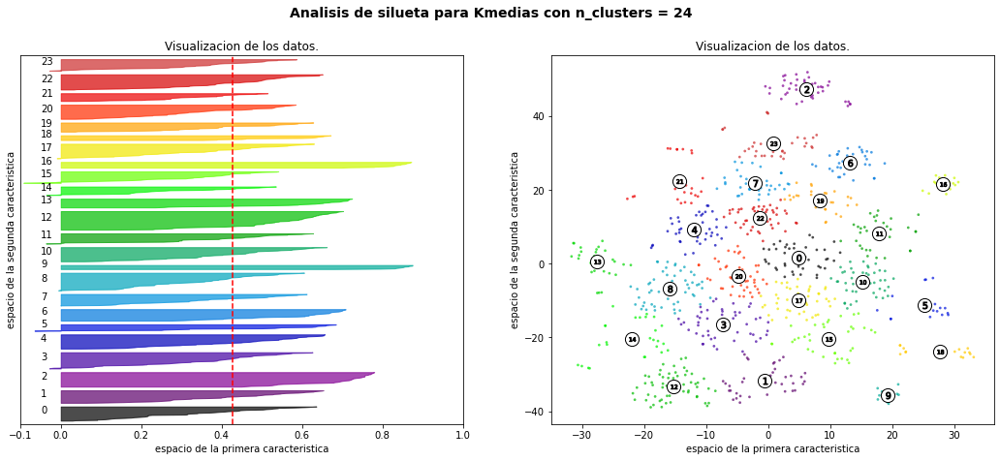

In [107]:
# con DF con TSNE
X = X_dni_tsne_all

range_n_clusters = np.arange(8,25,2)
sse ={}
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10, n_init = 100 )
    cluster_labels = clusterer.fit_predict(X)
    sse[n_clusters] = clusterer.inertia_

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("Para n_clusters =", n_clusters,
          "El silhouette_score promedio es :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Visualizacion de los datos.")
    ax1.set_xlabel("espacio de la primera caracteristica")
    ax1.set_ylabel("espacio de la segunda caracteristica")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X_dni_tsne_all[:, 0], X_dni_tsne_all[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("Visualizacion de los datos.")
    ax2.set_xlabel("espacio de la primera caracteristica")
    ax2.set_ylabel("espacio de la segunda caracteristica")

    plt.suptitle(("Analisis de silueta para Kmedias "
                  "con n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    #plt.savefig("kmeans_%d" % n_clusters, dpi=300)

plt.show()

Al igual que en la búsqueda de clusters realizada en el dataset agrupado por mes, podemos observar como se arman grupos más separados del centro de puntos, los cuales analizaremos a continuación. 

Text(0.5, 1.0, 'Inertia of k-Means versus number of clusters')

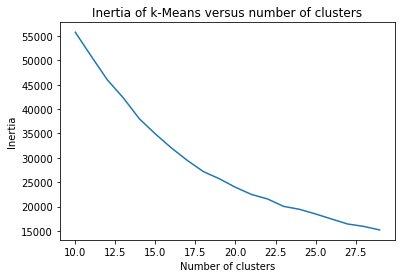

In [108]:
#Prueba: para elegir el hiperparámetro n_clusters, variando de 2 a 11 clusters
scores = [KMeans(n_clusters=i, random_state = 28).fit(X_dni_tsne_all).inertia_ for i in range(10,30)]

plt.plot(np.arange(10,30), scores)
plt.xlabel('Number of clusters')
plt.ylabel("Inertia")
plt.title("Inertia of k-Means versus number of clusters")

##### Guardado de etiquetas

In [109]:
# Número de clusters buscado
n_clust = 20

km = KMeans(n_clusters=n_clust, random_state=10, n_init = 100)
km.fit(X_dni_tsne_all) 

df_clusters_dni['cluster_dni_kmeans'] = km.labels_

# Recuperacion de etiquetas
clusters = km.labels_
print('Suma de los cuadrados de las distancias al cluster(Inertia) ', km.inertia_)

Suma de los cuadrados de las distancias al cluster(Inertia)  23828.515625


In [110]:
print('Coeficiente de silueta =', silhouette_score(X_dni_tsne_all, clusters))

Coeficiente de silueta = 0.42306873


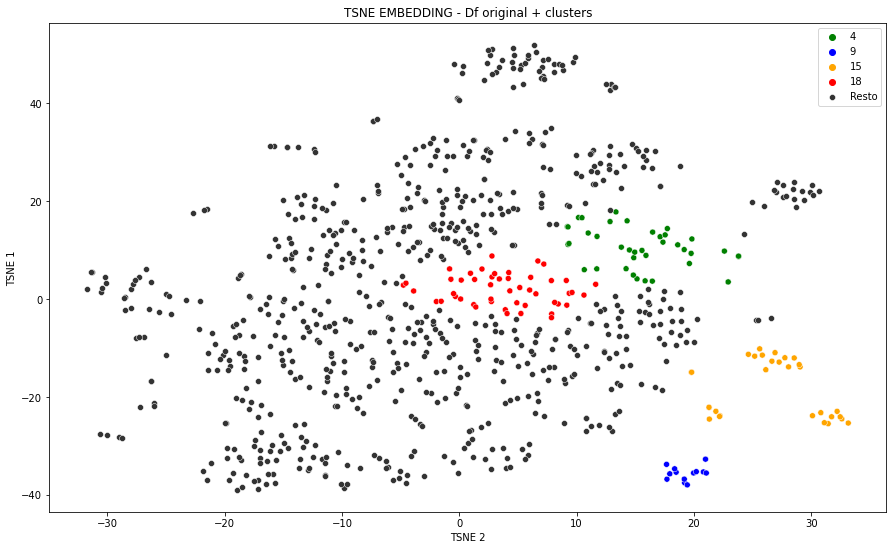

In [111]:
dff = pd.DataFrame({'0':X_dni_tsne_all[:,0], '1':X_dni_tsne_all[:,1], 'clusters':clusters})

plt.figure(figsize=(15, 9))
plt.ylabel('TSNE 1')
plt.xlabel('TSNE 2')
plt.title('TSNE EMBEDDING - Df original + clusters')
data = dff[dff.clusters.isin([18,15,9,4])]
data2 = dff[~dff.clusters.isin([18,15,9,4])]
colors = ['green', 'blue', 'orange', 'red']

sns.scatterplot(data = data, x='0', y='1', palette=colors, hue='clusters')
sns.scatterplot(data = data2, x='0', y='1', color=".2", label='Resto')
plt.show()

#### Análisis

In [112]:
df_clientes = pd.read_parquet('datos_clientes.parquet')

In [113]:
df_analisis_dni = df_clientes.merge(df_clusters_dni, on='dni_titular_movimiento', validate='1:m')

In [114]:
df_analisis_dni = df_analisis_dni[df_analisis_dni.cluster_dni_kmeans.isin([18,15,9,4])]

##### Cluster 4

In [115]:
df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 4].shape

(39, 52)

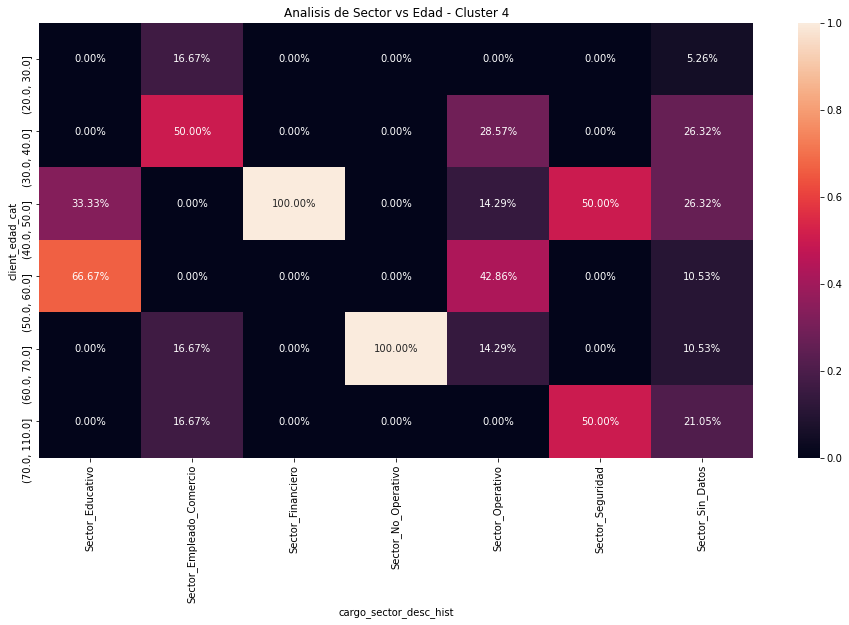

In [116]:
#cluster 4
fig, ax = plt.subplots(figsize=(16,8))
exp = pd.crosstab(df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 4].client_edad_cat, 
                  df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 4].cargo_sector_desc_hist, normalize='columns')
sns.heatmap(exp, annot=True, fmt='.2%')
plt.title('Analisis de Sector vs Edad - Cluster 4')
plt.show()

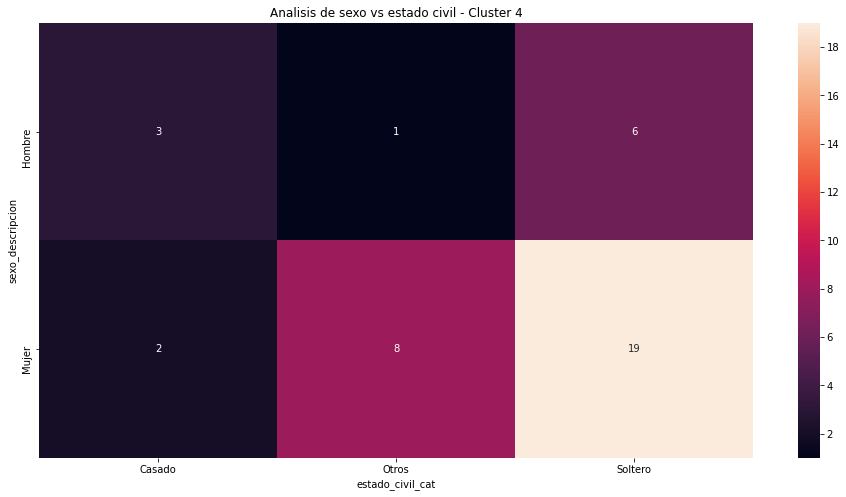

In [117]:
fig, ax = plt.subplots(figsize=(16,8))
exp = pd.crosstab(df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 4].sexo_descripcion, 
                  df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 4].estado_civil_cat)
sns.heatmap(exp, annot=True, fmt='g')
plt.title('Analisis de sexo vs estado civil - Cluster 4')
plt.show()

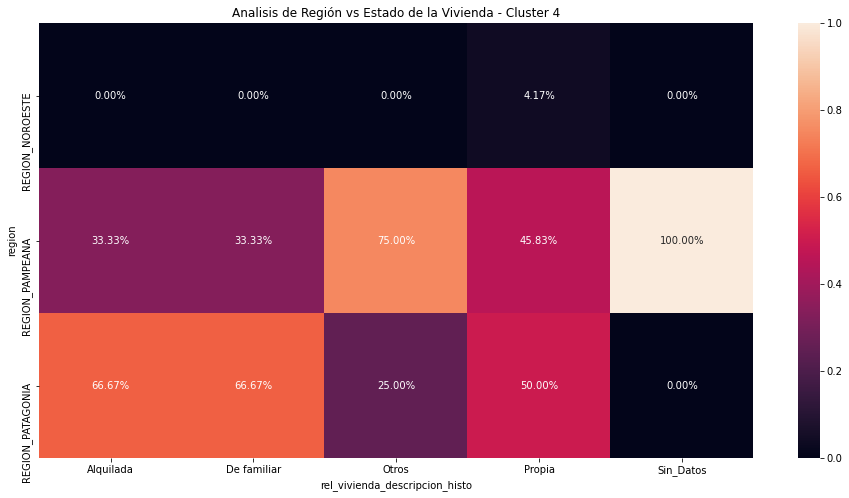

In [118]:
fig, ax = plt.subplots(figsize=(16,8))
exp = pd.crosstab(df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 4].region, 
                  df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 4].rel_vivienda_descripcion_histo, normalize='columns')
sns.heatmap(exp, annot=True, fmt='.2%')
plt.title('Analisis de Región vs Estado de la Vivienda - Cluster 4')
plt.show()

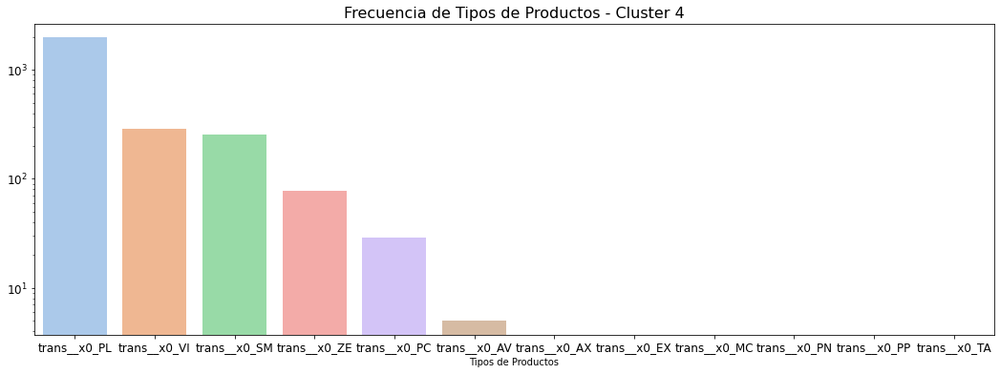

In [119]:
cols = [x for x in df_analisis_dni.columns.values if 'trans__x0' in x]
df_tp_prod = df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 4][cols].sum().to_frame().reset_index()
df_tp_prod.rename(columns={0: 'frecuencia', 'index': 'tipo_prod'}, inplace=True)
df_tp_prod = df_tp_prod.sort_values(by='frecuencia',ascending=False)

fig, ax = plt.subplots(figsize=(18,6))
g=sns.barplot(x=df_tp_prod.tipo_prod, 
              y=df_tp_prod.frecuencia, 
              palette="pastel")
ax.set_yscale("log")
ax.tick_params(labelsize=12)
ax.set_xlabel("Tipos de Productos")
ax.set_ylabel("")
ax.set_title('Frecuencia de Tipos de Productos - Cluster 4', fontsize=16)
plt.show()

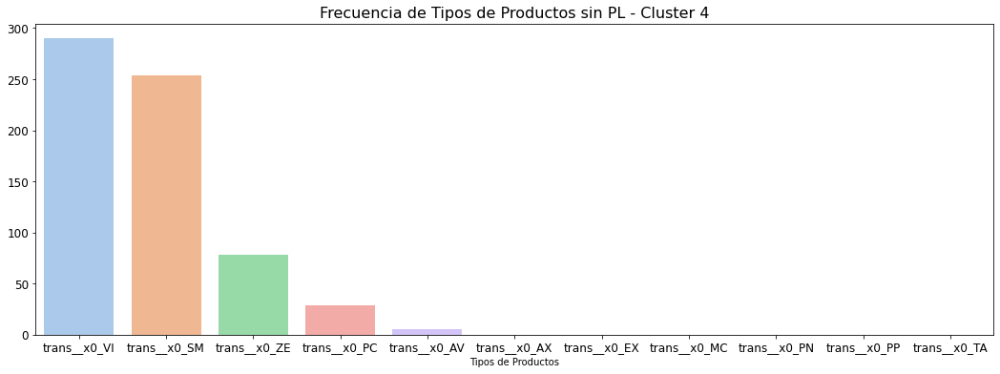

In [120]:
cols = [x for x in df_analisis_dni.columns.values if ('trans__x0' in x) and ('PL' not in x)]
df_tp_prod = df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 4][cols].sum().to_frame().reset_index()
df_tp_prod.rename(columns={0: 'frecuencia', 'index': 'tipo_prod'}, inplace=True)
df_tp_prod = df_tp_prod.sort_values(by='frecuencia',ascending=False)

fig, ax = plt.subplots(figsize=(18,6))
g=sns.barplot(x=df_tp_prod.tipo_prod, 
              y=df_tp_prod.frecuencia, 
              palette="pastel")
#ax.set_yscale("log")
ax.tick_params(labelsize=12)
ax.set_xlabel("Tipos de Productos")
ax.set_ylabel("")
ax.set_title('Frecuencia de Tipos de Productos sin PL - Cluster 4', fontsize=16)
plt.show()

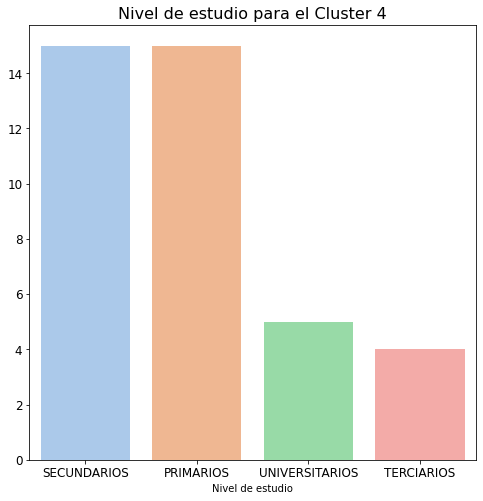

In [121]:
fig, ax = plt.subplots(figsize=(8,8))
sns.countplot(x=df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 4].nivel_estudio_descripcion_histo, palette="pastel",
             order=df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 4].nivel_estudio_descripcion_histo.value_counts().index)
ax.tick_params(labelsize=12)
plt.title('Nivel de estudio para el Cluster 4',fontsize=16)
ax.set_xlabel("Nivel de estudio")
ax.set_ylabel("")
plt.show()

In [122]:
df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 4]['monto_ajustado'].describe()

count        39.000000
mean     101184.302308
std      119570.761231
min       -2546.010000
25%       24762.875000
50%       55760.160000
75%      137884.505000
max      486521.010000
Name: monto_ajustado, dtype: float64

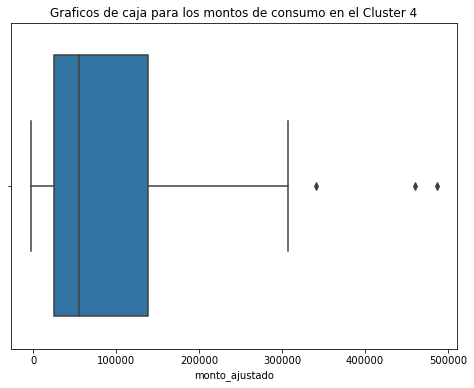

In [123]:
plt.figure(figsize=(8, 6))
sns.boxplot(data=df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 4], x='monto_ajustado')
plt.title("Graficos de caja para los montos de consumo en el Cluster 4")
plt.show()

In [124]:
df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 4].client_antig.describe()

count     39.000000
mean     135.230769
std       86.067434
min        7.000000
25%       57.500000
50%      122.000000
75%      203.500000
max      368.000000
Name: client_antig, dtype: float64

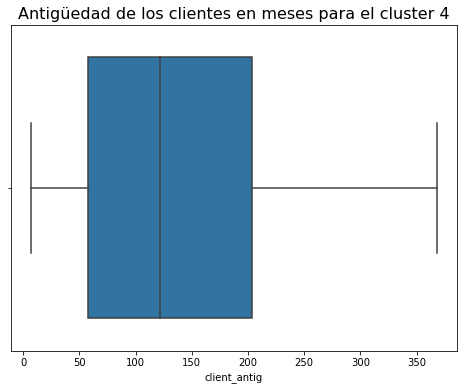

In [125]:
plt.figure(figsize=(8, 6))
sns.boxplot(data=df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 4], x='client_antig').set_title('Antigüedad de los clientes en meses para el cluster 4', fontsize=16)
plt.show()

CONCLUSIÓN:
- Más de la mitad de los clientes de este cluster están en el rango de 60 a 110 años de edad.
- Sin datos en la profesión.
- Hay igual proporción de casados y solteros y de hombres y mujeres.
- Se encuentran en su mayoría en la región cuyana y algunos cuantos en la región noereste.
- Consumen Plan Largo, Mensaje de texto a celulares y Visa. 
- Todos ellos poseen secundario completo. 
- Poseen un consumo medio total para el periodo analizado de 42 mil pesos. 
- La antigüedad para estos clientes esta comprendida entre 38 y 90 meses. 


##### Cluster 9

In [126]:
df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 9].shape

(13, 52)

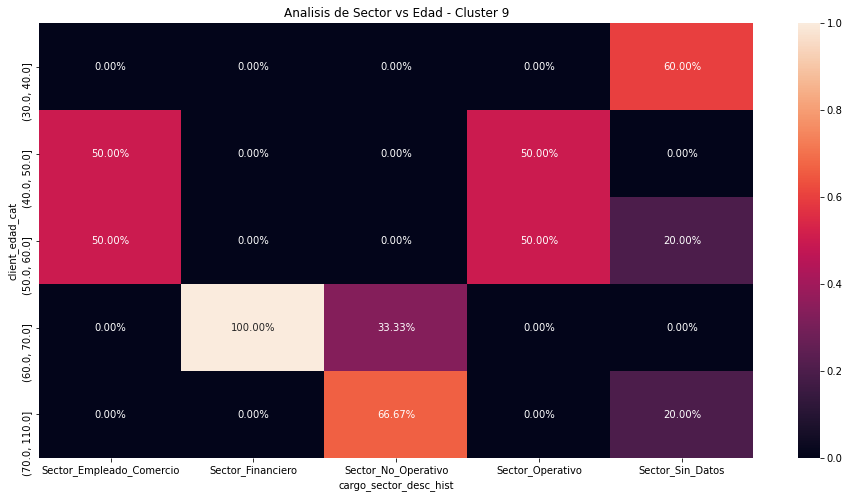

In [127]:
#cluster 4
fig, ax = plt.subplots(figsize=(16,8))
exp = pd.crosstab(df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 9].client_edad_cat, 
                  df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 9].cargo_sector_desc_hist,normalize='columns')
sns.heatmap(exp, annot=True, fmt='.2%')
plt.title('Analisis de Sector vs Edad - Cluster 9')
plt.show()

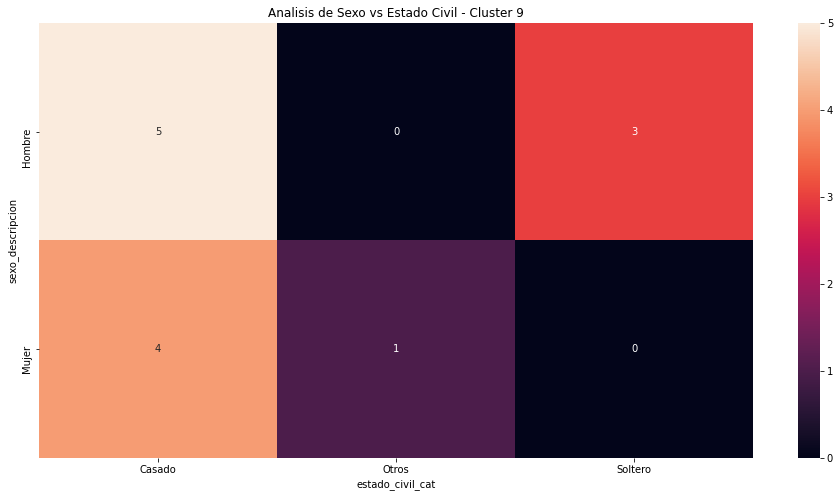

In [128]:
fig, ax = plt.subplots(figsize=(16,8))
exp = pd.crosstab(df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 9].sexo_descripcion, 
                  df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 9].estado_civil_cat)
sns.heatmap(exp, annot=True, fmt='g')
plt.title('Analisis de Sexo vs Estado Civil - Cluster 9')
plt.show()

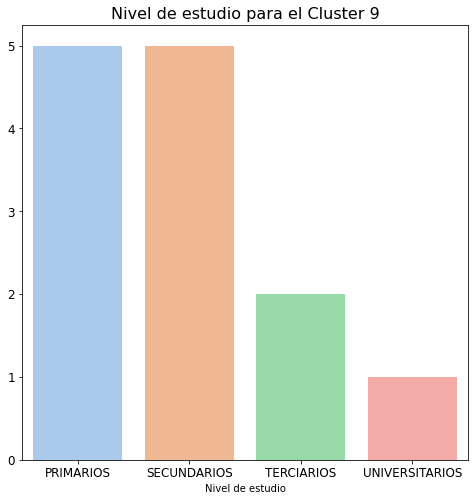

In [129]:
fig, ax = plt.subplots(figsize=(8,8))
sns.countplot(x=df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 9].nivel_estudio_descripcion_histo, palette="pastel",
             order=df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 9].nivel_estudio_descripcion_histo.value_counts().index)
ax.tick_params(labelsize=12)
plt.title('Nivel de estudio para el Cluster 9',fontsize=16)
ax.set_xlabel("Nivel de estudio")
ax.set_ylabel("")
plt.show()

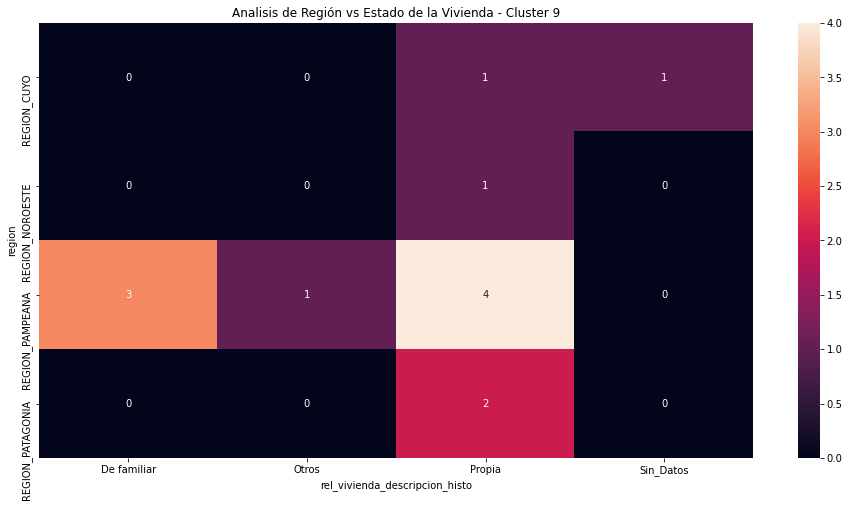

In [130]:
fig, ax = plt.subplots(figsize=(16,8))
exp = pd.crosstab(df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 9].region, 
                  df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 9].rel_vivienda_descripcion_histo)
sns.heatmap(exp, annot=True, fmt='g')
plt.title('Analisis de Región vs Estado de la Vivienda - Cluster 9')
plt.show()

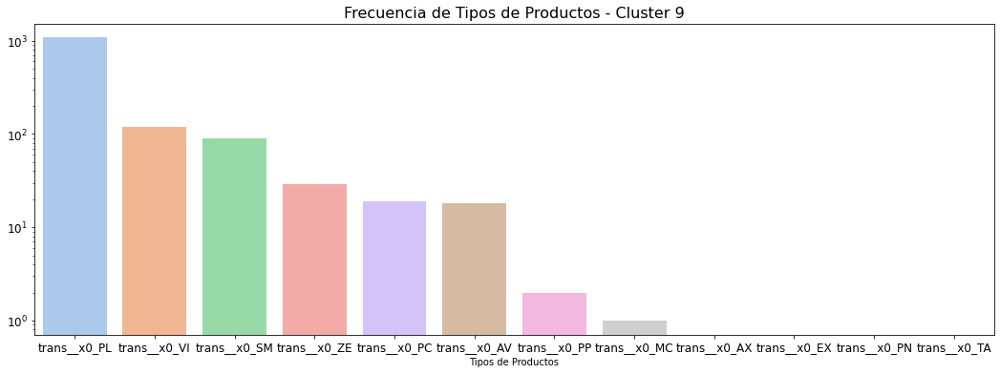

In [131]:
cols = [x for x in df_analisis_dni.columns.values if 'trans__x0' in x]
df_tp_prod = df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 9][cols].sum().to_frame().reset_index()
df_tp_prod.rename(columns={0: 'frecuencia', 'index': 'tipo_prod'}, inplace=True)
df_tp_prod = df_tp_prod.sort_values(by='frecuencia',ascending=False)

fig, ax = plt.subplots(figsize=(18,6))
g=sns.barplot(x=df_tp_prod.tipo_prod, 
              y=df_tp_prod.frecuencia, 
              palette="pastel")
ax.set_yscale("log")
ax.tick_params(labelsize=12)
ax.set_xlabel("Tipos de Productos")
ax.set_ylabel("")
ax.set_title('Frecuencia de Tipos de Productos - Cluster 9', fontsize=16)
plt.show()

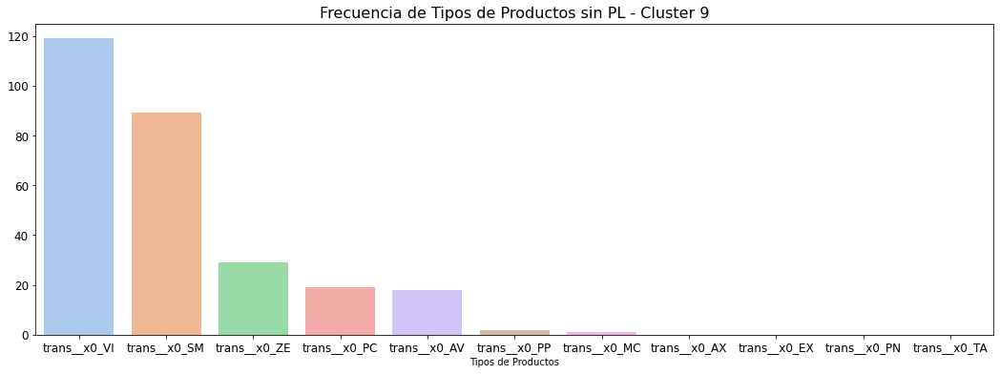

In [132]:
cols = [x for x in df_analisis_dni.columns.values if ('trans__x0' in x) and ('PL' not in x)]
df_tp_prod = df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 9][cols].sum().to_frame().reset_index()
df_tp_prod.rename(columns={0: 'frecuencia', 'index': 'tipo_prod'}, inplace=True)
df_tp_prod = df_tp_prod.sort_values(by='frecuencia',ascending=False)

fig, ax = plt.subplots(figsize=(18,6))
g=sns.barplot(x=df_tp_prod.tipo_prod, 
              y=df_tp_prod.frecuencia, 
              palette="pastel")
#ax.set_yscale("log")
ax.tick_params(labelsize=12)
ax.set_xlabel("Tipos de Productos")
ax.set_ylabel("")
ax.set_title('Frecuencia de Tipos de Productos sin PL - Cluster 9', fontsize=16)
plt.show()

In [133]:
df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 9]['monto_ajustado'].describe()

count        13.000000
mean     154482.500769
std       96586.854544
min       31689.190000
25%       57542.460000
50%      169861.980000
75%      225653.680000
max      325174.850000
Name: monto_ajustado, dtype: float64

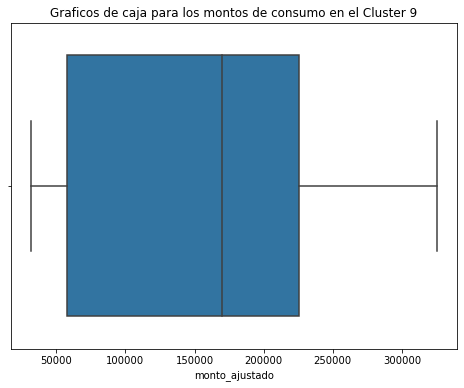

In [134]:
plt.figure(figsize=(8, 6))
sns.boxplot(data=df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 9], x='monto_ajustado')
plt.title("Graficos de caja para los montos de consumo en el Cluster 9")
plt.show()

In [135]:
df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 9].client_antig.describe()

count     13.000000
mean     157.538462
std       61.597640
min       53.000000
25%      116.000000
50%      162.000000
75%      190.000000
max      252.000000
Name: client_antig, dtype: float64

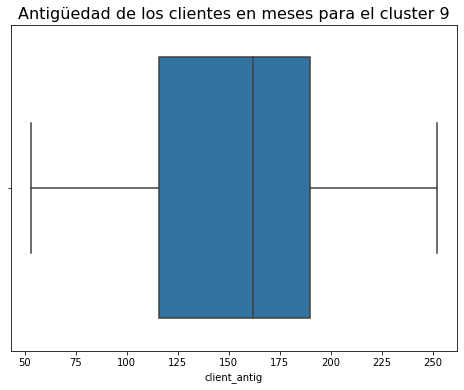

In [136]:
plt.figure(figsize=(8, 6))
sns.boxplot(data=df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 9], x='client_antig').set_title('Antigüedad de los clientes en meses para el cluster 9', fontsize=16)
plt.show()

Conclusiones:
- Sin datos con respecto a  la profesión y a su nivel de estudio.
- La mayoría de ellos están comprendidos en el rango etario de 20 a 40 años.
- En su mayoría solteros. 
- En su mayoría sin datos respecto al estado de su vivienda.
- Se encuentran residiendo en la región pampeana.
- Consumen Plan Largo, Visa, Mensaje de texto a celulares. 
- Su consumo medio para el periodo es de 50 mil pesos.
- La antigüedad en la tarjeta va entre los 7 y 13 meses en su mayoría.

##### Cluster 15

In [137]:
df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 15].shape

(30, 52)

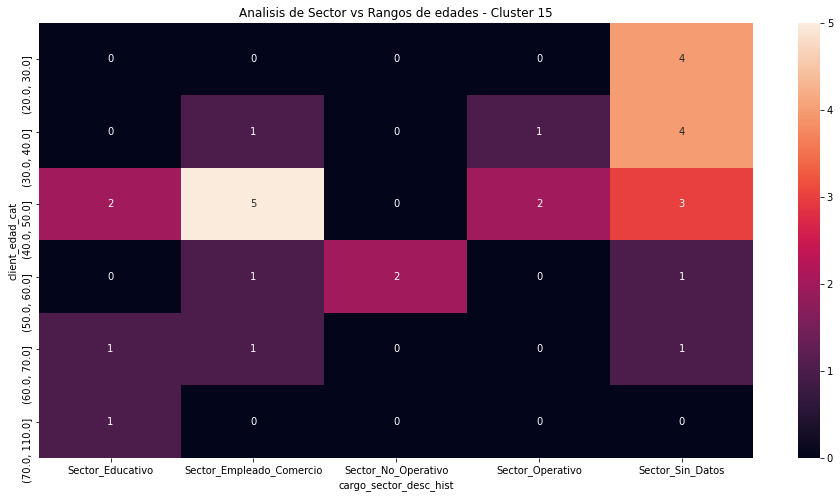

In [138]:
#cluster 4
fig, ax = plt.subplots(figsize=(16,8))
exp = pd.crosstab(df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 15].client_edad_cat, 
                  df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 15].cargo_sector_desc_hist)
plt.title('Analisis de Sector vs Rangos de edades - Cluster 15')
sns.heatmap(exp, annot=True, fmt='g')
plt.show()

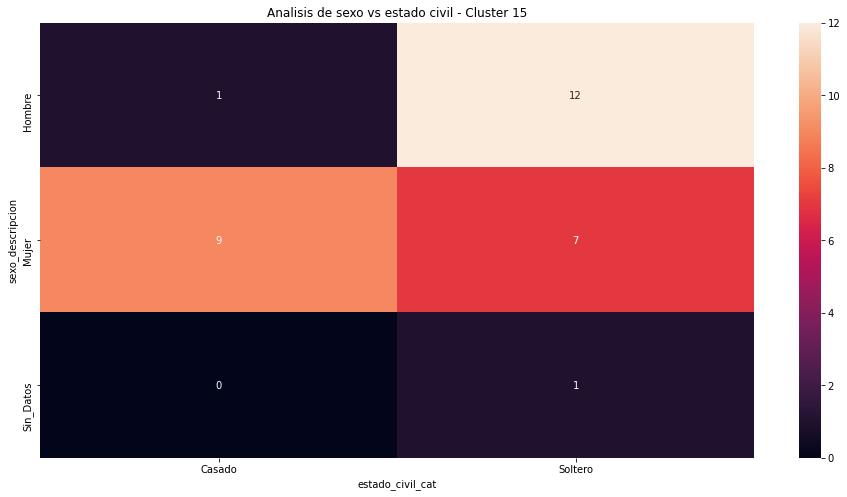

In [139]:
fig, ax = plt.subplots(figsize=(16,8))
exp = pd.crosstab(df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 15].sexo_descripcion, 
                  df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 15].estado_civil_cat)
sns.heatmap(exp, annot=True, fmt='g')
plt.title('Analisis de sexo vs estado civil - Cluster 15')
plt.show()

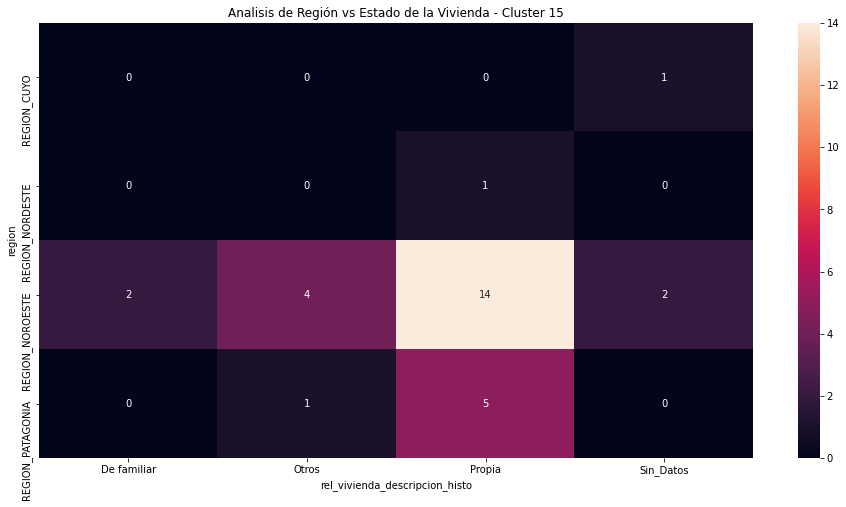

In [140]:
fig, ax = plt.subplots(figsize=(16,8))
exp = pd.crosstab(df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 15].region, 
                  df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 15].rel_vivienda_descripcion_histo)
sns.heatmap(exp, annot=True, fmt='g')
plt.title('Analisis de Región vs Estado de la Vivienda - Cluster 15')
plt.show()

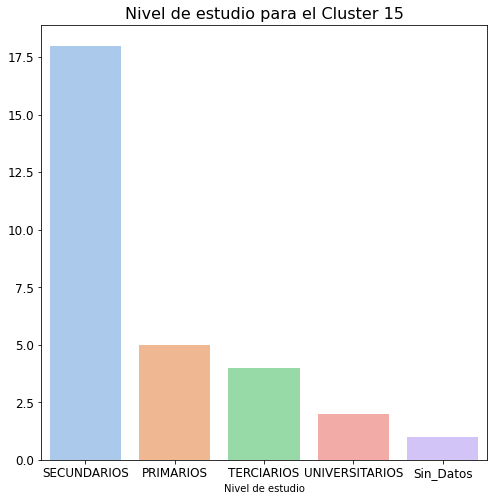

In [141]:
fig, ax = plt.subplots(figsize=(8,8))
sns.countplot(x=df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 15].nivel_estudio_descripcion_histo, palette="pastel",
             order=df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 15].nivel_estudio_descripcion_histo.value_counts().index)
ax.tick_params(labelsize=12)
plt.title('Nivel de estudio para el Cluster 15',fontsize=16)
ax.set_xlabel("Nivel de estudio")
ax.set_ylabel("")
plt.show()

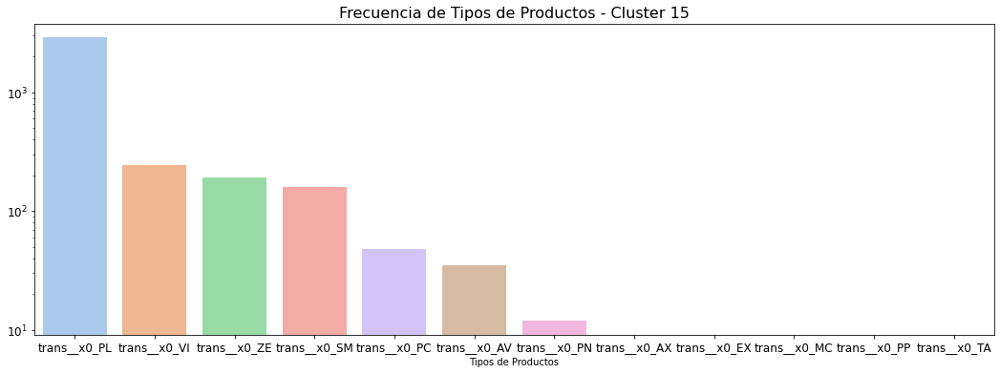

In [142]:
cols = [x for x in df_analisis_dni.columns.values if 'trans__x0' in x]
df_tp_prod = df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 15][cols].sum().to_frame().reset_index()
df_tp_prod.rename(columns={0: 'frecuencia', 'index': 'tipo_prod'}, inplace=True)
df_tp_prod = df_tp_prod.sort_values(by='frecuencia',ascending=False)

fig, ax = plt.subplots(figsize=(18,6))
g=sns.barplot(x=df_tp_prod.tipo_prod, 
              y=df_tp_prod.frecuencia, 
              palette="pastel")
ax.set_yscale("log")
ax.tick_params(labelsize=12)
ax.set_xlabel("Tipos de Productos")
ax.set_ylabel("")
ax.set_title('Frecuencia de Tipos de Productos - Cluster 15', fontsize=16)
plt.show()

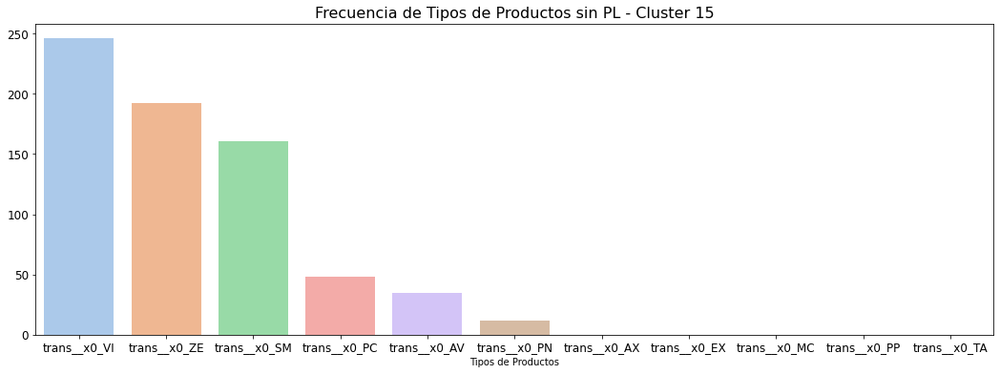

In [143]:
cols = [x for x in df_analisis_dni.columns.values if ('trans__x0' in x) and ('PL' not in x)]
df_tp_prod = df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 15][cols].sum().to_frame().reset_index()
df_tp_prod.rename(columns={0: 'frecuencia', 'index': 'tipo_prod'}, inplace=True)
df_tp_prod = df_tp_prod.sort_values(by='frecuencia',ascending=False)

fig, ax = plt.subplots(figsize=(18,6))
g=sns.barplot(x=df_tp_prod.tipo_prod, 
              y=df_tp_prod.frecuencia, 
              palette="pastel")
#ax.set_yscale("log")
ax.tick_params(labelsize=12)
ax.set_xlabel("Tipos de Productos")
ax.set_ylabel("")
ax.set_title('Frecuencia de Tipos de Productos sin PL - Cluster 15', fontsize=16)
plt.show()

In [144]:
df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 15]['monto_ajustado'].describe()

count        30.000000
mean     251490.284667
std      146423.470534
min       33024.280000
25%      160614.037500
50%      200512.140000
75%      301616.192500
max      616263.780000
Name: monto_ajustado, dtype: float64

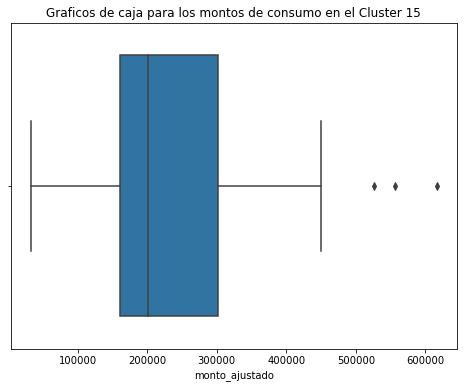

In [145]:
plt.figure(figsize=(8, 6))
sns.boxplot(data=df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 15], x='monto_ajustado')
plt.title("Graficos de caja para los montos de consumo en el Cluster 15")
plt.show()

In [146]:
df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 15].client_antig.describe()

count     30.000000
mean     126.866667
std       74.814591
min        6.000000
25%       71.500000
50%      113.000000
75%      181.250000
max      267.000000
Name: client_antig, dtype: float64

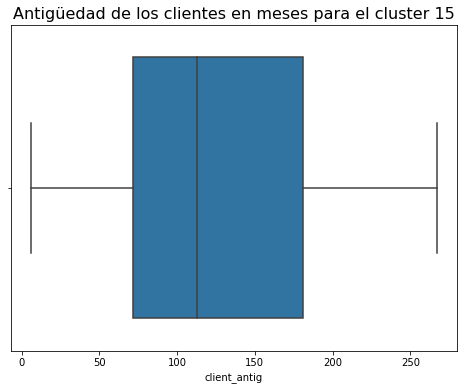

In [147]:
plt.figure(figsize=(8,6 ))
sns.boxplot(data=df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 15], x='client_antig').set_title('Antigüedad de los clientes en meses para el cluster 15', fontsize=16)
plt.show()

Conclusiones:
- Es un grupo conformardo con solo 20 clientes.
- No poseemos datos respecto al sector en el que trabajan.
- El rango etario va desde entre los 20 a 50 años de edad.
- Mas mujeres que hombres, en su mayoría solteros.
- En su mayoría con vivienda propia, viven en la región pampeana y noroeste.
- Con secundario y primario completos.
- Consumen Plan Largo, y Mensaje texto a celulares en su mayoría,
- Tienen un consumo medio de 68 mil para todo el período. 
- La antigüedad en la tarjeta es de entre 22 a 98 meses.


##### Cluster 18

In [148]:
df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 18].shape

(48, 52)

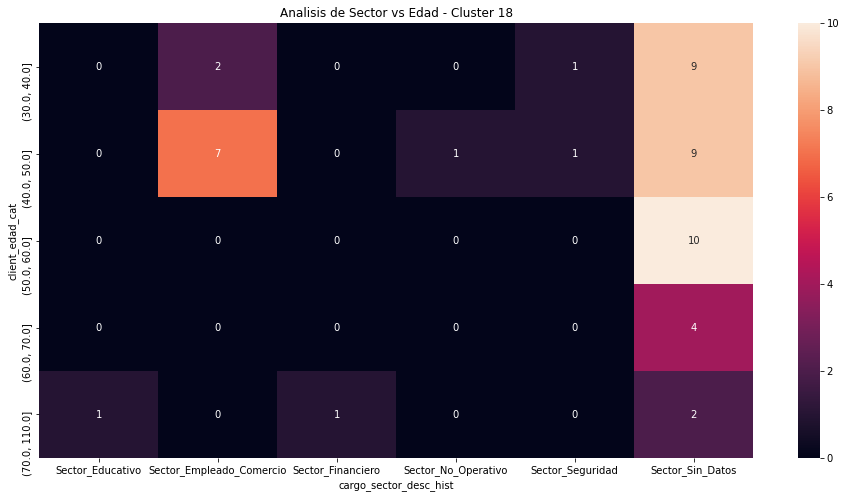

In [149]:
fig, ax = plt.subplots(figsize=(16,8))
exp = pd.crosstab(df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 18].client_edad_cat, 
                  df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 18].cargo_sector_desc_hist)
sns.heatmap(exp, annot=True, fmt='g')
plt.title('Analisis de Sector vs Edad - Cluster 18')
plt.show()

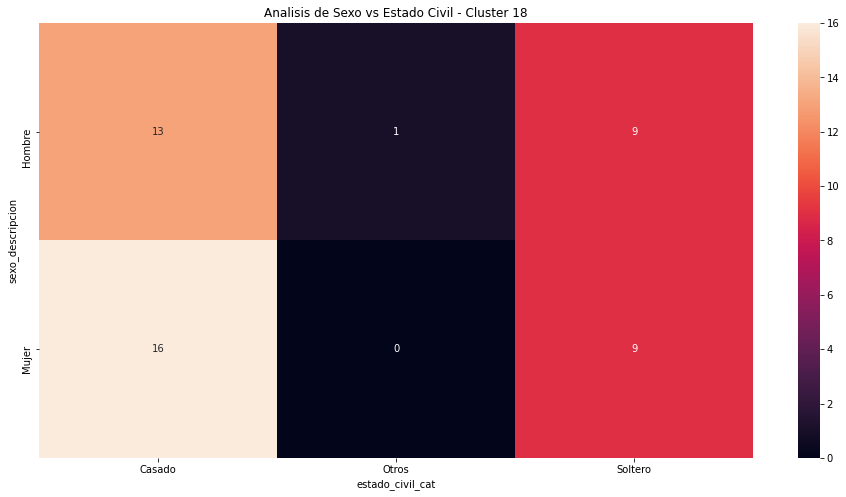

In [150]:
fig, ax = plt.subplots(figsize=(16,8))
exp = pd.crosstab(df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 18].sexo_descripcion, 
                  df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 18].estado_civil_cat)
sns.heatmap(exp, annot=True, fmt='g')
plt.title('Analisis de Sexo vs Estado Civil - Cluster 18')
plt.show()

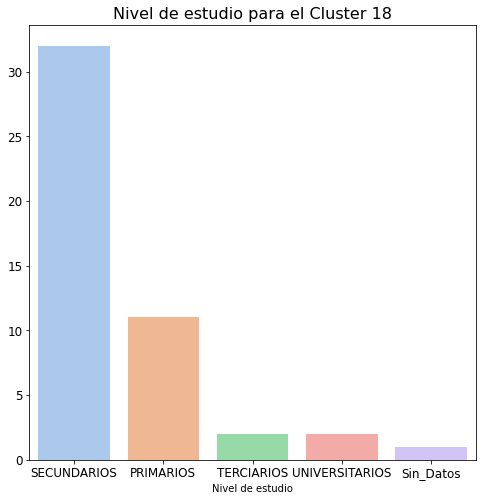

In [151]:
fig, ax = plt.subplots(figsize=(8,8))
sns.countplot(x=df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 18].nivel_estudio_descripcion_histo, palette="pastel",
             order=df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 18].nivel_estudio_descripcion_histo.value_counts().index)
ax.tick_params(labelsize=12)
plt.title('Nivel de estudio para el Cluster 18',fontsize=16)
ax.set_xlabel("Nivel de estudio")
ax.set_ylabel("")
plt.show()

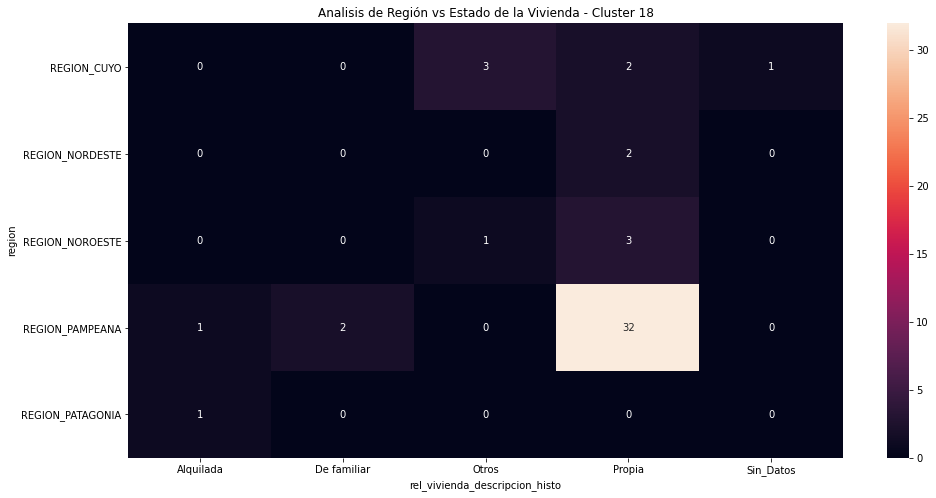

In [152]:
fig, ax = plt.subplots(figsize=(16,8))
exp = pd.crosstab(df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 18].region, 
                  df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 18].rel_vivienda_descripcion_histo)
sns.heatmap(exp, annot=True, fmt='g')
plt.title('Analisis de Región vs Estado de la Vivienda - Cluster 18')
plt.show()

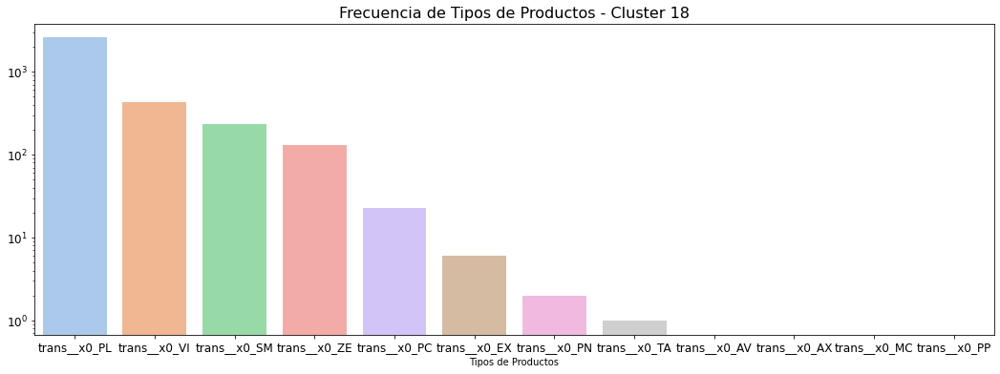

In [153]:
cols = [x for x in df_analisis_dni.columns.values if 'trans__x0' in x]
df_tp_prod = df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 18][cols].sum().to_frame().reset_index()
df_tp_prod.rename(columns={0: 'frecuencia', 'index': 'tipo_prod'}, inplace=True)
df_tp_prod = df_tp_prod.sort_values(by='frecuencia',ascending=False)

fig, ax = plt.subplots(figsize=(18,6))
g=sns.barplot(x=df_tp_prod.tipo_prod, 
              y=df_tp_prod.frecuencia, 
              palette="pastel")
ax.set_yscale("log")
ax.tick_params(labelsize=12)
ax.set_xlabel("Tipos de Productos")
ax.set_ylabel("")
ax.set_title('Frecuencia de Tipos de Productos - Cluster 18', fontsize=16)
plt.show()

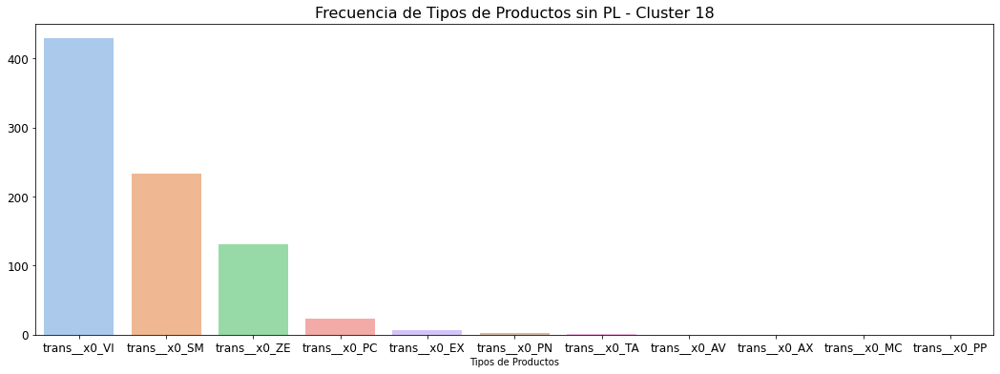

In [154]:
cols = [x for x in df_analisis_dni.columns.values if ('trans__x0' in x) and ('PL' not in x)]
df_tp_prod = df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 18][cols].sum().to_frame().reset_index()
df_tp_prod.rename(columns={0: 'frecuencia', 'index': 'tipo_prod'}, inplace=True)
df_tp_prod = df_tp_prod.sort_values(by='frecuencia',ascending=False)

fig, ax = plt.subplots(figsize=(18,6))
g=sns.barplot(x=df_tp_prod.tipo_prod, 
              y=df_tp_prod.frecuencia, 
              palette="pastel")
#ax.set_yscale("log")
ax.tick_params(labelsize=12)
ax.set_xlabel("Tipos de Productos")
ax.set_ylabel("")
ax.set_title('Frecuencia de Tipos de Productos sin PL - Cluster 18', fontsize=16)
plt.show()

In [155]:
df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 18]['monto_ajustado'].describe()

count        48.000000
mean      89235.027500
std       67122.485623
min        3736.110000
25%       30764.460000
50%       66817.340000
75%      141804.485000
max      265133.050000
Name: monto_ajustado, dtype: float64

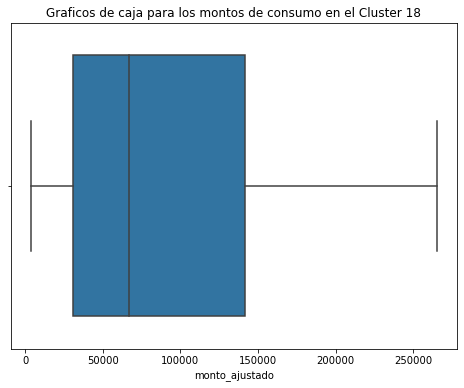

In [156]:
plt.figure(figsize=(8, 6))
sns.boxplot(data=df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 18], x='monto_ajustado')
plt.title("Graficos de caja para los montos de consumo en el Cluster 18")
plt.show()

In [157]:
df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 18].client_antig.describe()

count     48.000000
mean      84.312500
std       59.284441
min        6.000000
25%       42.500000
50%       69.500000
75%      114.250000
max      289.000000
Name: client_antig, dtype: float64

<function matplotlib.pyplot.show(close=None, block=None)>

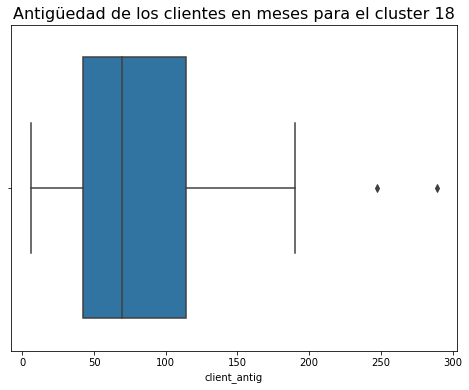

In [158]:
df_analisis_tsne = df_analisis_tsne.sort_values(by=["Mes"], ascending=True)
df_analisis_tsne['Mes'] = df_analisis_tsne['Mes'].astype(str)
plt.figure(figsize=(8, 6))
sns.boxplot(data=df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 18], x='client_antig').set_title('Antigüedad de los clientes en meses para el cluster 18', fontsize=16)
plt.show

Conclusiones:
- Encontramos pocos casos en este grupo, son solo 12.
- Estan repartidos en todos los rangos etarios. 
- La cantidad de hombres duplica a las mujeres, en su mayoría están casados.
- Igual proporción de personas con secundario y primario completos.
- Poseen en su mayoría Vivienda propia y viven en la región pampeana.
- Consumen Plan Largo, Visa, Mensaje de texto a celulares princiapalmente.  
- EL consumo total medio para este periodo es de 160 mil pesos.
- La antigüedad promedio en la tarjeta es de entre 138 y 196 meses. 

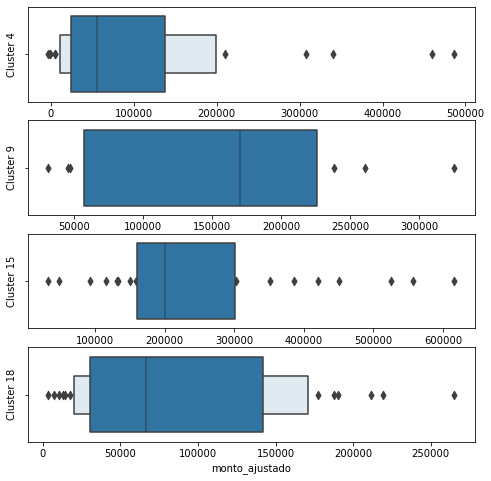

In [159]:
fig, axes = plt.subplots(4, figsize=(8,8))

sns.boxenplot(ax=axes[0], data=df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 4], x='monto_ajustado').set_ylabel("Cluster 4")
sns.boxenplot(ax=axes[1], data=df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 9], x='monto_ajustado').set_ylabel("Cluster 9")
sns.boxenplot(ax=axes[2], data=df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 15], x='monto_ajustado').set_ylabel("Cluster 15")
sns.boxenplot(ax=axes[3], data=df_analisis_dni[df_analisis_dni['cluster_dni_kmeans'] == 18], x='monto_ajustado').set_ylabel("Cluster 18")

for ax in axes:
  ax.tick_params(axis='y', rotation=90)

### HDBScan Clustering

Algoritmo de clustering jerarquico que extiende a DBScan. Selecciona clusters basandose en la separacion entre areas de densidad alta y de densidad baja. A diferencia de K-means, no busca clusters de forma convexa unicamente.

Mas info: 
- https://hdbscan.readthedocs.io/en/latest/how_hdbscan_works.html
- https://scikit-learn.org/stable/modules/clustering.html#dbscan
- https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html

#### Parametros del modelo


los parametros _min_samples_ y _eps_ definen la densidad en areas de puntos

*"More formally, we define a core sample as being a sample in the dataset such that there exist min_samples other samples within a distance of eps, which are defined as neighbors of the core sample. [...] Any core sample is part of a cluster, by definition. Any sample that is not a core sample, and is at least eps in distance from any core sample, is considered an outlier by the algorithm."*

- *min_samples*: The simplest intuition for what min_samples does is provide a measure of how conservative you want you clustering to be. The larger the value of min_samples you provide, the more conservative the clustering – more points will be declared as noise, and clusters will be restricted to progressively more dense areas.
- *eps*: El metodo para elegir eps es heuristico. Se puede hacer un analisis de rodilla para especificar el eps optimo. Aca vamos a hace prueba y error y ver que valores nos dan mejor

#### Metricas a optimizar

- Homogeneity
- Completeness
- V-measure
- Silhouette Coefficient

#### Eleccion del mejor par de parametros (prueba y error)

Vamos a determinar los parametros haciendo algunas pruebas, considerando la cantidad de puntos en el dataset y la separacion de los mismos. Guiandonos por los graficos resultantes, vamos a seleccionar el par que separe mejor los grupos, y que ademas tenga buenas metricas.

In [160]:
# Seteo de parametros

dni = 'dni_titular_movimiento'
target_1 = 'fg_aumentado'
target_2 = 'monto_ajustado'

#features_dbscan = features[(features != dni) & (features != target_1) & (features != target_2)]
features_dbscan = features[(features != dni) & (features != target_2)]
df_escalado_dbscan = df_escalado[features_dbscan].copy()
df_escalado_dbscan.shape
labels_true = df.fg_aumentado

En la celda siguiente se computan los modelos que usamos para probar. Luego los graficamos y ahi podemos visualmente evaluar los clusters encontrados. El rango elegido para los parametros min_samples y eps fue trabajado en base a prueba y error. 

-------------------------------------
eps: 10.000000
min_samples: 80
Estimated number of clusters: 3
Estimated number of noise points: 180
Homogeneity: 0.001
Completeness: 0.005
V-measure: 0.002
Adjusted Rand Index: 0.006
Adjusted Mutual Information: 0.002


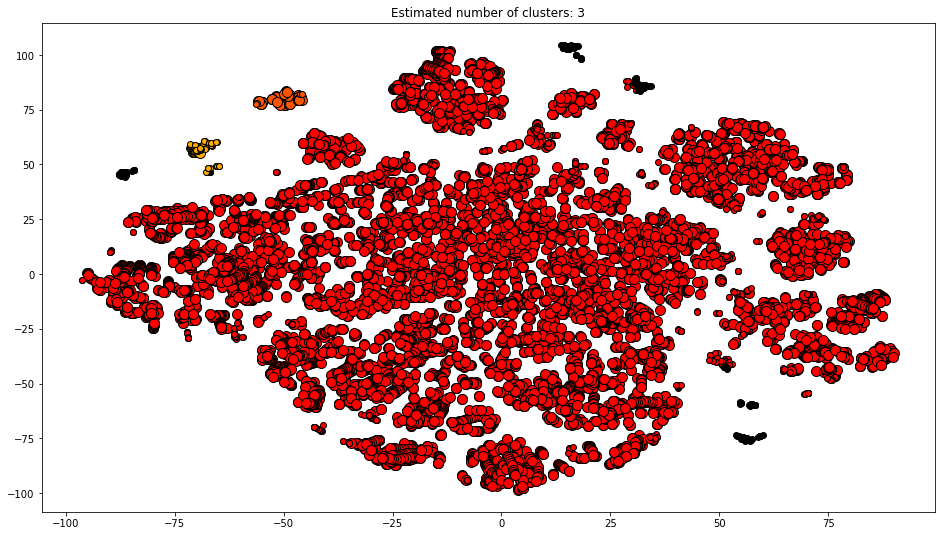

-------------------------------------
eps: 10.000000
min_samples: 100
Estimated number of clusters: 6
Estimated number of noise points: 509
Homogeneity: 0.032
Completeness: 0.019
V-measure: 0.024
Adjusted Rand Index: 0.045
Adjusted Mutual Information: 0.023


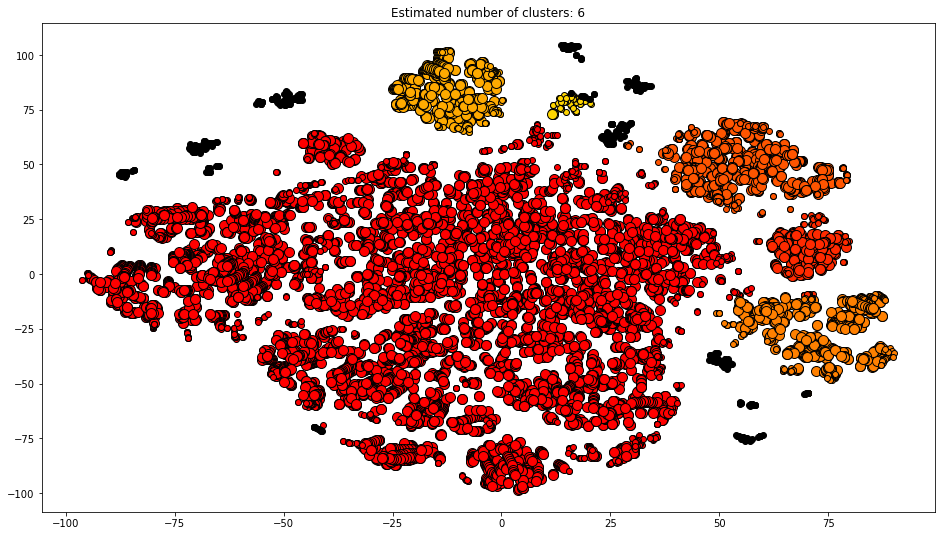

-------------------------------------
eps: 10.000000
min_samples: 120
Estimated number of clusters: 6
Estimated number of noise points: 757
Homogeneity: 0.034
Completeness: 0.019
V-measure: 0.024
Adjusted Rand Index: 0.054
Adjusted Mutual Information: 0.024


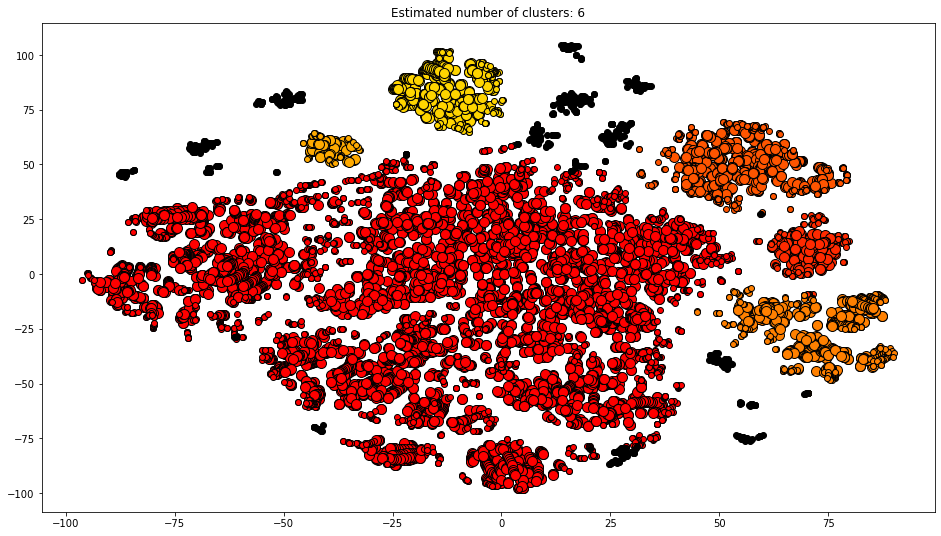

-------------------------------------
eps: 10.000000
min_samples: 140
Estimated number of clusters: 9
Estimated number of noise points: 1067
Homogeneity: 0.083
Completeness: 0.027
V-measure: 0.040
Adjusted Rand Index: -0.006
Adjusted Mutual Information: 0.040


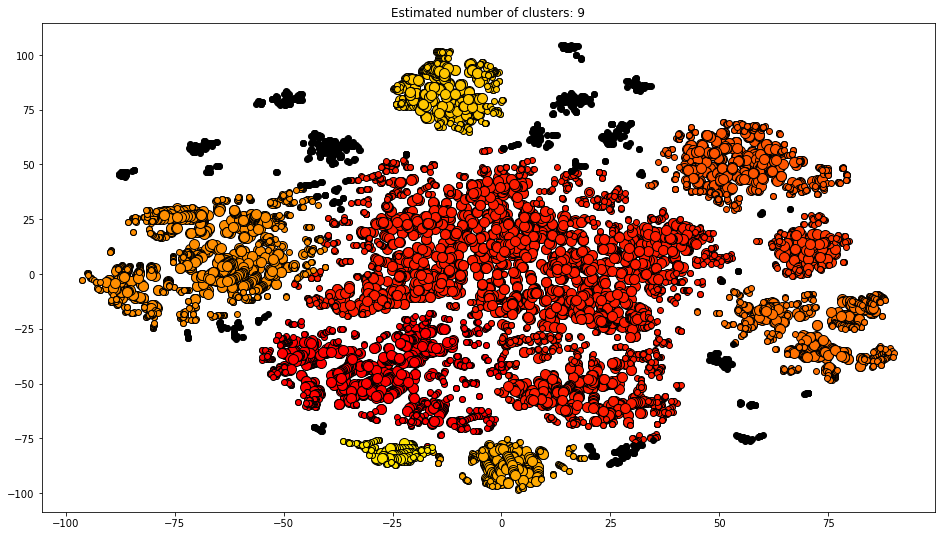

-------------------------------------
eps: 10.000000
min_samples: 160
Estimated number of clusters: 12
Estimated number of noise points: 1679
Homogeneity: 0.108
Completeness: 0.030
V-measure: 0.047
Adjusted Rand Index: -0.005
Adjusted Mutual Information: 0.047


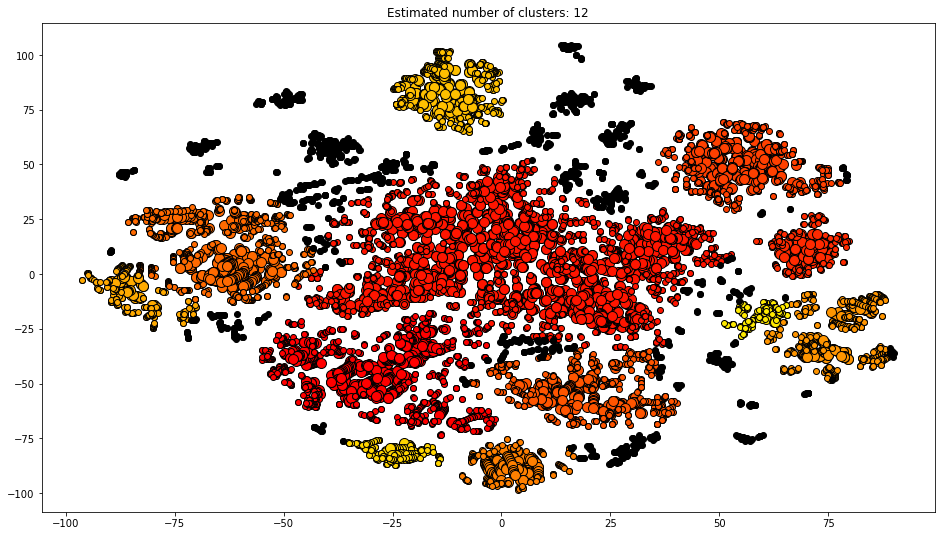

-------------------------------------
eps: 10.000000
min_samples: 180
Estimated number of clusters: 13
Estimated number of noise points: 2767
Homogeneity: 0.106
Completeness: 0.030
V-measure: 0.047
Adjusted Rand Index: -0.015
Adjusted Mutual Information: 0.047


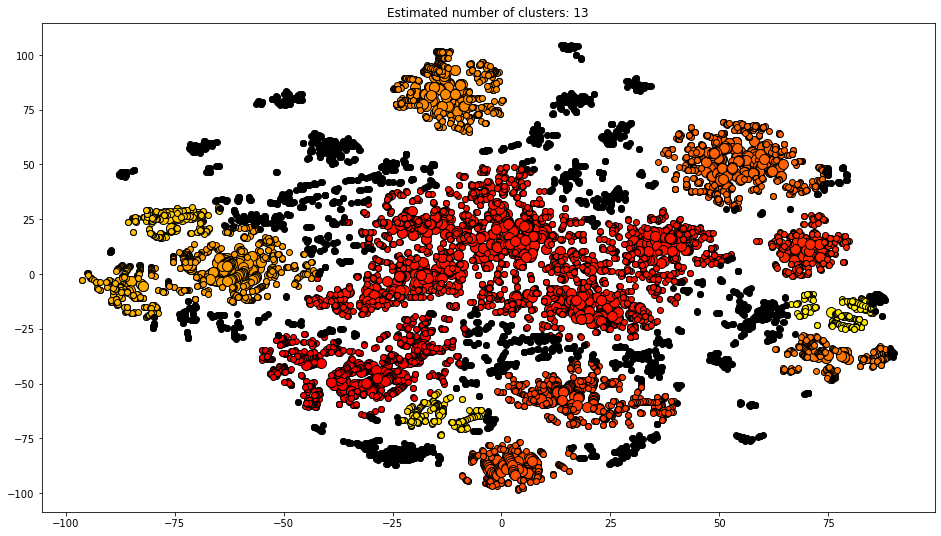

-------------------------------------
eps: 10.000000
min_samples: 200
Estimated number of clusters: 12
Estimated number of noise points: 5270
Homogeneity: 0.071
Completeness: 0.023
V-measure: 0.035
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.035


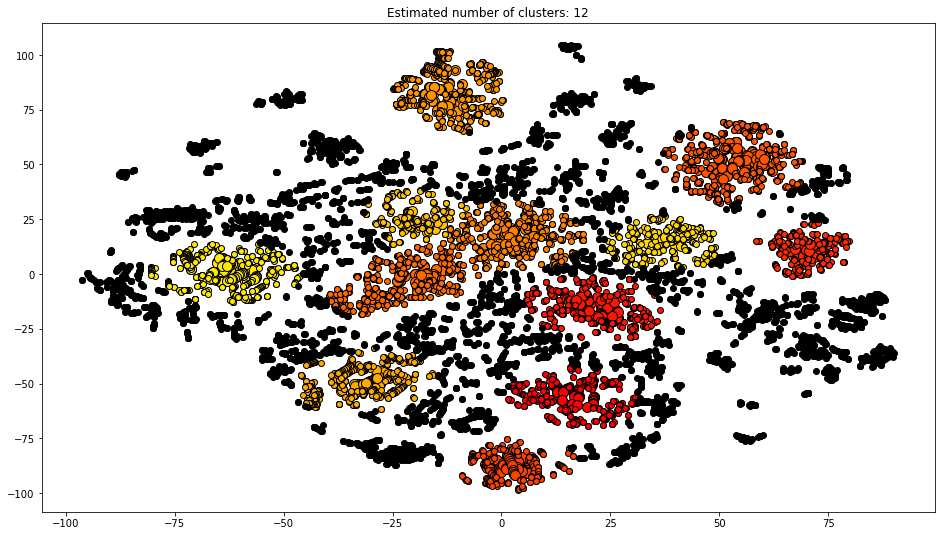

-------------------------------------
eps: 11.000000
min_samples: 80
Estimated number of clusters: 3
Estimated number of noise points: 163
Homogeneity: 0.001
Completeness: 0.004
V-measure: 0.002
Adjusted Rand Index: 0.004
Adjusted Mutual Information: 0.001


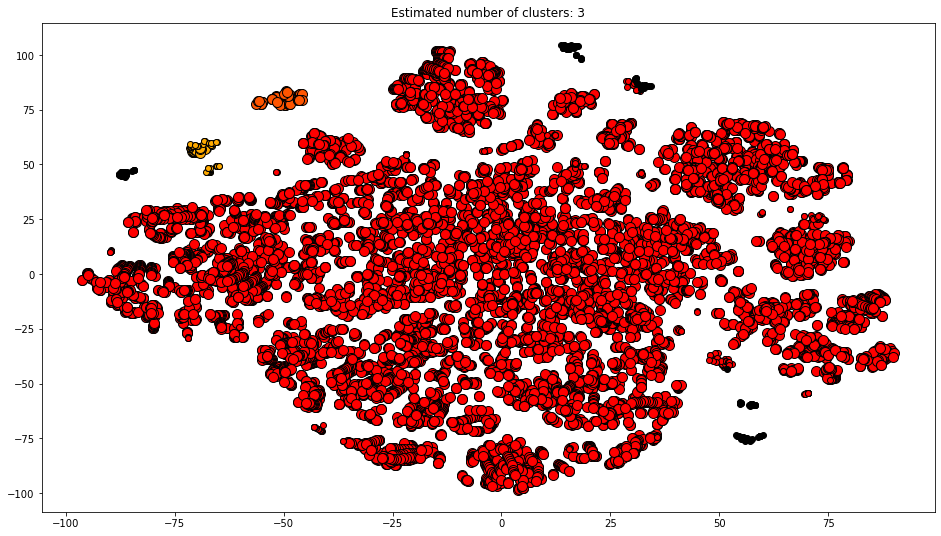

-------------------------------------
eps: 11.000000
min_samples: 100
Estimated number of clusters: 4
Estimated number of noise points: 376
Homogeneity: 0.015
Completeness: 0.014
V-measure: 0.015
Adjusted Rand Index: 0.044
Adjusted Mutual Information: 0.014


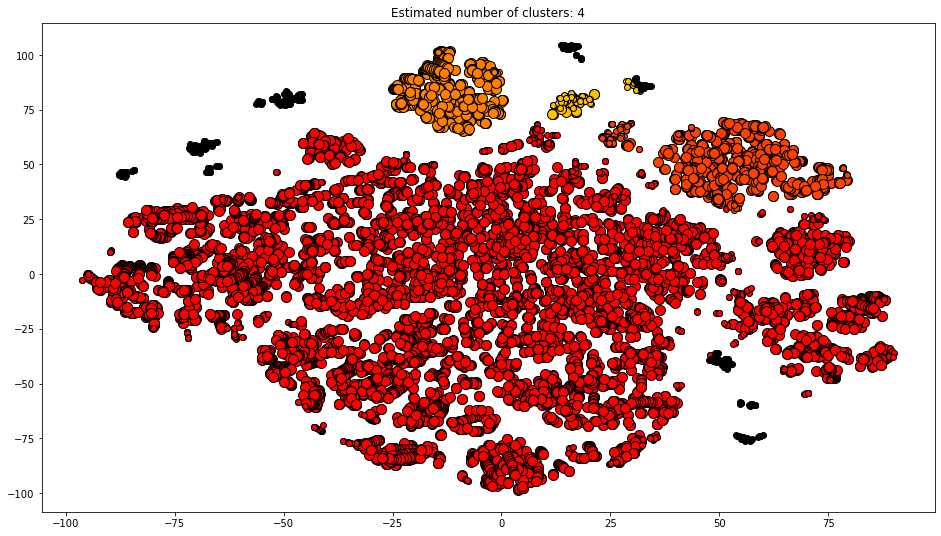

-------------------------------------
eps: 11.000000
min_samples: 120
Estimated number of clusters: 5
Estimated number of noise points: 482
Homogeneity: 0.016
Completeness: 0.010
V-measure: 0.012
Adjusted Rand Index: 0.045
Adjusted Mutual Information: 0.012


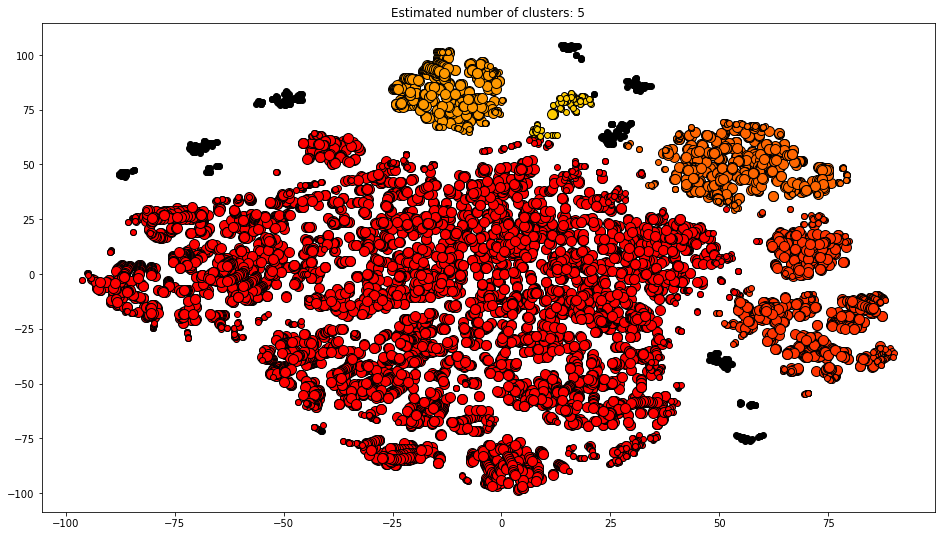

-------------------------------------
eps: 11.000000
min_samples: 140
Estimated number of clusters: 5
Estimated number of noise points: 709
Homogeneity: 0.029
Completeness: 0.017
V-measure: 0.022
Adjusted Rand Index: 0.045
Adjusted Mutual Information: 0.021


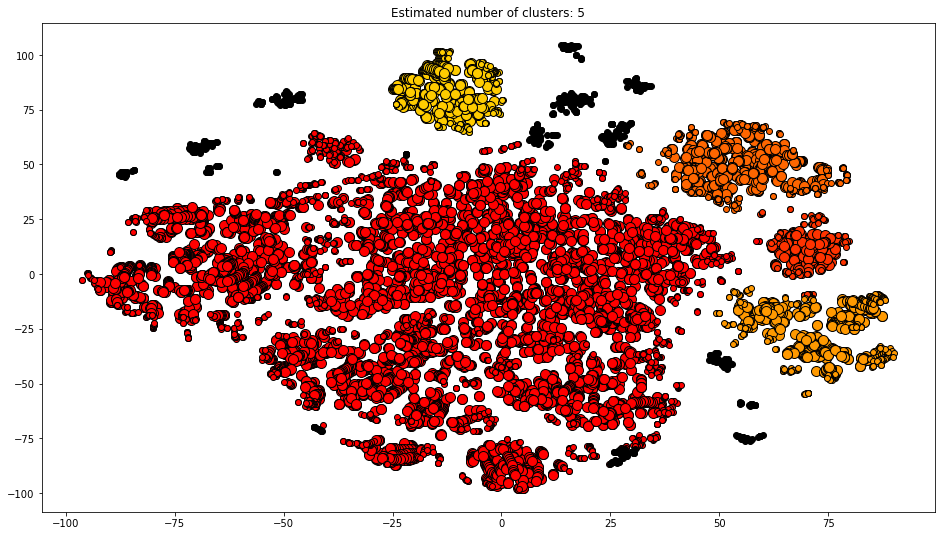

-------------------------------------
eps: 11.000000
min_samples: 160
Estimated number of clusters: 7
Estimated number of noise points: 829
Homogeneity: 0.041
Completeness: 0.020
V-measure: 0.027
Adjusted Rand Index: 0.034
Adjusted Mutual Information: 0.027


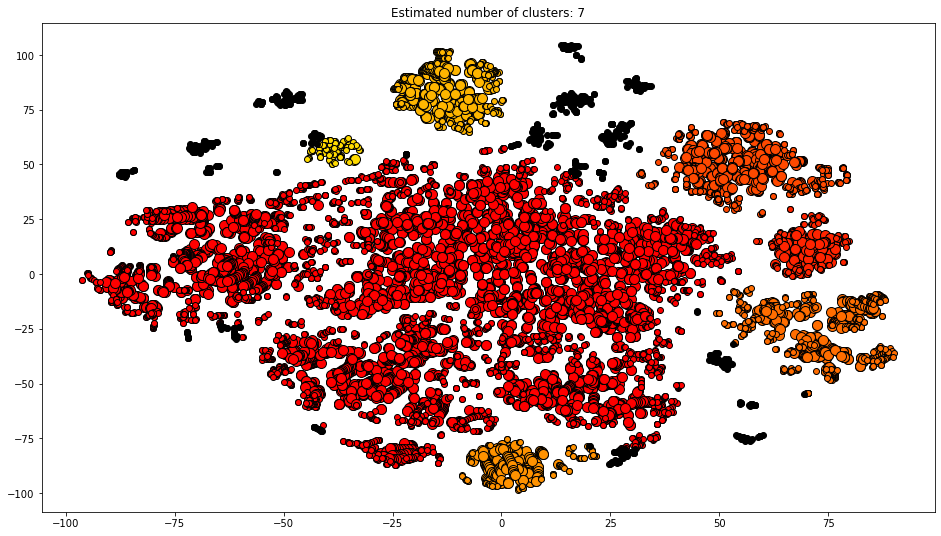

-------------------------------------
eps: 11.000000
min_samples: 180
Estimated number of clusters: 10
Estimated number of noise points: 1332
Homogeneity: 0.107
Completeness: 0.032
V-measure: 0.049
Adjusted Rand Index: -0.001
Adjusted Mutual Information: 0.048


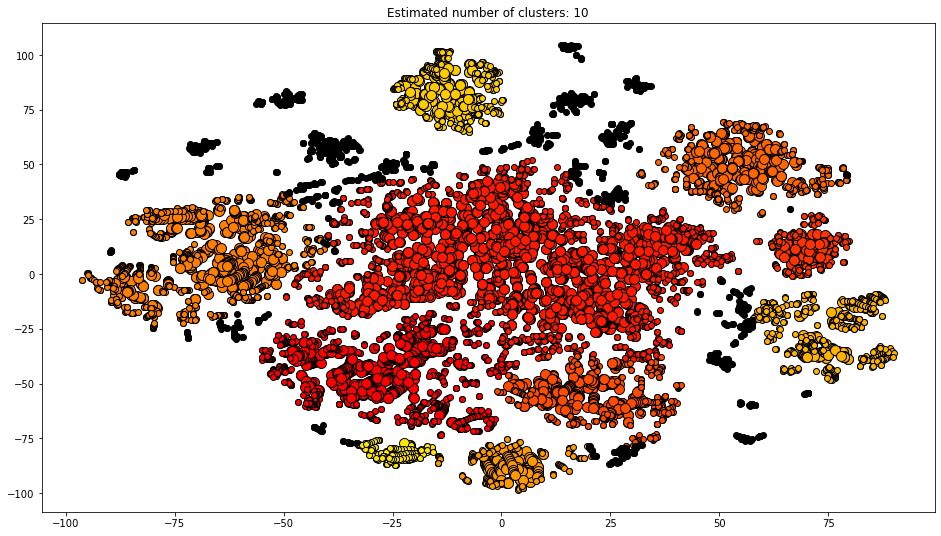

-------------------------------------
eps: 11.000000
min_samples: 200
Estimated number of clusters: 9
Estimated number of noise points: 2403
Homogeneity: 0.091
Completeness: 0.028
V-measure: 0.043
Adjusted Rand Index: -0.004
Adjusted Mutual Information: 0.043


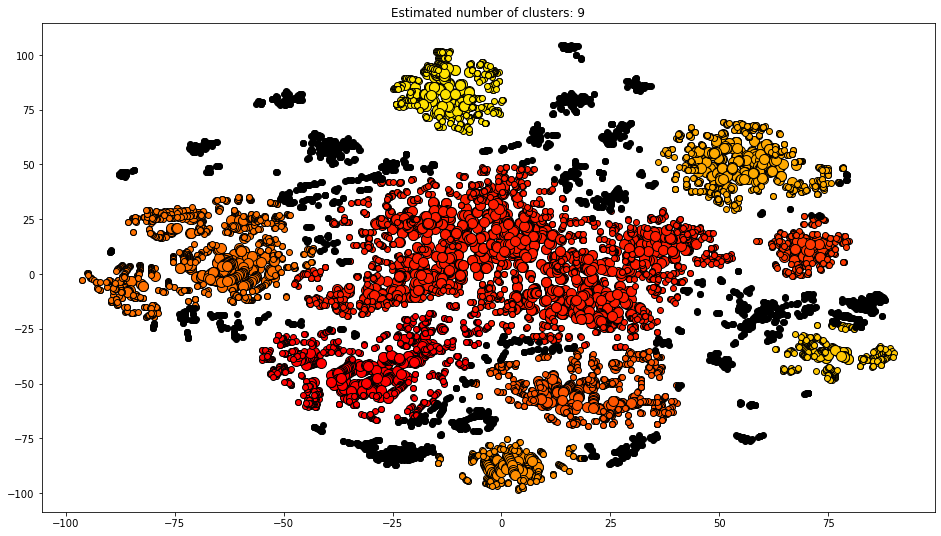

In [161]:
# #############################################################################
#X = df_escalado_dbscan.values
X = X_tsne_all

# Compute DBSCAN
for i_eps in np.arange(10, 12, 1):
    for i_min_samples in np.arange(80, 211, 20):
        db = DBSCAN(eps=i_eps, min_samples=i_min_samples).fit(X)
        core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
        core_samples_mask[db.core_sample_indices_] = True
        labels = db.labels_
        core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
        core_samples_mask[db.core_sample_indices_] = True
        labels = db.labels_

        # Number of clusters in labels, ignoring noise if present.
        n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise_ = list(labels).count(-1)

        print('-------------------------------------')
        print('eps: %f' % i_eps)
        print('min_samples: %d' % i_min_samples)
        print('Estimated number of clusters: %d' % n_clusters_)
        print('Estimated number of noise points: %d' % n_noise_)
        print("Homogeneity: %0.3f" % metrics.homogeneity_score(labels_true, labels))
        print("Completeness: %0.3f" % metrics.completeness_score(labels_true, labels))
        print("V-measure: %0.3f" % metrics.v_measure_score(labels_true, labels))
        print("Adjusted Rand Index: %0.3f"
              % metrics.adjusted_rand_score(labels_true, labels))
        print("Adjusted Mutual Information: %0.3f"
              % metrics.adjusted_mutual_info_score(labels_true, labels,
                                                   average_method='arithmetic'))

        # Black removed and is used for noise instead.
        unique_labels = set(labels)
        colors = [plt.cm.autumn(each)
                  for each in np.linspace(0, 1, len(unique_labels))]

        fig = plt.figure(figsize=(16, 9))


        for k, col in zip(unique_labels, colors):
            if k == -1:
                # Black used for noise.
                col = [0, 0, 0, 1]

            class_member_mask = (labels == k)

            xy = X_tsne_all[class_member_mask & core_samples_mask]
            plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                     markeredgecolor='k', markersize=10)

            xy = X_tsne_all[class_member_mask & ~core_samples_mask]
            plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                     markeredgecolor='k', markersize=6)

        plt.title('Estimated number of clusters: %d' % n_clusters_)
        plt.show()
     #   print("Silhouette Coefficient: %0.3f"
     #         % metrics.silhouette_score(X, labels))

In [162]:
# Seteo de parametros
eps=11
min_samples=180

dni = 'dni_titular_movimiento'

#features_dbscan = features[(features != dni) & (features != target_1) & (features != target_2)]
features_dbscan = features[(features != dni) & (features != target_2)]
df_escalado_dbscan = df_escalado[features_dbscan].copy()
df_escalado_dbscan.shape
labels_true = df.fg_aumentado

-------------------------------------
eps: 11.000000
min_samples: 180
Estimated number of clusters: 10
Estimated number of noise points: 1332
Homogeneity: 0.107
Completeness: 0.032
V-measure: 0.049
Adjusted Rand Index: -0.001
Adjusted Mutual Information: 0.048


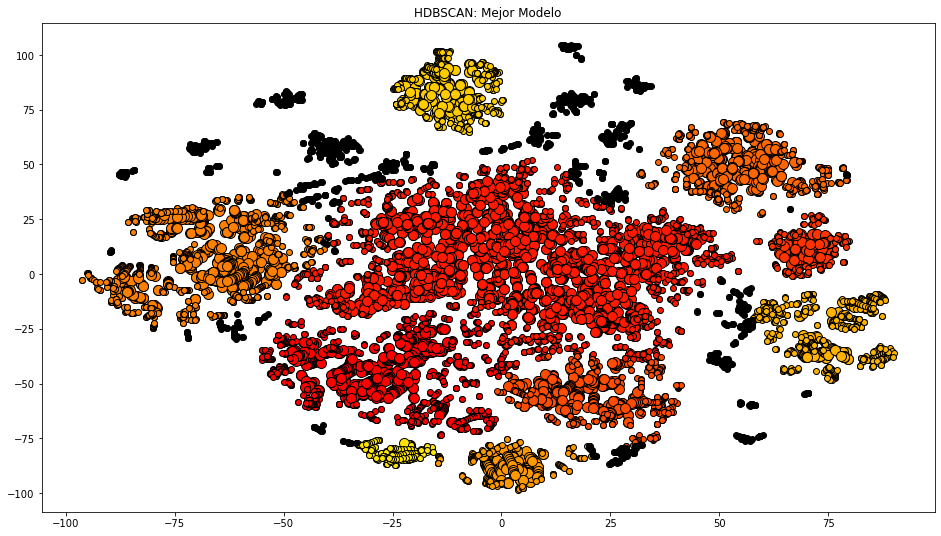

In [163]:
# #############################################################################
#X = df_escalado_dbscan.values
X = X_tsne_all

# Compute DBSCAN
db = DBSCAN(eps=eps, min_samples=min_samples).fit(X)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('-------------------------------------')
print('eps: %f' % eps)
print('min_samples: %d' % min_samples)
print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(labels_true, labels))
print("Completeness: %0.3f" % metrics.completeness_score(labels_true, labels))
print("V-measure: %0.3f" % metrics.v_measure_score(labels_true, labels))
print("Adjusted Rand Index: %0.3f"
      % metrics.adjusted_rand_score(labels_true, labels))
print("Adjusted Mutual Information: %0.3f"
      % metrics.adjusted_mutual_info_score(labels_true, labels,
                                           average_method='arithmetic'))

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.autumn(each)
          for each in np.linspace(0, 1, len(unique_labels))]

fig = plt.figure(figsize=(16, 9))


for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X_tsne_all[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=10)

    xy = X_tsne_all[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=6)

plt.title('HDBSCAN: Mejor Modelo')
plt.show()
#   print("Silhouette Coefficient: %0.3f"
#         % metrics.silhouette_score(X, labels))

#### Guardado de etiquetas

In [164]:
df_clusters['cluster_hdbscan'] = labels #clusters
clusters = labels

In [165]:
df_clusters.cluster_hdbscan.value_counts()

 1    3097
-1    1332
 0    1225
 5    1190
 4     746
 3     643
 7     588
 8     512
 6     345
 2     289
 9     161
Name: cluster_hdbscan, dtype: int64

#### Análisis

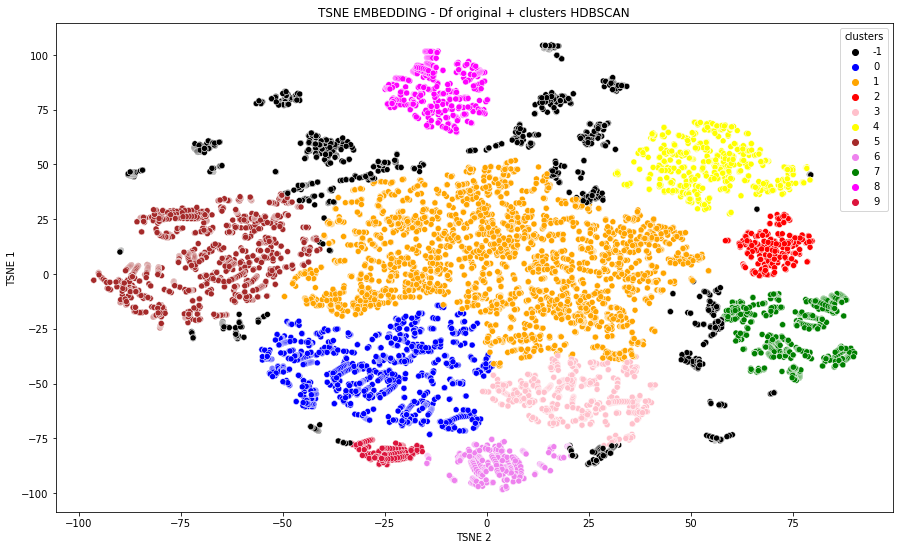

In [166]:
dff = pd.DataFrame({'0':X_tsne_all[:,0], '1':X_tsne_all[:,1], 'clusters':clusters})

plt.figure(figsize=(15, 9))
plt.ylabel('TSNE 1')
plt.xlabel('TSNE 2')
plt.title('TSNE EMBEDDING - Df original + clusters HDBSCAN')
data = dff[dff.clusters.isin([-1,0,1,2,3,4,5,6,7,8,9])]
colors = ['black', 'blue', 'orange', 'red','pink','yellow','brown', 'violet', 'green', 'magenta', 'crimson']

sns.scatterplot(data = data, x='0', y='1', palette=colors, hue='clusters')
plt.show()

In [169]:
# Creacion de dataset de analisis
df_clientes = pd.read_parquet('datos_clientes.parquet')
df_analisis_hbscan = df_clientes.merge(df_clusters, on='dni_titular_movimiento', validate='1:m')
df_analisis_hbscan = df_analisis_hbscan.rename(columns={'o_mes': 'Mes'})
df_analisis_hbscan = df_analisis_hbscan.sort_values('Mes')

,dni_titular_movimiento,sexo_descripcion,cargo_sector_desc_hist,estado_civil_cat,region,nivel_estudio_descripcion_histo,rel_vivienda_descripcion_histo,client_edad_cat,client_antig,trans__x0_AV,...,mean_sexo,mean_est_civil,mean_reg,mean_nivel_estud,mean_est_viv,mean_edad,geodist_cp,cluster_hdbscan,cluster_pca_kmeans,cluster_tsne_kmeans
0,0001686b52949b5461ffcbc766687e45031,Hombre,Sector_Empleado_Comercio,Otros,REGION_PAMPEANA,SECUNDARIOS,Propia,"(60.0, 70.0]",92.0,0.0,...,3.59,3.62,3.60,3.71,3.75,3.64,639.37,0,4,11
3696,0002f31488e230c8ae5c73ef17f1de66825,Mujer,Sector_Educativo,Soltero,REGION_NORDESTE,TERCIARIOS,Propia,"(40.0, 50.0]",110.0,0.0,...,3.84,3.68,3.81,4.00,3.75,3.79,576.42,0,4,0
3684,000483a5a3f1e24933a7d69833ea7638725,Hombre,Sector_Sin_Datos,Soltero,REGION_CUYO,Sin_Datos,Sin_Datos,"(30.0, 40.0]",0.0,0.0,...,3.59,3.68,3.76,3.09,3.40,3.90,734.94,8,10,15
3672,0007eda2d6f6cc5e480db61bf1c7d3f1207,Hombre,Sector_Sin_Datos,Soltero,REGION_PAMPEANA,SECUNDARIOS,Propia,"(30.0, 40.0]",61.0,0.0,...,3.59,3.68,3.60,3.71,3.75,3.90,636.34,6,4,6
3660,000d3e0bd4bfc5e2bffa4fac50b53ed8685,Hombre,Sector_Sin_Datos,Soltero,REGION_PAMPEANA,SECUNDARIOS,Propia,"(20.0, 30.0]",52.0,0.0,...,3.59,3.68,3.60,3.71,3.75,3.48,854.15,3,4,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6179,00086c0aa751e772d7b9da5965318177321,Mujer,Sector_Sin_Datos,Casado,REGION_NOROESTE,SECUNDARIOS,Otros,"(70.0, 110.0]",136.0,0.0,...,3.84,3.81,3.99,3.71,4.00,3.51,744.87,5,0,3
6167,0008797723b416d532421a71c32b2ae7563,Mujer,Sector_No_Operativo,Otros,REGION_NORDESTE,PRIMARIOS,Propia,"(70.0, 110.0]",220.0,0.0,...,3.84,3.62,3.81,3.79,3.75,3.51,669.25,0,0,0
6155,000e15209d4aca590719f88e5e5b7621187,Mujer,Sector_No_Operativo,Casado,REGION_PAMPEANA,PRIMARIOS,Propia,"(70.0, 110.0]",91.0,0.0,...,3.84,3.81,3.60,3.79,3.75,3.51,0.00,5,0,3
6419,000b26fe9941eea0ea376732e845274f935,Mujer,Sector_Sin_Datos,Soltero,REGION_NOROESTE,SECUNDARIOS,Sin_Datos,"(20.0, 30.0]",48.0,0.0,...,3.84,3.68,3.99,3.71,3.40,3.48,787.67,7,0,10


**Conclusiones:**

El algoritmo de HDBScan Clustering nos permite diferenciar aquellos grupos alejados del centro de puntos, diferenciando aquellos que son outliers. 
Algo que nos llamo la atención, fue que algunos de los grupos encontrados se asemejan a los grupos que detectó el algoritmo de K-means Clustering:
- Cluster 8 coincide con Cluster 13 de K-means.
- Cluster 4 coincide con Cluster 1 de K-means.
- Cluster 2 coincide en casi su totalidad con Cluster 11 de K-means.
- Cluster 7 coincide en casi su totalidad con Cluster 5 de K-means.

Analizando, el comportamiento de consumo del grupo de puntos que son considerados outliers, se observa que la media de consumo todos los meses está de los 20 mil, pero en la mayoría de los meses existen consumos extremos, que llegan hasta los 160 mil.
Se analizaron el resto de las variables, y no se observó una predominancia de ninguna de las categorías, por lo cual no se incluyeron las gráficas de dichas variables.

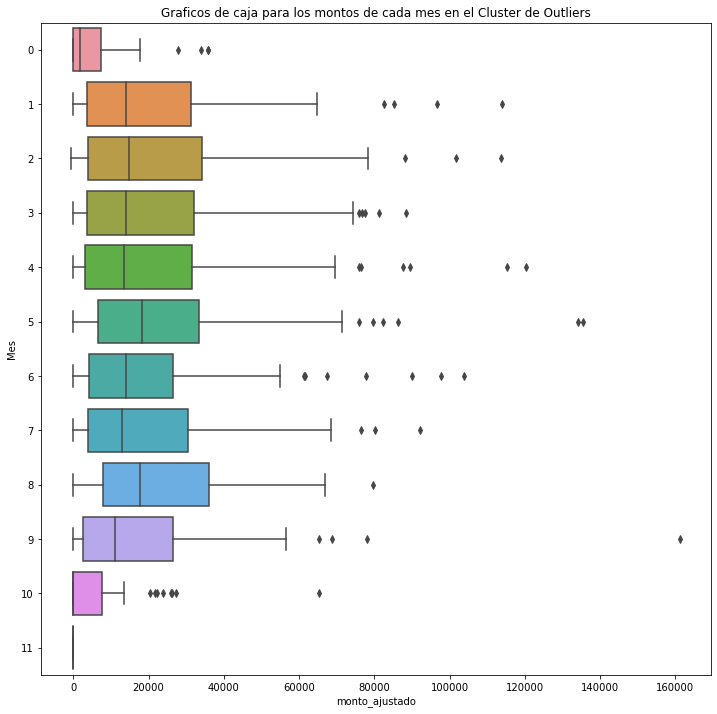

In [171]:
df_analisis_hbscan  = df_analisis_hbscan.sort_values(by=["Mes"], ascending=True)
df_analisis_hbscan ['Mes'] = df_analisis_hbscan['Mes'].astype(str)
plt.figure(figsize=(12, 12))
plt.title("Graficos de caja para los montos de cada mes en el Cluster de Outliers")
sns.boxplot(data=df_analisis_hbscan[df_analisis_hbscan['cluster_hdbscan'] == -1], x='monto_ajustado', y='Mes')
plt.show()

In [187]:
df_analisis_hbscan ['Mes'] = df_analisis_hbscan['Mes'].astype(int)
df_analisis_hbscan[df_analisis_hbscan['cluster_hdbscan'] == -1].groupby('Mes')['monto_ajustado'].describe().sort_values(by=["Mes"], ascending=True)

,count,mean,std,min,25%,50%,75%,max
Mes,,,,,,,,
0,48.0,6012.749583,9612.494868,0.00,0.0000,1759.055,7461.8025,35889.07
1,124.0,20736.030968,21101.491433,-208.43,3507.8450,13999.850,31279.5250,114021.08
2,132.0,22318.232045,22903.230429,-538.38,3863.6450,14682.470,34220.6550,113750.29
3,122.0,21696.532377,22579.395636,-196.93,3589.4425,14074.125,32113.4550,88463.38
4,132.0,21214.169470,23722.738430,-191.81,3144.8450,13369.550,31572.5450,120370.36
5,143.0,23852.329860,23936.915995,-185.76,6471.9900,18234.880,33358.2550,135584.24
6,142.0,19583.319225,20215.106355,-179.95,4228.2850,13924.855,26364.5250,103746.35
7,124.0,18578.027258,18976.518370,-175.13,3799.1225,12819.850,30468.1675,92186.88
8,129.0,22334.605891,18967.714396,-169.10,7956.9600,17755.590,35965.3600,79628.23


### K-Means Clustering para Series Temporales

In [161]:
sns.set_style('darkgrid')

In [162]:
df = pd.read_parquet('cupones_no_supervisado.parquet')

Eliminamos outliers y duplicados tal como se hace en el practico 2

In [156]:
df = df[df['fecha_cupon_movimiento'] > pd.to_datetime('2020-07-01')]
df = df[(df['monto_ajustado'] > -63712) & (df['monto_ajustado'] < 63712)]
df = df[~df.duplicated()]

Para armar los clusters de series temporales solo necesitamos los dnis de los clientes, las fechas, y los montos.

In [89]:
fecha = 'fecha_cupon_movimiento'
dni = 'dni_titular_movimiento'
monto = 'monto_ajustado'

In [90]:
df[[fecha, dni, monto]].copy()

,fecha_cupon_movimiento,dni_titular_movimiento,monto_ajustado
0,2020-08-25,0001686b52949b5461ffcbc766687e45031,5.52
1,2020-08-25,000220fa96ec5af89817894033f8099c547,15.68
2,2020-08-25,0002be202de47dfae9cc2304d91161be595,5.46
3,2020-08-25,000e137d0af42e193be1ff670c00d4d1506,2.50
4,2020-08-25,0009d010e4faf69552a814a33832b185877,2.10
...,...,...,...
124306,2021-05-14,0002716f6d9c2130a8c88a0219de234d459,9661.01
124309,2021-05-14,0001f61dd2845a7e653ebfdaf22dab3b373,20329.24
124311,2021-05-14,0006c15ca823454b68c189da1344d9d7317,13210.67
124312,2021-05-03,0000ab27a0ed815f947df8bcb834ff97975,121.73


Armamos un nuevo dataframe de forma que haya una serie temporal por cada dni, con la suma de sus compras en cada fecha.

In [91]:
dfs = pd.pivot_table(df[[fecha, dni, monto]], values=monto, index=fecha, columns=dni, aggfunc=np.sum, fill_value=0)
dfs

dni_titular_movimiento  000000b5aea2c9ea7cc155f6ebcef97f826  \
fecha_cupon_movimiento                                        
2020-07-03                                              0.0   
2020-07-04                                              0.0   
2020-07-05                                              0.0   
2020-07-06                                              0.0   
2020-07-07                                              0.0   
...                                                     ...   
2021-05-21                                              0.0   
2021-05-22                                              0.0   
2021-05-23                                              0.0   
2021-05-24                                              0.0   
2021-05-25                                              0.0   

dni_titular_movimiento  00000b8415f19846d12e852ebd0d52ec432  \
fecha_cupon_movimiento                                        
2020-07-03                                              0.0   
2020-07-04                                              0.0   
2020-07-05                                              0.0   
2020-07-06                                              0.0   
2020-07-07                                              0.0   
...                                                     ...   
2021-05-21                                              0.0   
2021-05-22                                              0.0   
2021-05-23                                              0.0   
2021-05-24                                              0.0   
2021-05-25                                              0.0   

dni_titular_movimiento  00000d109ca5a0c6b3e76295f0292c38189  \
fecha_cupon_movimiento                                        
2020-07-03                                              0.0   
2020-07-04                                              0.0   
2020-07-05                                              0.0   
2020-07-06                                              0.0   
2020-07-07                                              0.0   
...                                                     ...   
2021-05-21                                              0.0   
2021-05-22                                              0.0   
2021-05-23                                              0.0   
2021-05-24                                              0.0   
2021-05-25                                              0.0   

dni_titular_movimiento  000017309738c042c2ec144d5d3d3632673  \
fecha_cupon_movimiento                                        
2020-07-03                                              0.0   
2020-07-04                                              0.0   
2020-07-05                                              0.0   
2020-07-06                                              0.0   
2020-07-07                                              0.0   
...                                                     ...   
2021-05-21                                              0.0   
2021-05-22                                              0.0   
2021-05-23                                              0.0   
2021-05-24                                              0.0   
2021-05-25                                              0.0   

dni_titular_movimiento  00001b02afa8956b08af05c339039882046  \
fecha_cupon_movimiento                                        
2020-07-03                                              0.0   
2020-07-04                                              0.0   
2020-07-05                                              0.0   
2020-07-06                                              0.0   
2020-07-07                                              0.0   
...                                                     ...   
2021-05-21                                              0.0   
2021-05-22                                              0.0   
2021-05-23                                              0.0   
2021-05-24                 

El dataset usado para el clustering de series temporales comprende 319 dias donde 844 clientes distintos realizaron (o no) compras.

Elegimos algunes clientes al azar para graficar los montos a lo largo del periodo controlado

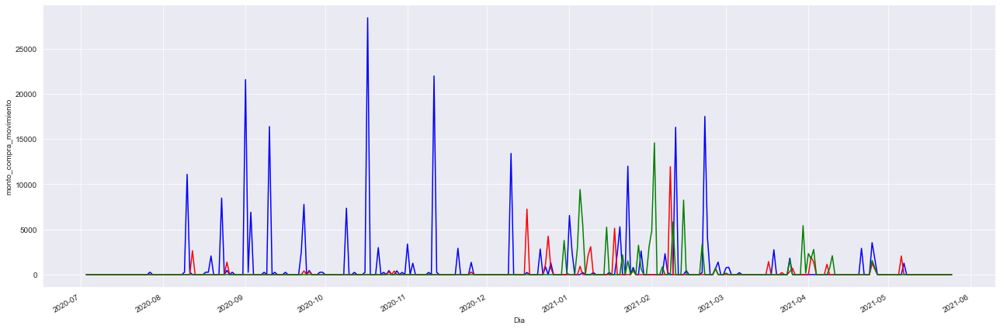

In [141]:
fig = plt.figure(figsize=(18, 6))

ax = plt.subplot(1, 1, 1)
dfs['000ef071e95351afc1149fa1afe4862a079'].plot(color='blue')
dfs['000f0b73ebfa002a79a0642b82e87919904'].plot(color='red')
dfs['000edf1f0ef2ba6fb1c639c4fb82133b037'].plot(color='green')
ax.set_xlabel('Dia')
ax.set_ylabel('monto_compra_movimiento')

plt.tight_layout()
plt.show()

In [99]:
X_train = StandardScaler().fit_transform(dfs)
X_train = X_train.T

#### Calculo de inercia y silhouet optimas

Usando la metrica euclideana el modelo corre mas rapido, asi que vamos a usarla para calcular el numero optimo de clusters usando la incercia y el coeficiente de silueta

In [100]:
inertia = []
silhouet = []
for n in range(2, 15):
    km = TimeSeriesKMeans(n_clusters=n, n_jobs=4, random_state=42, 
                          max_iter=1000, metric='euclidean').fit(X_train) 
                          #  “softdtw” , 'euclidean'
    inertia.append(km.inertia_)
    silhouet.append(silhouette_score(X_train, km.labels_,  metric='euclidean'))

Text(0.5, 1.0, 'Silhouet score versus number of clusters')

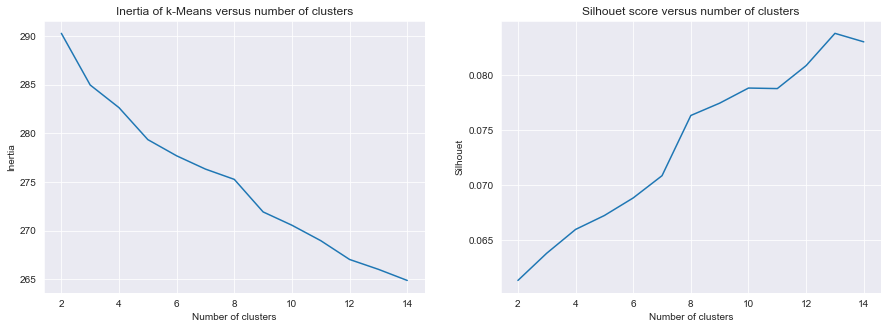

In [142]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(np.arange(2, 15), inertia)
plt.xlabel('Number of clusters')
plt.ylabel("Inertia")
plt.title("Inertia of k-Means versus number of clusters")

plt.subplot(1,2,2)
plt.plot(np.arange(2, 15), silhouet)
plt.xlabel('Number of clusters')
plt.ylabel("Silhouet")
plt.title("Silhouet score versus number of clusters")

##### Distancias utilizadas

- Euclideana: Es la mas rapida de calcular. La usamos para obtener el n_clusters optimo para nuestros datos
- Dynamic Time Warping (DTW): Es una manera de comparar dos secuencias (generalmente series temporales) que no se sinctronizan perfectamente. Se usa para reconocimiento de voces, data mining, mercados financieros, entre otros. 

Euclidean k-means
491.505 --> 286.917 --> 280.316 --> 279.125 --> 278.508 --> 278.218 --> 278.035 --> 277.924 --> 277.833 --> 277.751 --> 277.565 --> 277.390 --> 277.232 --> 277.091 --> 277.040 --> 276.993 --> 276.929 --> 276.907 --> 276.903 --> 276.894 --> 276.891 --> 276.891 --> 
DBA k-means


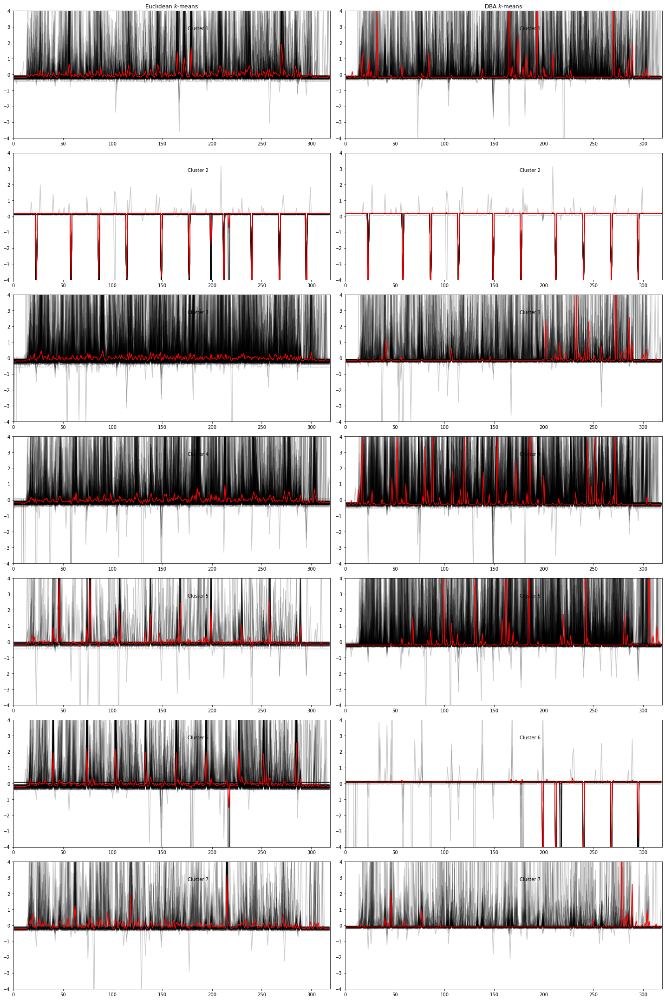

In [104]:
num_clust = 7
num_models = 2
sz = X_train.shape[1]
seed = 0

# Euclidean k-means
print("Euclidean k-means")
km = TimeSeriesKMeans(n_clusters=num_clust, verbose=True, random_state=seed)
y_pred_euc = km.fit_predict(X_train)

fig = plt.figure(figsize=(20,30))

for yi in range(num_clust):
    plt.subplot(num_clust, num_models, yi*num_models+1)
    for xx in X_train[y_pred_euc == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi),
             transform=plt.gca().transAxes)
    if yi == 0:
        plt.title("Euclidean $k$-means")

#X_train = TimeSeriesScalerMeanVariance().fit_transform(dfs.iloc[first_day:first_day+sample_days,0:sample_dnis])

# DBA-k-means
print("DBA k-means")
dba_km = TimeSeriesKMeans(n_clusters=num_clust,
                          n_init=2,
                          metric="dtw",
                          max_iter_barycenter=10,
                          random_state=seed)
y_pred_dtw = dba_km.fit_predict(X_train)

for yi in range(num_clust):
    plt.subplot(num_clust, num_models, yi*num_models+2)
    for xx in X_train[y_pred_dtw == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(dba_km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == 0:
        plt.title("DBA $k$-means")

plt.tight_layout()
plt.show()

#### Primeras observaciones sobre los clusters encontrados. 

- Para ambos modelos hay al menos 1 cluster que concentra los dnis con montos negativos altos
- El metodo dtw tiene menos ruido pero se nota mas sensible a cambios abruptos que la euclideana.

Clusters calculados con distancia euclideana (izquierda):
- Custers 3 y 4 concentran la mayoria de los casos, cuyo comportamiento es aleatorio.
- Clusters 2, 5 y 6 se observa cierta periodicidad en los montos
- Clusters 1 y 7 son ruidosos pero con picos en ciertos momentos.

Clusters calculados con distancia Dtw (derecha):
- Clusters 1, 3 y 7 son muy ruidosos y tienen picos en ciertos momentos.
- Clusters 2, 4, 5 y 6 tienen la mayor periodicidad. 
- Clusters 4 y 5 concentran mayoria de casos. 
- En el cluster 4 se observa cierta periodicidad, aunque con una interrupción abrupta en uno de sus periodos.




#### Analisis de silueta

Para kmeans con distancia euclideana el silhouette_score promedio es : 0.07020948240508663
Para kmeans con distancia dtw el silhouette_score promedio es : 0.06522029355096295


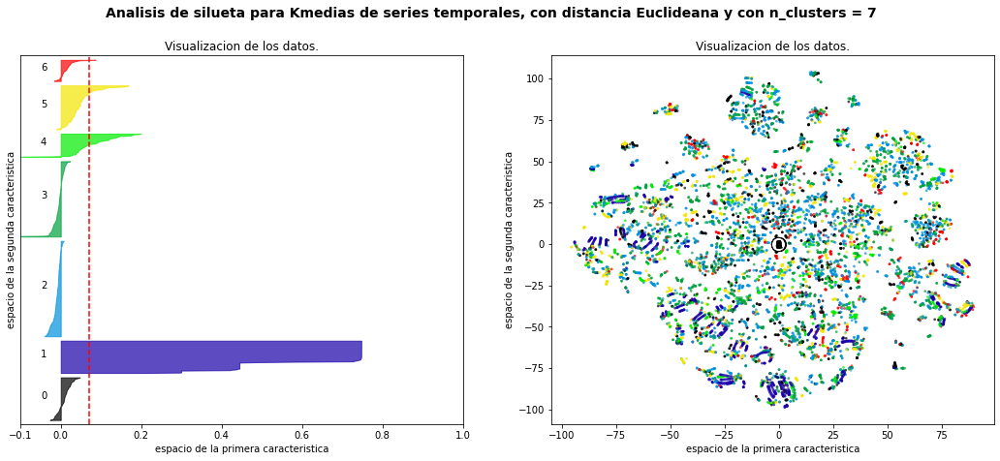

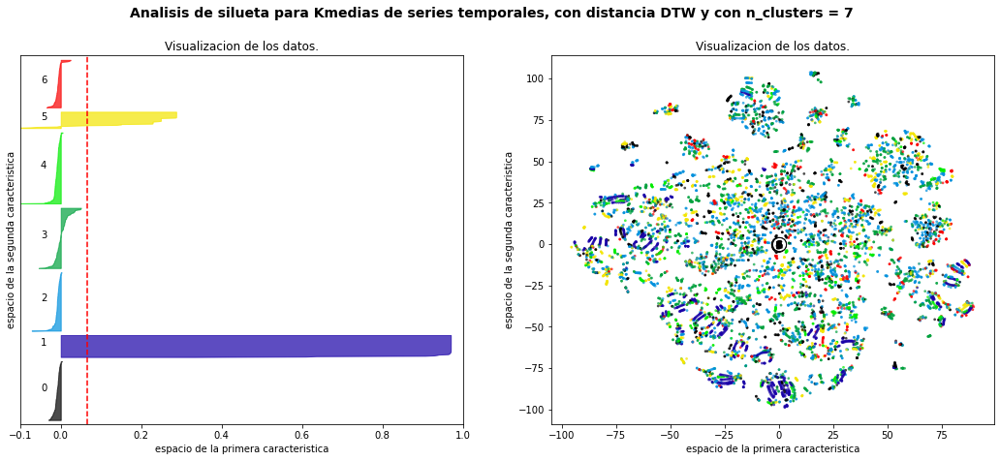

In [113]:
sse ={}

X = X_train
for n_model in range(num_models):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (num_clust + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    if n_model == 0:
        clusterer = km
        cluster_labels = y_pred_euc
    else:
        clusterer = dba_km
        cluster_labels = y_pred_dtw
        
    sse[n_model] = clusterer.inertia_

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    if n_model == 0:
        print("Para kmeans con distancia euclideana "
              "el silhouette_score promedio es :", silhouette_avg)
    else:
        print("Para kmeans con distancia dtw "
              "el silhouette_score promedio es :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(num_clust):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / num_clust)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Visualizacion de los datos.")
    ax1.set_xlabel("espacio de la primera caracteristica")
    ax1.set_ylabel("espacio de la segunda caracteristica")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    # 2nd Plot showing the actual clusters formed
    if n_model == 0:
        transact_labels = df_tsclust['cluster_ts_kmeuc'].values
    else:
        clusterer = dba_km
        cluster_labels = df_tsclust['cluster_ts_kmdtw'].values
        
    colors = cm.nipy_spectral(transact_labels.astype(float) / num_clust)
    ax2.scatter(X_tsne_all[:, 0], X_tsne_all[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("Visualizacion de los datos.")
    ax2.set_xlabel("espacio de la primera caracteristica")
    ax2.set_ylabel("espacio de la segunda caracteristica")
    
    if n_model == 0:
        plt.suptitle(("Analisis de silueta para Kmedias de series temporales, con distancia Euclideana y "
                  "con n_clusters = %d" % num_clust),
                 fontsize=14, fontweight='bold')
    else:
        plt.suptitle(("Analisis de silueta para Kmedias de series temporales, con distancia DTW y "
                  "con n_clusters = %d" % num_clust),
                 fontsize=14, fontweight='bold')
    
    #plt.savefig("kmeans_%d" % n_clusters, dpi=300)

A partir de los graficos de siluetas podemos observar que los clusters no se corresponden bien visualmente con los grupos encontrados en el TSNE realizado anteriormente en este practico. Sin enbargo, podemos ver que para el caso de la distancia euclideana el grupo violeta se destaca del resto, con una distribucion de puntos con mucha homogenieidad entre ellos y para con el resto de los clusters. Algo similar ocurre en los clusters encontrados con distancia DTW, con la diferencia que existe un segundo grupo amarillo que aparte del violeta, se destaca del resto con una sliueta mas homogenea, exceptuando el caso del violeta que al igual que en la distancia euclideana, es el mas homogeneo.

#### Analisis de clusters

Creamos un nuevo dataframe a partir de los dnis y sus respectivos clusters

In [168]:
dfts_km = pd.DataFrame({'dni_cliente':dfs.T.index.values, 'cluster_ts_kmeuc':y_pred_euc, 'cluster_ts_kmdtw':y_pred_dtw})

NameError: name 'dfs' is not defined

Balance de clases para cada clusterizador. Vemos que dtw tiene un mejor balance. 

In [114]:
dfts_km['cluster_ts_kmeuc'].value_counts()

2    240
3    190
5    111
0    108
1     82
4     59
6     54
Name: cluster_ts_kmeuc, dtype: int64

In [115]:
dfts_km['cluster_ts_kmdtw'].value_counts()

4    179
3    152
0    148
2    147
6    120
1     56
5     42
Name: cluster_ts_kmdtw, dtype: int64

In [26]:
np.arange(0,7)

array([0, 1, 2, 3, 4, 5, 6])

In [27]:
df['fecha_cupon_movimiento'].nunique()

319

In [28]:
df['fecha_cupon_movimiento'].max() - df['fecha_cupon_movimiento'].min()

Timedelta('326 days 00:00:00')

El rango de la primera fecha a la ultima es 7 dias mayor que la cantidad de dias totales. Esto se debe a que hubo 7 dias dentro de la serie temporal donde no hubo ningun consumo. Tomamos la desicion de desestimar este desfasaje ya que consideramos que el impacto de correrse 7 dias es poco representativo con respecto a la totalidad de dias. 

In [29]:
import datetime

cant_dias = len(dfs)

clust_cent_euc = pd.DataFrame(data=km.cluster_centers_.reshape(7, cant_dias).T, columns=np.arange(0,7))
clust_cent_euc['dates'] = pd.to_datetime([df['fecha_cupon_movimiento'].min() + datetime.timedelta(days=x) for x in range(cant_dias)])
clust_cent_euc.set_index('dates', inplace=True)

clust_cent_dtw = pd.DataFrame(data=dba_km.cluster_centers_.reshape(7, cant_dias).T, columns=np.arange(0,7))
clust_cent_dtw['dates'] = pd.to_datetime([df['fecha_cupon_movimiento'].min() + datetime.timedelta(days=x) for x in range(cant_dias)])
clust_cent_dtw.set_index('dates', inplace=True)

Text(0.5, 1.0, 'Time Series kmeans (Euclidean): Cluster 4')

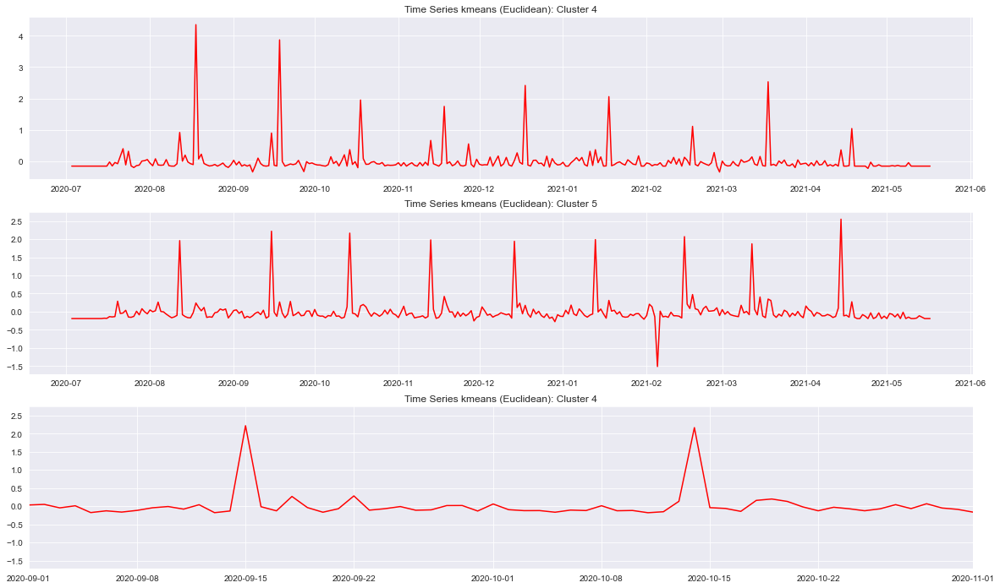

In [30]:
fig, axes = plt.subplots(3,1,figsize=(20,12))
axes[0].plot(clust_cent_euc[4], "r-")
axes[0].set_title("Time Series kmeans (Euclidean): Cluster 4")
axes[1].plot(clust_cent_euc[5], "r-")
#axes[1].set_xlim(pd.Timestamp('2020-11-01'), pd.Timestamp('2021-02-01'))
axes[1].set_title("Time Series kmeans (Euclidean): Cluster 5")
axes[2].plot(clust_cent_euc[5], "r-")
axes[2].set_xlim(pd.Timestamp('2020-09-01'), pd.Timestamp('2020-11-01'))
axes[2].set_title("Time Series kmeans (Euclidean): Cluster 4")


La imagen anterior muestra los clusters 4 y 5 calculados usando distancia euclideana, y ademas un acercamiento a dos picos del cluster 4. Ambos clusters presentan una periodicidad visible para todos los meses, y por lo que se observa en la tercera imagen, los picos ocurren cerca del 15 de cada mes.

El cluster 4 tiene una mayor variablidad en la amplitud de los picos que el cluster 5. El cluster 5 tiene un pico negativo en el mes de febrero, que sin embargo no interrumpe la periodicidad de los picos positivos.

Text(0.5, 1.0, 'Zoom: Fiestas de fin de año')

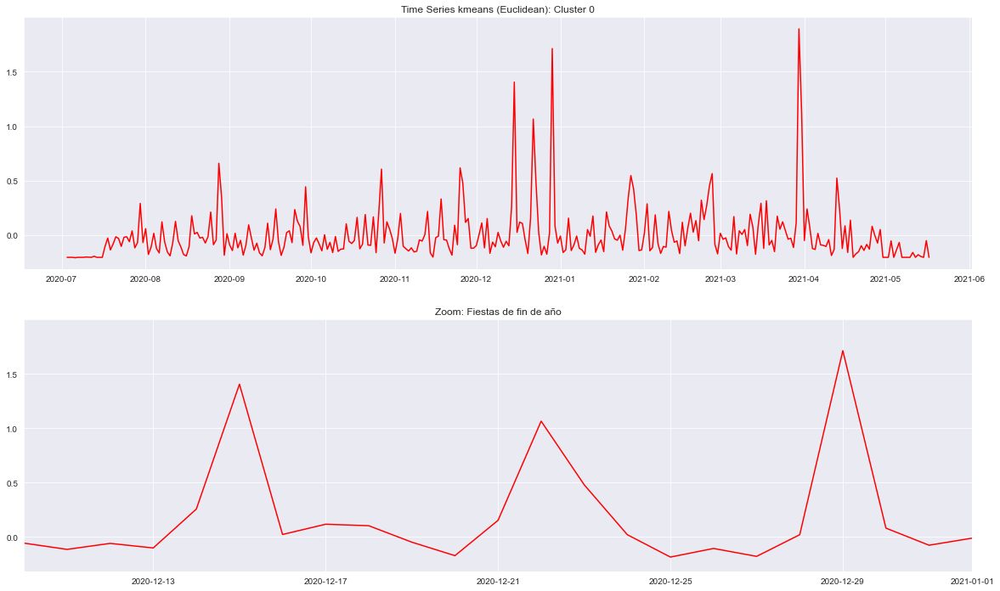

In [31]:
fig, axes = plt.subplots(2,1,figsize=(20,12))
axes[0].plot(clust_cent_euc[0], "r-")
axes[0].set_title("Time Series kmeans (Euclidean): Cluster 0")
axes[1].plot(clust_cent_euc[0], "r-")
axes[1].set_xlim(pd.Timestamp('2020-12-10'), pd.Timestamp('2021-01-01'))
axes[1].set_title("Zoom: Fiestas de fin de año")

La imagen anterior muestra el cluster 0 calculado con distancia euclideana, y luego un acercamiento a los ultimos meses del año, donde se pueden observar algunos picos de consumo. Esto puede explicarse debido a que en las fiestas de fin de año se suele consumir mas. Seria interesante verificar si en este cluster se encuentran clientes que consumen mas a fin de año. Se puede ver tambien un pico de consumo en el mes de Abril

Text(0.5, 1.0, 'Time Series kmeans (DTW): Cluster 3')

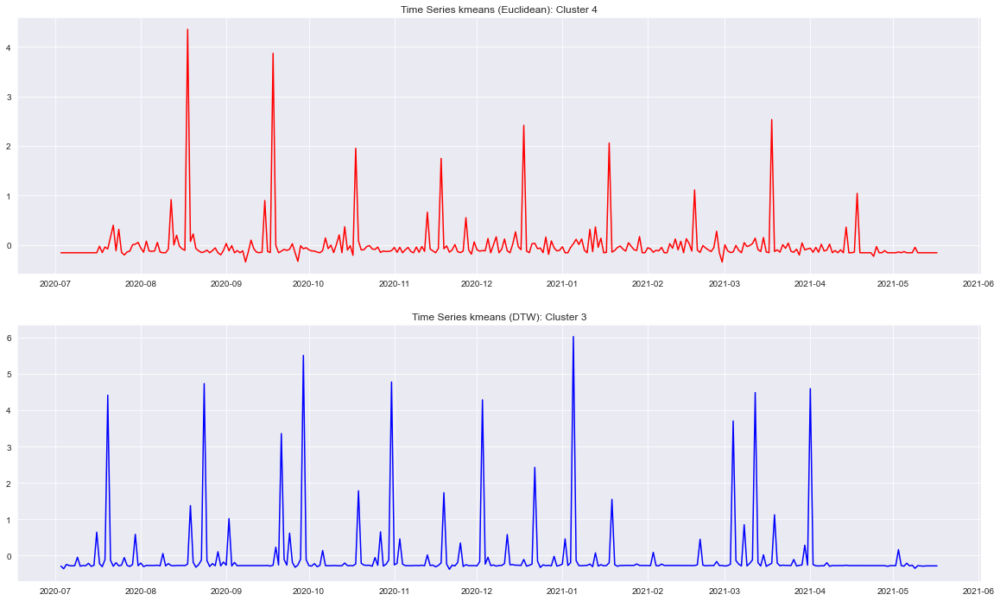

In [46]:
fig, axes = plt.subplots(2,1,figsize=(20,12))
axes[0].plot(clust_cent_euc[4], "r-")
axes[0].set_title("Time Series kmeans (Euclidean): Cluster 4")
axes[1].plot(clust_cent_dtw[3], "b-")
#axes[1].set_xlim(pd.Timestamp('2020-11-01'), pd.Timestamp('2021-02-01'))
axes[1].set_title("Time Series kmeans (DTW): Cluster 3")

En la imagen anterior se puede observar con detalle la diferencia entre un cluster calculado con distancia euclideana y otro con distancia DTW. Para el primer caso, existe una mayor presencia de ruido que en el segundo. Esto puede estar vinculado al metodo de distancia elegido. El cluster de arriba tiene una periodicidad visible. El de abajo podria tener periodicidad en los picos de mayor amplitud, no asi en los de menor amplitud. Cerca de Marzo y Abril esta periodicidad se pierde. 

Text(0.5, 1.0, 'Time Series kmeans (dtw): Cluster 1')

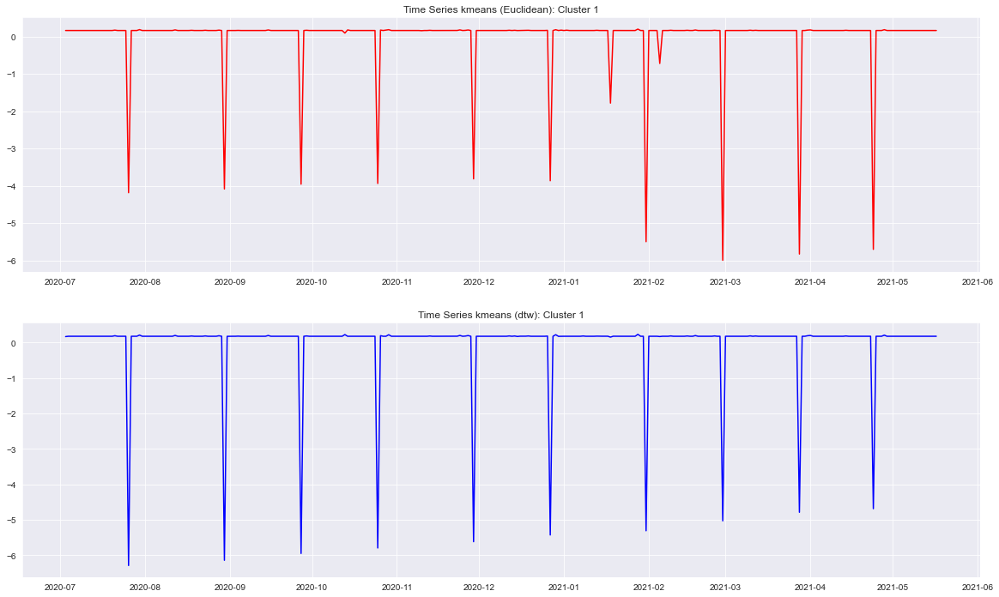

In [42]:
fig, axes = plt.subplots(2,1,figsize=(20,12))
axes[0].plot(clust_cent_euc[1], "r-")
axes[0].set_title("Time Series kmeans (Euclidean): Cluster 1")
axes[1].plot(clust_cent_dtw[1], "b-")
#axes[1].set_xlim(pd.Timestamp('2020-11-01'), pd.Timestamp('2021-02-01'))
axes[1].set_title("Time Series kmeans (dtw): Cluster 1")

Se puede observar en los analisis de silueta que el cluster 1 para ambos metodos de calculo devuelve un coeficiente de silueta alto, ya que los puntos para estos grupos estan bien definidos y separados del resto. Los clientes a los que les devuelven dinero son faciles de identificar, probablemente por el hecho de que sus montos son negativos y los cargos se hacen en fechas sistematicas.

#### Descomposicion de clusters en componentes de estacionalidad, tendencia y aleatorio

Descomponemos los clusters analizados mas arriba para buscar confirmar las observaciones realizadas

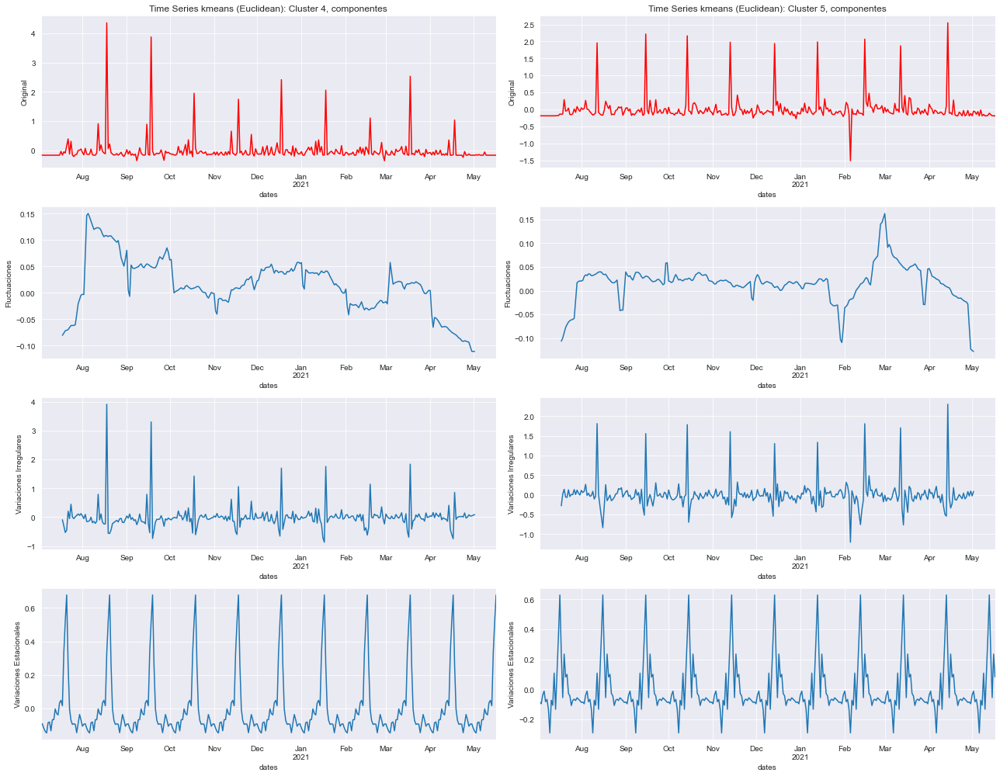

In [44]:
cluster_periodico_a = 4
cluster_periodico_b = 5

res = sm.tsa.seasonal_decompose(
    clust_cent_euc[cluster_periodico_a], model='additive', freq=30
    )

fig, (ax1,ax2,ax3,ax4) = plt.subplots(4,2, figsize=(18, 14))

ax1[0].set_title('Time Series kmeans (Euclidean): Cluster 4, componentes')
clust_cent_euc[cluster_periodico_a].plot(ax=ax1[0], color='red')
ax1[0].set_ylabel('Original')

res.trend.plot(ax=ax2[0])
ax2[0].set_ylabel('Fluctuaciones')

res.resid.plot(ax=ax3[0])
ax3[0].set_ylabel('Variaciones Irregulares')

res.seasonal.plot(ax=ax4[0])
ax4[0].set_ylabel('Variaciones Estacionales')

res = sm.tsa.seasonal_decompose(
    clust_cent_euc[cluster_periodico_b], model='additive', freq=30
    )

ax1[1].set_title('Time Series kmeans (Euclidean): Cluster 5, componentes')
clust_cent_euc[cluster_periodico_b].plot(ax=ax1[1], color='red')
ax1[1].set_ylabel('Original')

res.trend.plot(ax=ax2[1])
ax2[1].set_ylabel('Fluctuaciones')

res.resid.plot(ax=ax3[1])
ax3[1].set_ylabel('Variaciones Irregulares')

res.seasonal.plot(ax=ax4[1])
ax4[1].set_ylabel('Variaciones Estacionales')
plt.tight_layout()
plt.show()

- Cluster 4 (Euclidean): Se observa en el analisis de fluctuaciones como los distintos valores de los picos hacen que el grafico varie de mes a mes

- Cluster 5 (Euclidean): Se observan fluctuaciones mas estables, pero una gran variacion al final, correspondiente con el pico negativo en Febrero.

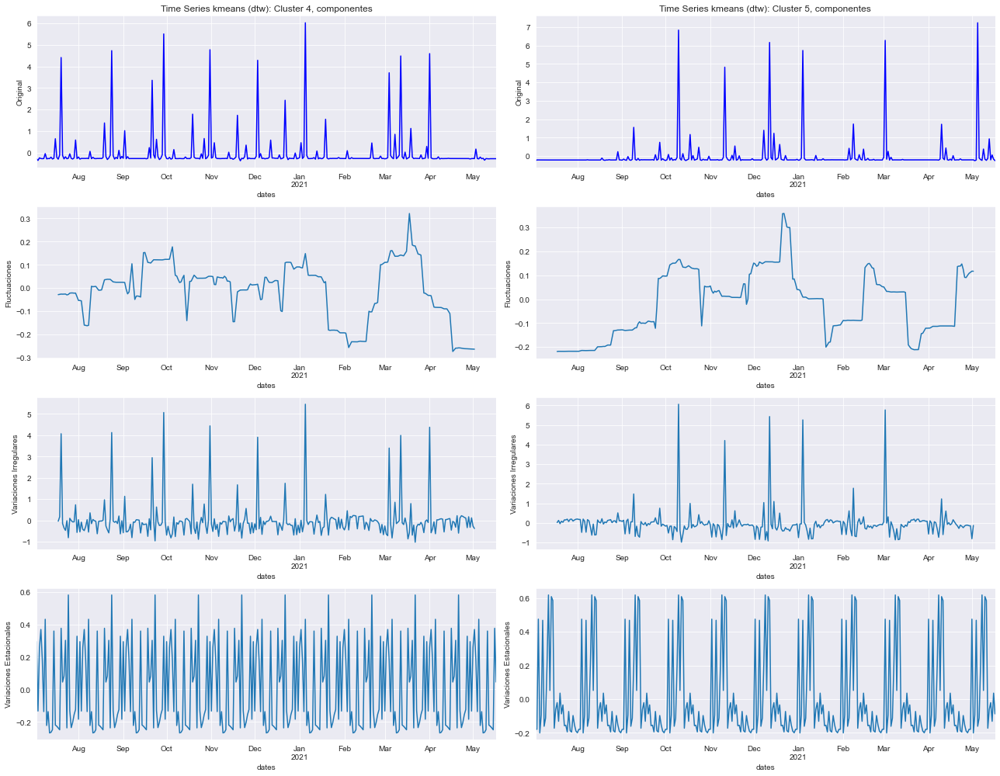

In [45]:
cluster_periodico_a = 3
cluster_periodico_b = 4

res = sm.tsa.seasonal_decompose(
    clust_cent_dtw[cluster_periodico_a], model='additive', freq=30
    )

fig, (ax1,ax2,ax3,ax4) = plt.subplots(4,2, figsize=(18, 14))

ax1[0].set_title('Time Series kmeans (dtw): Cluster 4, componentes')
clust_cent_dtw[cluster_periodico_a].plot(ax=ax1[0], color='blue')
ax1[0].set_ylabel('Original')

res.trend.plot(ax=ax2[0])
ax2[0].set_ylabel('Fluctuaciones')

res.resid.plot(ax=ax3[0])
ax3[0].set_ylabel('Variaciones Irregulares')

res.seasonal.plot(ax=ax4[0])
ax4[0].set_ylabel('Variaciones Estacionales')

res = sm.tsa.seasonal_decompose(
    clust_cent_dtw[cluster_periodico_b], model='additive', freq=30
    )

ax1[1].set_title('Time Series kmeans (dtw): Cluster 5, componentes')
clust_cent_dtw[cluster_periodico_b].plot(ax=ax1[1], color='blue')
ax1[1].set_ylabel('Original')

res.trend.plot(ax=ax2[1])
ax2[1].set_ylabel('Fluctuaciones')

res.resid.plot(ax=ax3[1])
ax3[1].set_ylabel('Variaciones Irregulares')

res.seasonal.plot(ax=ax4[1])
ax4[1].set_ylabel('Variaciones Estacionales')
plt.tight_layout()
plt.show()

- Cluster 4 (DTW): Se pueden ver que tanto los picos mas bajos como los distintos niveles de amplitud en los picos altos hacen que el grafico de fluctuaciones varie bastante, sobretodo al final donde parece que la periodicidad se pierde. 

- Cluster 5 (DTW): Existen algunos picos de consumo que en amplitud son similares, pero no parecen estar separados periodicamente. 

----

FIN